# Abundance Clusters

In [1]:
# This must be run inside docker contianers to have interactive visualziation
! export MPL_BACKEND=TkAgg

In [2]:
# server
# local_dir = '/root/host_home/luca'

# local
local_dir = '/root/host_home/sc-luca-explore'

import os
from pathlib import Path
os.chdir(local_dir)

import matplotlib
matplotlib.use('module://matplotlib_inline.backend_inline')
import matplotlib.pyplot as plt
import pandas as pd
import networkx as nx

from nb_ecotypeClustering import abundance

In [3]:
backup_dir = '/root/datos/maestria/netopaas/luca_explore/surgeries/'
atlas_dir = '/root/datos/maestria/netopaas/luca/data/atlas/'
meta_folder = f'{local_dir}/metadata/'
output_dir = 'results/ecotype_clustering/'
# The atlas with only tumor primary tissues and uicc stage annotated

cell_type_key = 'cell_type_adjusted'
sample_key = 'sample'
dataset_key = 'dataset'

In [47]:
from typing import Iterable, Dict

def load_aracne_graphs(cluster_ids: Iterable[int], time_label: str, stage_label: str) -> Dict[int, nx.Graph]:
    """Load ARACNe edge lists from text files into NetworkX graphs."""
    base_dir = Path(local_dir) / "results/graph_generation/legacy/cluster_runs2" / stage_label
    net_prefix = time_label.replace('_funcnames', '')
    graphs: Dict[int, nx.Graph] = {}

    normalized_ids = sorted(int(cid) for cid in set(cluster_ids) if pd.notna(cid))
    for cid in normalized_ids:
        cluster_dir = base_dir / f"cluster_{cid:02d}"
        candidate_files = [
            # cluster_dir / f"net_{net_prefix}_cluster{cid}.txt",
            cluster_dir / f"net_{net_prefix}_cluster{cid}_MI_pearson.txt",
        ]
        net_path = next((p for p in candidate_files if p.exists()), None)
        if net_path is None:
            print(f"[load_aracne_graphs] Missing network file for cluster {cid} ({stage_label})")
            continue

        # Use NetworkX to read the tab-separated edge list with attributes
        G = nx.read_edgelist(
            net_path,
            delimiter='\t',
            data=[('MI', float), ('pvalue', float), ('pearson', float), ('pvals', float), ('sign', str)],
            create_using=nx.Graph(),
            nodetype=str,
        )

        # Normalize attribute names and provide a canonical 'weight'
        for _, _, d in G.edges(data=True):
            # Canonical weight: use MI if present, else absolute Pearson
            d['weight'] = d.get('MI', abs(d.get('pearson', 1.0)))
            if 'pvalue' in d:
                d['p_value'] = d['pvalue']

        G.graph['source_path'] = str(net_path)
        graphs[cid] = G

    return graphs

## I-II Leiden Wu

Get the relative abundance of cell type per sample.
NECCESARY IMPORTS

In [5]:
time = 'I-II_leidenwu_funcnames'
time_solo = time.split('_')[0]
time_suffix = 'early' if time_solo == 'I-II' else 'late'
category_map = abundance.cell_category_mapping

# Unstack the group counts
groups = pd.read_csv(f'{meta_folder}/groups_{time}.csv', index_col=0)
groups.sort_values([cell_type_key, sample_key])
groups.set_index([cell_type_key,sample_key], inplace=True)
cutoff = groups.loc[:, '0']
# We dont remove the cutoff because it messes with the dims
cutoff = pd.DataFrame(cutoff[cutoff > 1])
samp_type = cutoff.unstack().transpose()

# Normalize the counts
samp_type = samp_type.fillna(0)
corr_types = (samp_type.T / samp_type.T.sum()).T

groups.reset_index(inplace=True)
group_dataset = groups.groupby(['sample','dataset']).sum()
group_dataset.reset_index(inplace=True)
corr_types = pd.merge(corr_types, group_dataset.loc[:,[sample_key,'dataset']], how='left', left_on=sample_key, right_on=sample_key)
corr_types.set_index(sample_key, inplace=True)


print(f'Size of Corr_types: {corr_types.shape}')

Size of Corr_types: (122, 51)


Import CLUSTERS  if they exist if not error

In [6]:
if not 'membership' in corr_types.columns:
    df_short = pd.read_csv(f'{output_dir}/membership_by_cluster_{time_suffix}.csv', index_col=0)
    corr_types = pd.merge(corr_types, df_short['membership'], how='left', right_index=True, left_index=True)
else:
    print('Memberhsip column is already present, delete it if you want to reimport')

# This is important for all later visualizations
unique_clusters = corr_types["membership"].unique()

corr_types

,B cell,B cell dividing,Ciliated,Club_AT2/1_high,DC mature,Endothelial cell arterial,Endothelial cell capillary,Endothelial cell lymphatic,Endothelial cell venous,Fibroblast adventitial,...,Tumor OxPhos_Prolif,Tumor Tumor ImmunoSup,Tumor_NE_Prol,cDC1,cDC2,myeloid dividing,pDC,stromal dividing,dataset,membership
sample,,,,,,,,,,,,,,,,,,,,,
Chen_Zhang_2020_NSCLC-1,0.425497,0.000000,0.000000,0.001656,0.000000,0.009382,0.044150,0.000000,0.049669,0.000000,...,0.000000,0.002759,0.000000,0.002208,0.003863,0.000000,0.002759,0.0,Chen_Zhang_2020,0
Chen_Zhang_2020_NSCLC-11,0.019734,0.000000,0.001845,0.000321,0.000562,0.000000,0.000000,0.000321,0.012033,0.000160,...,0.000000,0.008824,0.008503,0.000241,0.003209,0.000562,0.000963,0.0,Chen_Zhang_2020,1
Chen_Zhang_2020_NSCLC-2,0.142195,0.000000,0.000000,0.000000,0.001030,0.000000,0.000000,0.001546,0.012880,0.010046,...,0.000000,0.004122,0.000000,0.003091,0.011592,0.000773,0.001803,0.0,Chen_Zhang_2020,0
Chen_Zhang_2020_NSCLC-3,0.107605,0.000000,0.000695,0.000000,0.000695,0.000000,0.000000,0.000000,0.004032,0.002502,...,0.000000,0.000695,0.000000,0.002085,0.003476,0.000278,0.004866,0.0,Chen_Zhang_2020,0
Chen_Zhang_2020_NSCLC-6,0.011220,0.000000,0.003866,0.000943,0.000849,0.000377,0.005940,0.000660,0.011786,0.000471,...,0.000189,0.022534,0.000471,0.002734,0.056195,0.012729,0.000849,0.0,Chen_Zhang_2020,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zilionis_Klein_2019_p4t1,0.039377,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001832,0.000000,...,0.035714,0.000000,0.000000,0.002747,0.021062,0.002747,0.007326,0.0,Zilionis_Klein_2019,0
Zilionis_Klein_2019_p4t2,0.028770,0.000000,0.000000,0.000000,0.004960,0.000000,0.000000,0.000000,0.002976,0.000000,...,0.038690,0.003968,0.000000,0.000000,0.031746,0.001984,0.013889,0.0,Zilionis_Klein_2019,0
Zilionis_Klein_2019_p4t3,0.026211,0.000000,0.000000,0.000000,0.001589,0.000000,0.000000,0.000000,0.001589,0.000000,...,0.033360,0.001589,0.000000,0.001589,0.030183,0.001589,0.006354,0.0,Zilionis_Klein_2019,0


IMPORT GRAPHS IF EXIST

In [7]:
import pickle
import os

Gs_E = {}

# For pearson
# for fname in os.listdir(output_dir):
#     if fname.startswith(f"G_{time_solo}_") and fname.endswith(".pkl"):
#         cluster_id = fname[len(f"G_{time_solo}_"):-4]
#         with open(os.path.join(output_dir, fname), "rb") as f:
#             Gs_E[int(cluster_id)] = pickle.load(f)

# Gs = Gs_E

stage_label = time_suffix  # 'early' or 'late' based on the current timepoint
cluster_ids = [int(cid) for cid in unique_clusters if pd.notna(cid)]
Gs = load_aracne_graphs(cluster_ids, time, stage_label)

Gs

{0: <networkx.classes.graph.Graph at 0x7fccc0aa0b90>,
 1: <networkx.classes.graph.Graph at 0x7fccc0aa26d0>,
 2: <networkx.classes.graph.Graph at 0x7fccc0c2f0d0>}

### Box plot general

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:622: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_title(f"Ln(Relative Abundance) {title}")


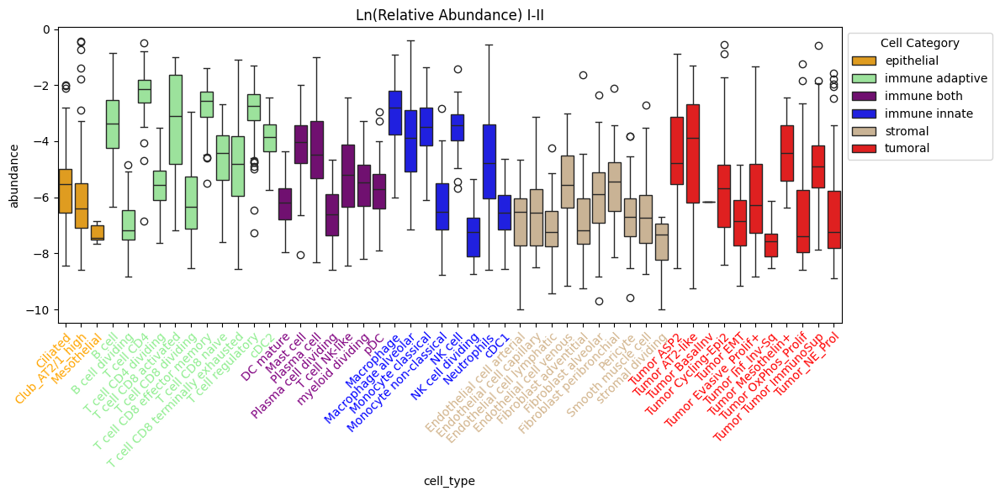

In [72]:
abundance.plot_celltype_boxplot(corr_types.drop(columns=['dataset',
                                                        #  'membership'
                                                         ]), time_solo,
                                 abundance.cell_category_mapping, abundance.color_map)

#### Immune

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:622: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_title(f"Ln(Relative Abundance) {title}")
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:622: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_title(f"Ln(Relative Abundance) {title}")
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_ho

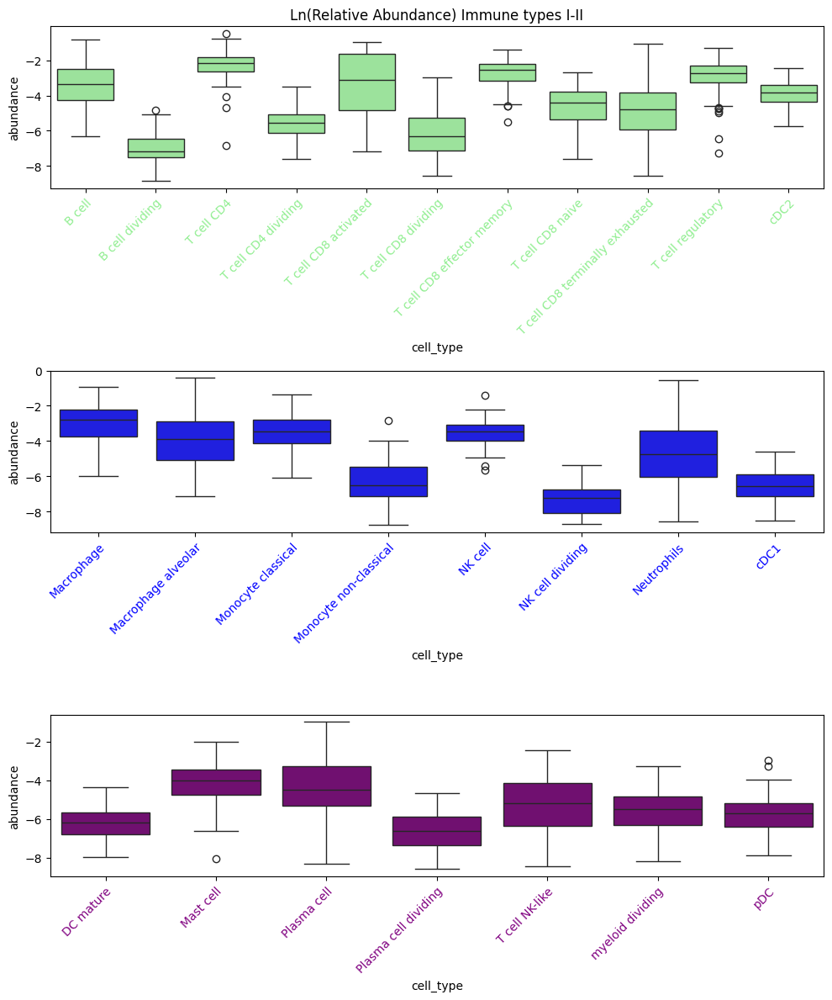

In [73]:
cats_of_interest = ['immune adaptive',
                     'immune innate', 'immune both'
                     ]

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Immune types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax)
    # ax.tick_params(axis='x', labelcolor='black')
    # ax.set_xticklabels([])
    ax.get_legend().remove()
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

#### Stromal

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:622: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_title(f"Ln(Relative Abundance) {title}")
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:622: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_title(f"Ln(Relative Abundance) {title}")
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_ho

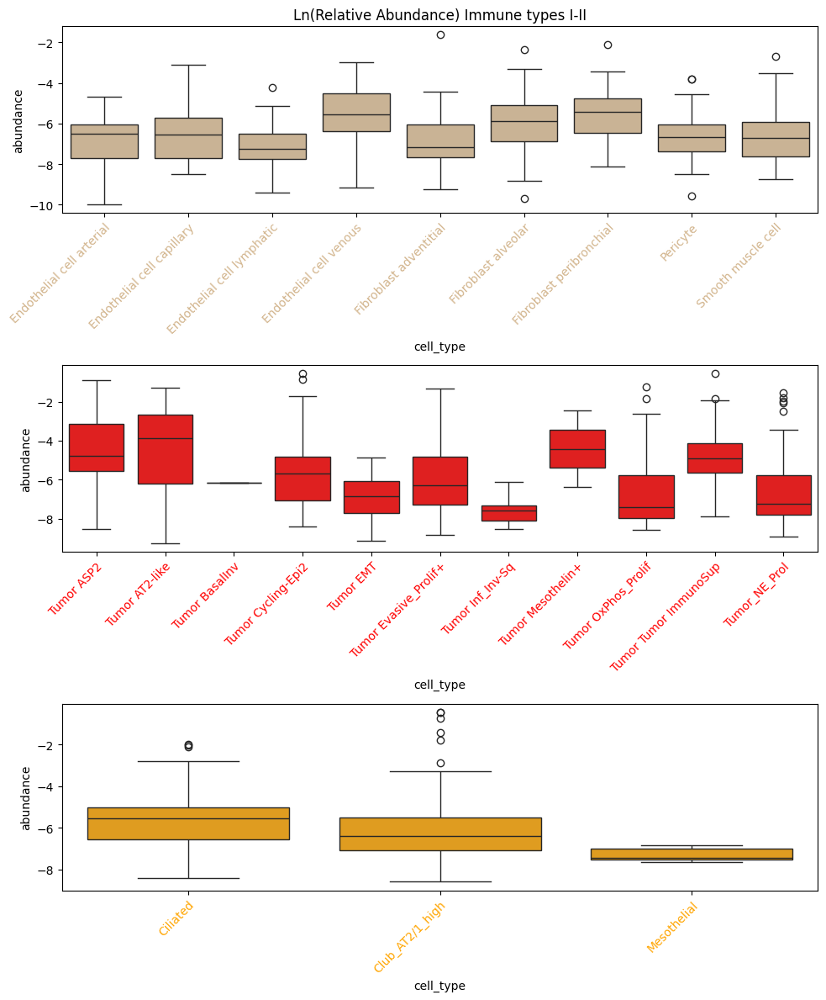

In [74]:
cats_of_interest = ['stromal', 'tumoral', 'epithelial']

# unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Immune types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax)
    ax.get_legend().remove()
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:656: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


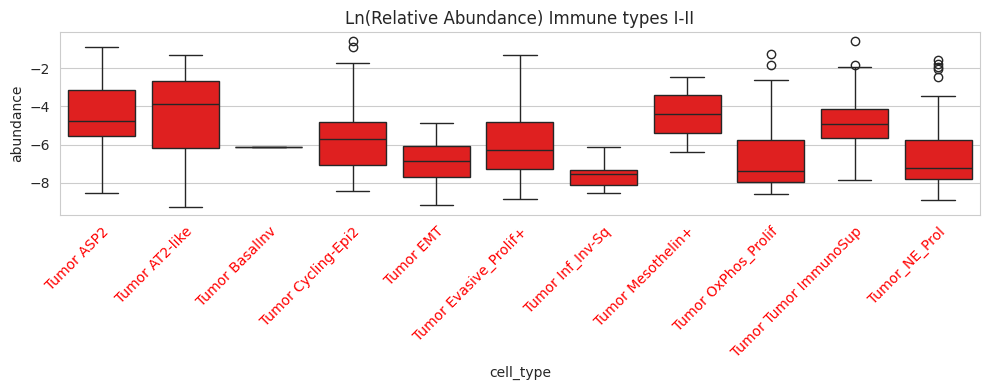

In [15]:
cats_of_interest = [ 'tumoral']

# unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Immune types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax)
    ax.get_legend().remove()
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


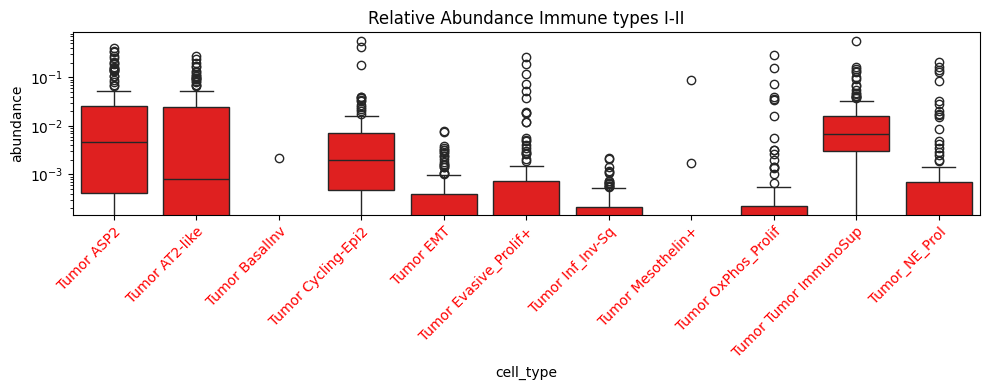

In [17]:
cats_of_interest = [ 'tumoral']

# unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Immune types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax, log_scale=False)
    ax.get_legend().remove()
    ax.set_yscale('log')
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

### Calculate clusters

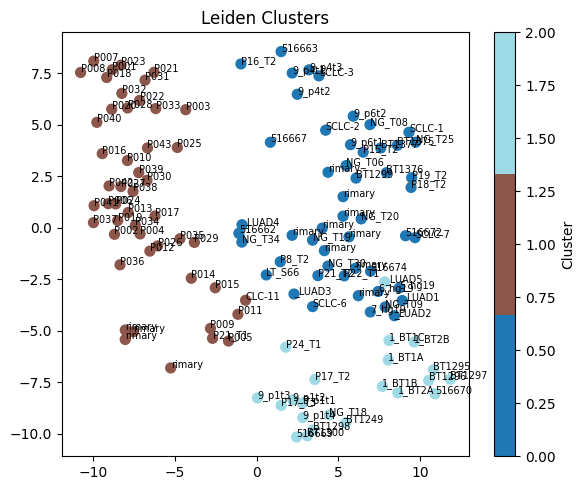

,B cell,B cell dividing,Ciliated,Club_AT2/1_high,DC mature,Endothelial cell arterial,Endothelial cell capillary,Endothelial cell lymphatic,Endothelial cell venous,Fibroblast adventitial,...,Tumor OxPhos_Prolif,Tumor Tumor ImmunoSup,Tumor_NE_Prol,cDC1,cDC2,myeloid dividing,pDC,stromal dividing,dataset,membership
sample,,,,,,,,,,,,,,,,,,,,,
Chen_Zhang_2020_NSCLC-1,0.425497,0.0,0.000000,0.001656,0.000000,0.009382,0.04415,0.000000,0.049669,0.000000,...,0.000000,0.002759,0.000000,0.002208,0.003863,0.000000,0.002759,0.0,Chen_Zhang_2020,0
Chen_Zhang_2020_NSCLC-11,0.019734,0.0,0.001845,0.000321,0.000562,0.000000,0.00000,0.000321,0.012033,0.000160,...,0.000000,0.008824,0.008503,0.000241,0.003209,0.000562,0.000963,0.0,Chen_Zhang_2020,1
Chen_Zhang_2020_NSCLC-2,0.142195,0.0,0.000000,0.000000,0.001030,0.000000,0.00000,0.001546,0.012880,0.010046,...,0.000000,0.004122,0.000000,0.003091,0.011592,0.000773,0.001803,0.0,Chen_Zhang_2020,0
Chen_Zhang_2020_NSCLC-3,0.107605,0.0,0.000695,0.000000,0.000695,0.000000,0.00000,0.000000,0.004032,0.002502,...,0.000000,0.000695,0.000000,0.002085,0.003476,0.000278,0.004866,0.0,Chen_Zhang_2020,0
Chen_Zhang_2020_NSCLC-6,0.011220,0.0,0.003866,0.000943,0.000849,0.000377,0.00594,0.000660,0.011786,0.000471,...,0.000189,0.022534,0.000471,0.002734,0.056195,0.012729,0.000849,0.0,Chen_Zhang_2020,0


In [ ]:
g = abundance.cluster_samples_leiden(corr_types.drop(columns=['dataset','membership']), k=4, res=0.2)

# Create a mapping from sample name to membership
membership_map = {v["name"]: v["membership"] for v in g.vs}

# Add the membership column to corr_types_III
corr_types["membership"] = corr_types.index.map(membership_map)
unique_clusters = corr_types["membership"].unique()
corr_types.head()

In [92]:
df_short = corr_types[['dataset', 'membership']].sort_values('membership')
df_short.to_csv(f'{output_dir}/membership_by_cluster_{time_suffix}.csv')
df_short

,dataset,membership
sample,,
Chen_Zhang_2020_NSCLC-1,Chen_Zhang_2020,0
Lambrechts_Thienpont_2018_6653_scrBT1425_hg19,Lambrechts_Thienpont_2018_6653,0
Lambrechts_Thienpont_2018_6653_scrBT1426_hg19,Lambrechts_Thienpont_2018_6653,0
Lambrechts_Thienpont_2018_6653_scrBT1427_hg19,Lambrechts_Thienpont_2018_6653,0
Laughney_Massague_2020_GSM3516662,Laughney_Massague_2020,0
...,...,...
P17_T3,Zuani,2
P17_T2,Zuani,2
Lambrechts_Thienpont_2018_6149v1_BT1249,Lambrechts_Thienpont_2018_6149v1,2


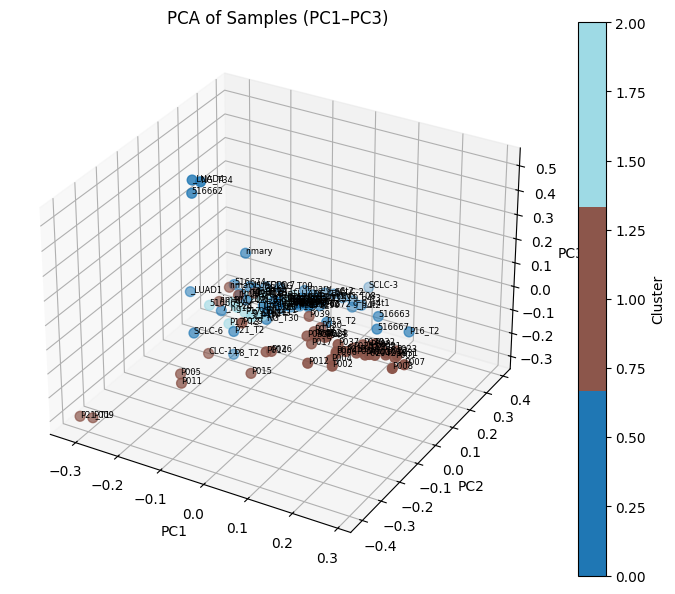

[plot_pca_from_corr_types] Top cell types per PC (by absolute loading):
     PC  rank                   cell_type   loading
0   PC1     1        T cell CD8 activated  0.740339
1   PC1     2         Macrophage alveolar -0.339001
2   PC1     3                  Macrophage -0.315155
3   PC1     4  T cell CD8 effector memory  0.262394
4   PC1     5                  Tumor ASP2 -0.195404
5   PC2     1                  T cell CD4  0.663245
6   PC2     2         Macrophage alveolar -0.520519
7   PC2     3                      B cell  0.311231
8   PC2     4        T cell CD8 activated -0.297091
9   PC2     5              Tumor AT2-like -0.205069
10  PC3     1             Club_AT2/1_high  0.767214
11  PC3     2         Macrophage alveolar -0.519227
12  PC3     3                  T cell CD4 -0.245576
13  PC3     4                      B cell -0.161420
14  PC3     5                  Macrophage  0.131539


,PC,rank,cell_type,loading
0,PC1,1,T cell CD8 activated,0.740339
1,PC1,2,Macrophage alveolar,-0.339001
2,PC1,3,Macrophage,-0.315155
3,PC1,4,T cell CD8 effector memory,0.262394
4,PC1,5,Tumor ASP2,-0.195404
5,PC2,1,T cell CD4,0.663245
6,PC2,2,Macrophage alveolar,-0.520519
7,PC2,3,B cell,0.311231
8,PC2,4,T cell CD8 activated,-0.297091
9,PC2,5,Tumor AT2-like,-0.205069


In [15]:
abundance.plot_pca_from_corr_types( corr_types.drop(columns=['dataset']) )

### Abundance Heatmap

/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


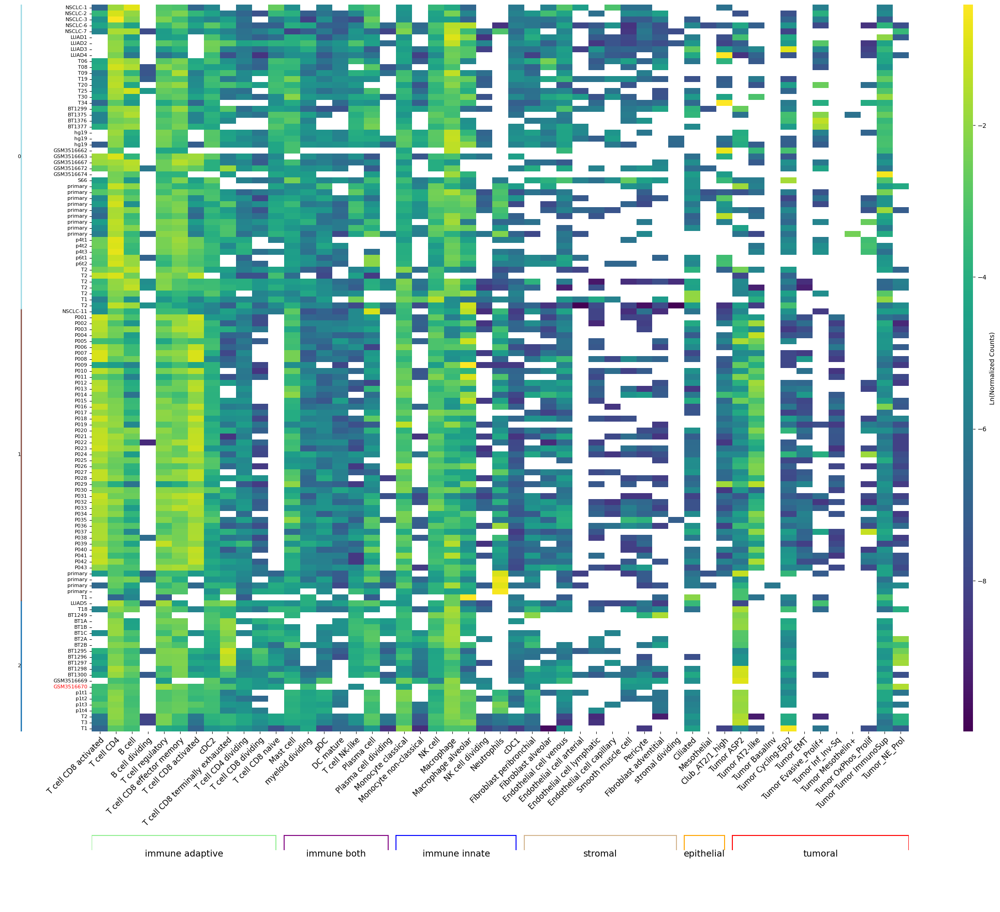

In [96]:
a = abundance.plot_abundance_heatmap(corr_types, show_plot=False, group_by_membership=True)
# a = abundance.plot_abundance_heatmap(corr_types.drop(columns='membership'), show_plot=False, group_by_membership=True)

/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


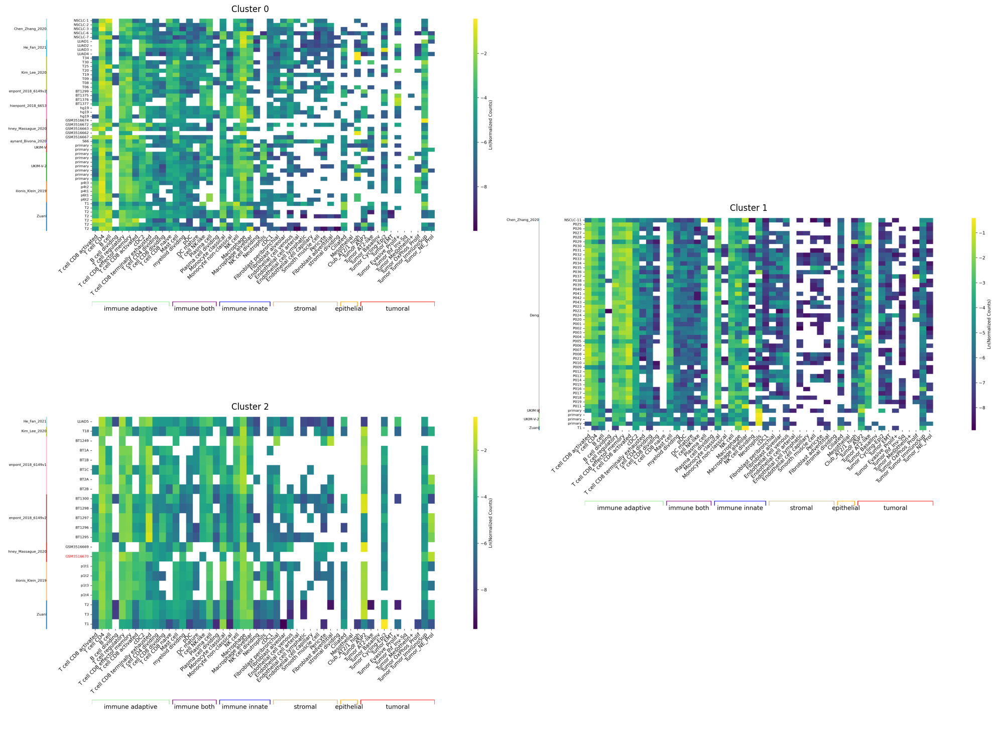

In [97]:
import io
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Initialize main figure and grid
unique_clusters = sorted(c for c in corr_types["membership"].unique() if pd.notna(c))
ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1

fig = plt.figure(figsize=(20, 8 * nrows))  # Main figure

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    if subset.empty:
        continue

    # Generate heatmap figure with lighter footprint
    temp_fig = abundance.plot_abundance_heatmap(
        subset,
        show_plot=False,
        figsize=(16, 10),
    )

    buf = io.BytesIO()
    temp_fig.savefig(buf, format="png", bbox_inches="tight", dpi=200)
    plt.close(temp_fig)  # Close temporary figure early to free memory

    buf.seek(0)
    with Image.open(buf) as img:
        img_array = np.array(img)
    buf.close()

    # Switch back to main figure explicitly
    plt.figure(fig.number)

    # Add subplot to main figure
    rs = 2 if (is_unpair and i == len(unique_clusters) - 2) else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)
    ax.imshow(img_array)
    ax.axis("off")  # Hide main figure's axes (use image's baked-in axes)
    ax.set_title(f"Cluster {cluster_id}")

plt.tight_layout()
plt.show()

### Cluster boxplots

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.

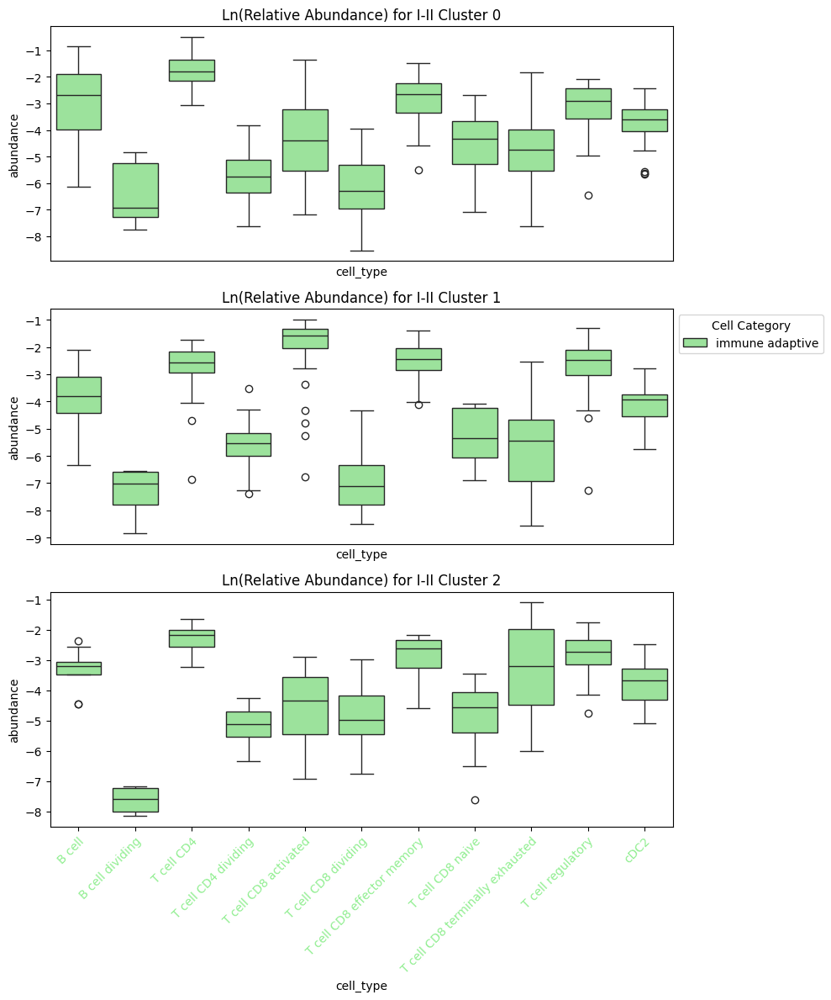

In [99]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
fig = plt.figure(figsize=(10, 4*nrows))


for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if category_map(col) == 'immune adaptive' ]
    subset = subset[cols]    
    
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset, title=f"for {time_solo} Cluster {cluster_id}",
                                     category_map=category_map, cat_colors=abundance.color_map, ax=ax, xlabel_color='black')
    
    if i != 1:
        ax.get_legend().remove()

    if i // ncols != nrows - 1:
        if is_unpair and i == len(unique_clusters) - 2:
            continue
        
        ax.set_xticks([])
        ax.set_xticklabels([])


plt.tight_layout()
plt.show()

In [10]:
long_df['cell_category'].unique()

array(['immune adaptive', 'epithelial', 'immune both', 'stromal',
       'immune innate', 'tumoral'], dtype=object)

In [11]:
cell_type_colors

{'B cell': 'lightgreen',
 'B cell dividing': 'lightgreen',
 'Ciliated': 'orange',
 'Club_AT2/1_high': 'orange',
 'DC mature': 'purple',
 'Endothelial cell arterial': '#D2B48C',
 'Endothelial cell capillary': '#D2B48C',
 'Endothelial cell lymphatic': '#D2B48C',
 'Endothelial cell venous': '#D2B48C',
 'Fibroblast adventitial': '#D2B48C',
 'Fibroblast alveolar': '#D2B48C',
 'Fibroblast peribronchial': '#D2B48C',
 'Macrophage': 'blue',
 'Macrophage alveolar': 'blue',
 'Mast cell': 'purple',
 'Mesothelial': 'orange',
 'Monocyte classical': 'blue',
 'Monocyte non-classical': 'blue',
 'NK cell': 'blue',
 'NK cell dividing': 'blue',
 'Neutrophils': 'blue',
 'Pericyte': '#D2B48C',
 'Plasma cell': 'purple',
 'Plasma cell dividing': 'purple',
 'Smooth muscle cell': '#D2B48C',
 'T cell CD4': 'lightgreen',
 'T cell CD4 dividing': 'lightgreen',
 'T cell CD8 activated': 'lightgreen',
 'T cell CD8 dividing': 'lightgreen',
 'T cell CD8 effector memory': 'lightgreen',
 'T cell CD8 naive': 'lightgreen',


/tmp/ipykernel_1071/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


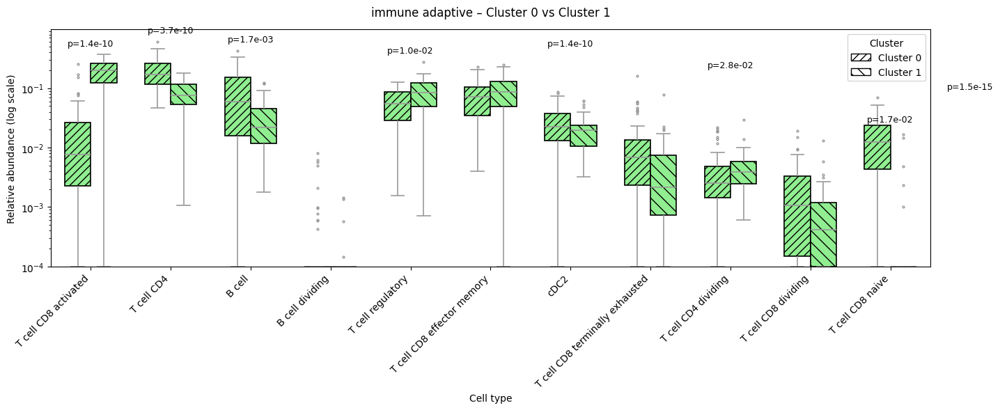

/tmp/ipykernel_1071/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


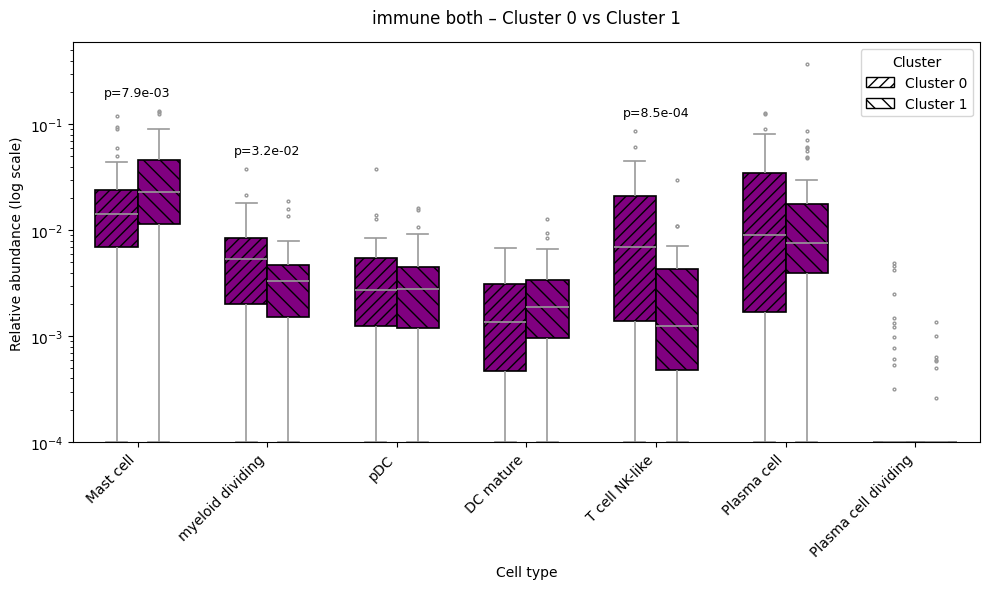

/tmp/ipykernel_1071/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


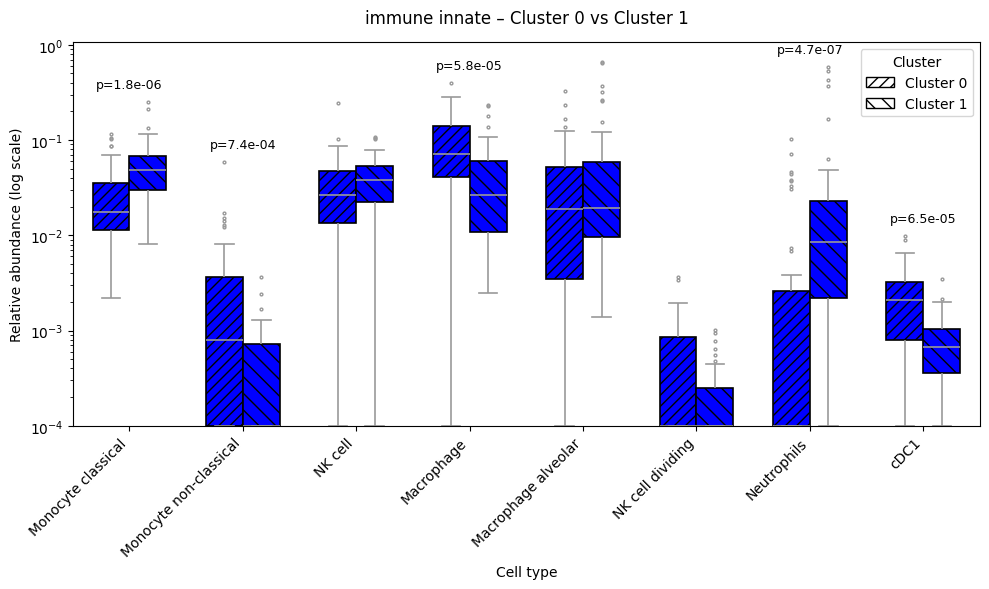

/tmp/ipykernel_1071/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


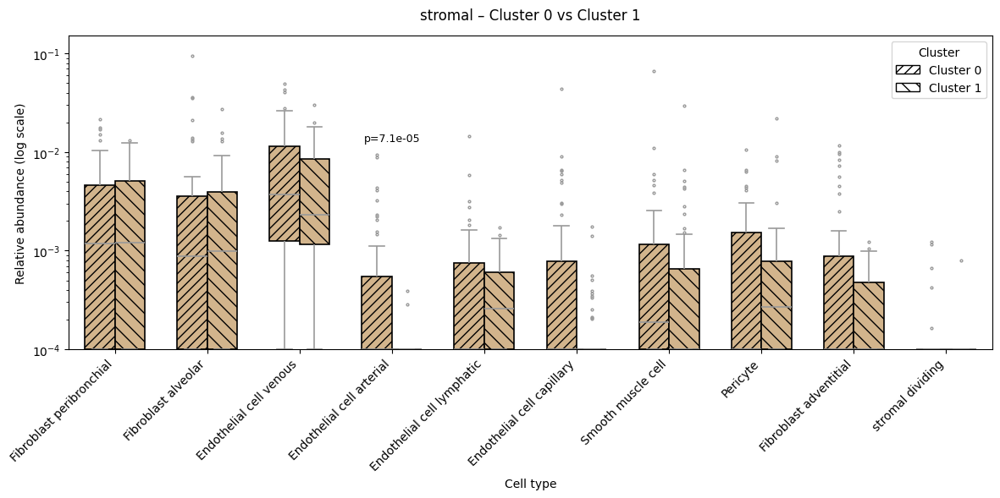

/tmp/ipykernel_1071/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


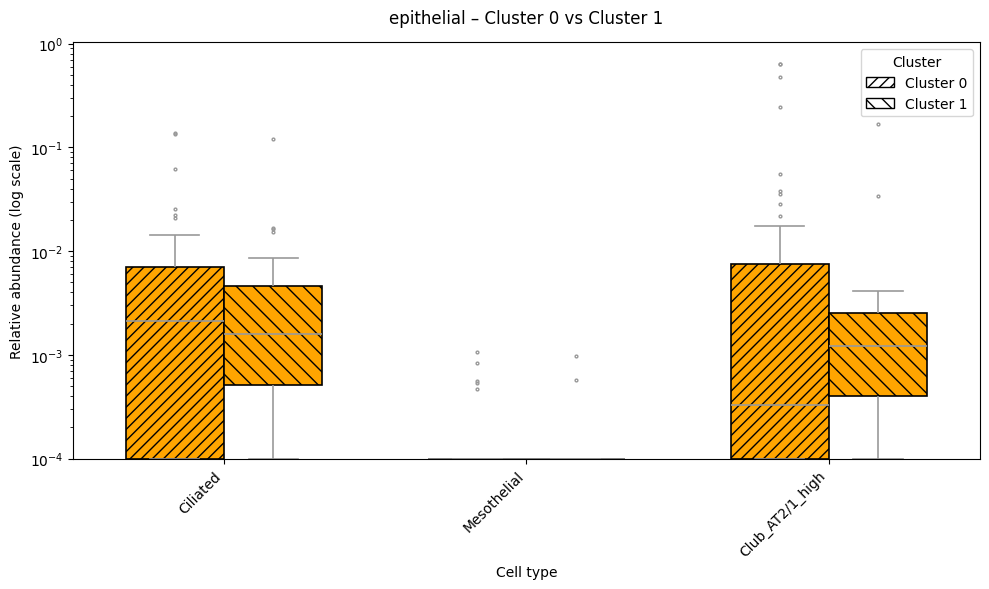

/tmp/ipykernel_1071/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


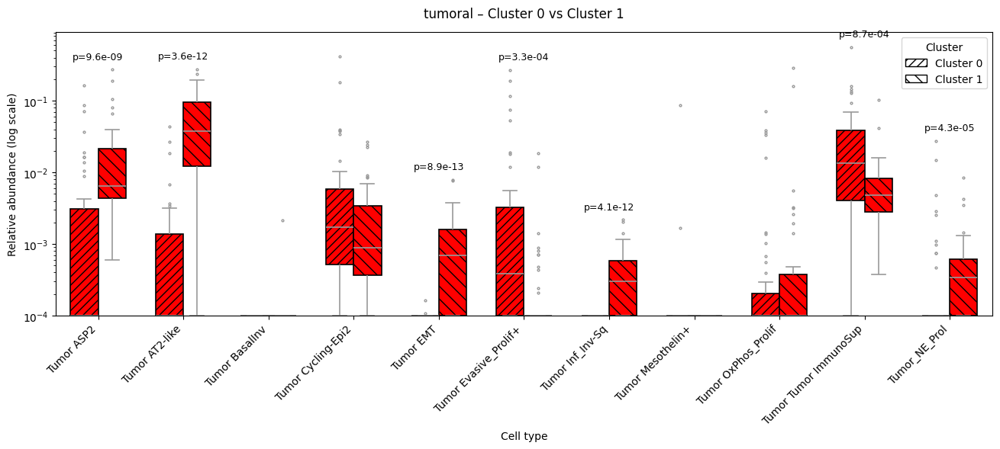

In [12]:
import seaborn as sns
from scipy.stats import mannwhitneyu
from matplotlib.patches import Patch, PathPatch

target_clusters = [0, 1]
cluster_hatches = {cluster: pattern for cluster, pattern in zip(target_clusters, ['///', '\\\\'])}

cluster_df = corr_types[corr_types['membership'].isin(target_clusters)].copy()
value_cols = [c for c in cluster_df.columns if c not in ('dataset', 'membership')]
long_df = (
    cluster_df.reset_index()
    .melt(id_vars=['sample', 'membership'], value_vars=value_cols,
          var_name='cell_type', value_name='abundance')
)
long_df['cell_category'] = long_df['cell_type'].map(abundance.cell_category_mapping)
long_df = long_df.dropna(subset=['cell_category'])
long_df['membership'] = long_df['membership'].astype(int)
long_df['abundance_plot'] = long_df['abundance'].clip(lower=1e-4)

category_colors = long_df[['cell_type', 'cell_category']].drop_duplicates()
category_colors['color'] = category_colors['cell_category'].apply(
    lambda cat: abundance.color_map.get(cat, '#bbbbbb')
)
cell_type_colors = dict(zip(category_colors['cell_type'], category_colors['color']))

for category, cell_types in abundance.cell_categories.items():
    # Get all cells in data belonging to this category
    cells_in_category = long_df[long_df['cell_category'] == category]['cell_type'].unique()
    
    # Start with cells that are in the predefined list (to preserve order)
    present_cells = [ct for ct in cell_types if ct in cells_in_category]
    
    # Append any other cells found in data for this category (e.g. new Tumor types)
    present_cells.extend([ct for ct in cells_in_category if ct not in present_cells])

    if not present_cells:
        continue
    # ...

    cat_df = long_df[long_df['cell_category'] == category].copy()
    fig_width = max(10, 1.2 * len(present_cells))
    fig, ax = plt.subplots(figsize=(fig_width, 6))

    sns.boxplot(
        data=cat_df,
        x='cell_type',
        y='abundance_plot',
        hue='membership',
        order=present_cells,
        hue_order=target_clusters,
        palette=['white'] * len(target_clusters),
        width=0.65,
        linewidth=1.2,
        fliersize=2,
        ax=ax,
    )

    num_clusters = len(target_clusters)
    num_cells = len(present_cells)
    boxes = [patch for patch in ax.patches if isinstance(patch, PathPatch)]
    for i, patch in enumerate(boxes):
        cluster_idx = i // num_cells
        cell_idx = i % num_cells
        if cluster_idx >= num_clusters:
            break
        cell_type = present_cells[cell_idx]
        cluster = target_clusters[cluster_idx]
        patch.set_facecolor(cell_type_colors.get(cell_type, '#bbbbbb'))
        patch.set_edgecolor('black')
        patch.set_alpha(1.0)
        patch.set_hatch(cluster_hatches[cluster])
    legend_handles = [
        Patch(facecolor='white', edgecolor='black', hatch=cluster_hatches[cluster],
              label=f'Cluster {cluster}')
        for cluster in target_clusters
    ]
    ax.legend(handles=legend_handles, title='Cluster', loc='upper right')

    ax.set_title(f'{category} – Cluster 0 vs Cluster 1', pad=14)
    ax.set_xlabel('Cell type')
    ax.set_ylabel('Relative abundance (log scale)')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

    y_min = cat_df['abundance_plot'].min()
    y_max = cat_df['abundance_plot'].max()
    ax.set_yscale('log')
    ax.set_ylim(max(1e-4, y_min * 0.8), y_max * 1.6)

    for idx, cell_type in enumerate(present_cells):
        group_vals = [
            cat_df[(cat_df['cell_type'] == cell_type) & (cat_df['membership'] == cluster)]['abundance'].dropna()
            for cluster in target_clusters
        ]
        if not all(len(vals) for vals in group_vals):
            continue

        _, p_value = mannwhitneyu(group_vals[0], group_vals[1], alternative='two-sided')
        if p_value >= 0.05:
            continue

        cell_max = cat_df[cat_df['cell_type'] == cell_type]['abundance_plot'].max()
        ax.text(idx, cell_max * 1.3, f'p={p_value:.1e}', ha='center', va='bottom', fontsize=9, color='black')

    plt.tight_layout()
    plt.show()


/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abu

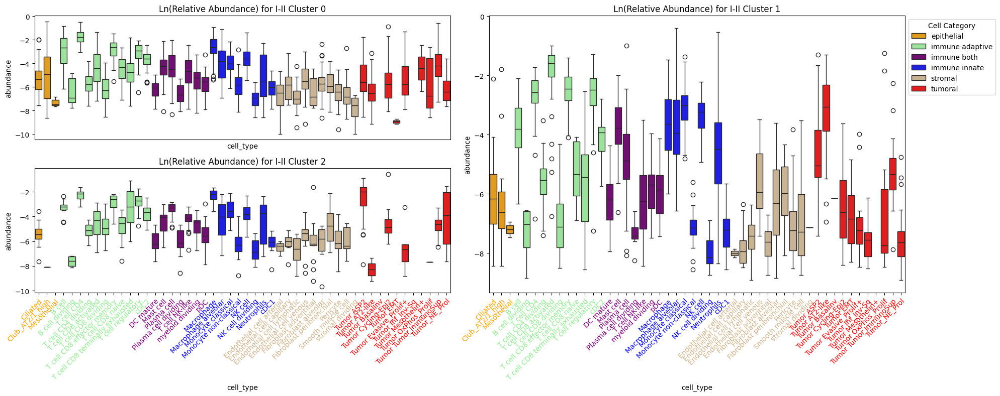

In [100]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
nrows2 = nrows -1 if is_unpair else nrows
fig = plt.figure(figsize=(20, 4*nrows))


for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")    
    
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset.drop(columns=['dataset']),title=f"for {time_solo} Cluster {cluster_id}",
                                     category_map=category_map, cat_colors=abundance.color_map, ax=ax)
    
    if i // ncols != nrows - 1:
        if is_unpair and i == len(unique_clusters) - 2:
            continue
        
        ax.set_xticks([])
        ax.set_xticklabels([])        
        
    if i != 1:
        ax.get_legend().remove()


plt.tight_layout()
plt.show()

### Coabundance GRAPHS

In [17]:
Gs = {}

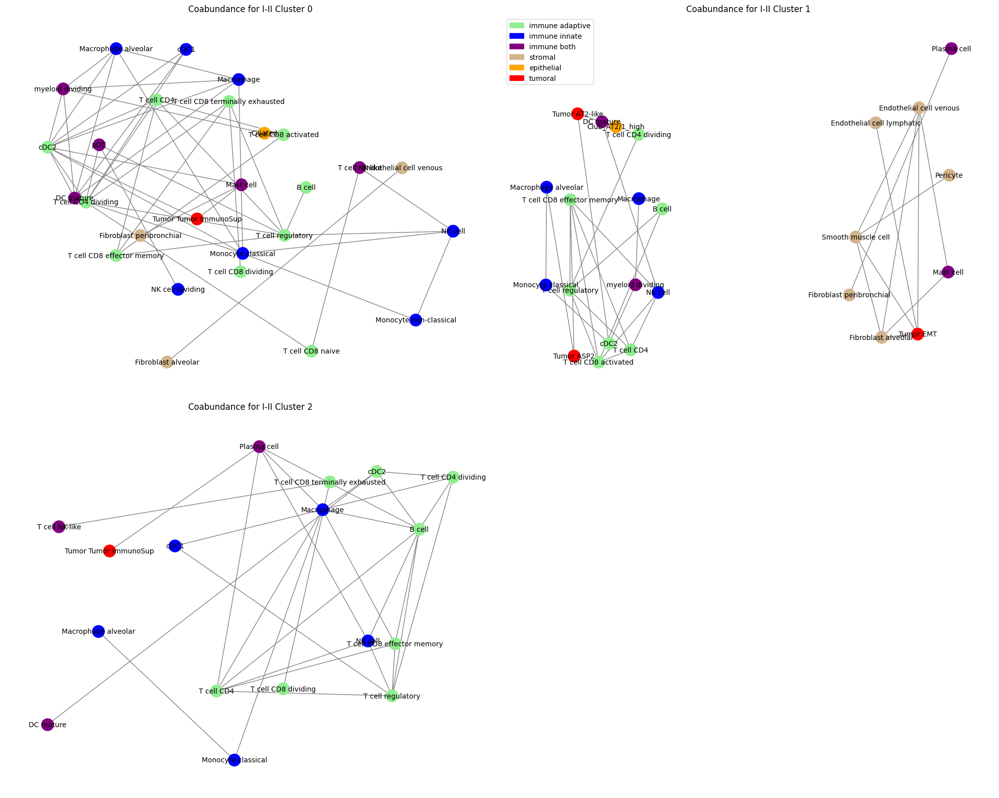

In [8]:
unique_clusters = corr_types["membership"].unique()
ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
fig = plt.figure(figsize=(20, 8*nrows))

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id]#.drop(columns="membership")

    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    
    abundance.draw_graph(G, ax, f'Coabundance for {time_solo} Cluster {cluster_id}', scale2=7, font_size=10)
    ax.axis('off')
    if i != 1:
        ax.get_legend().remove()

plt.tight_layout()
plt.show()


### dEGREE CENTRAL

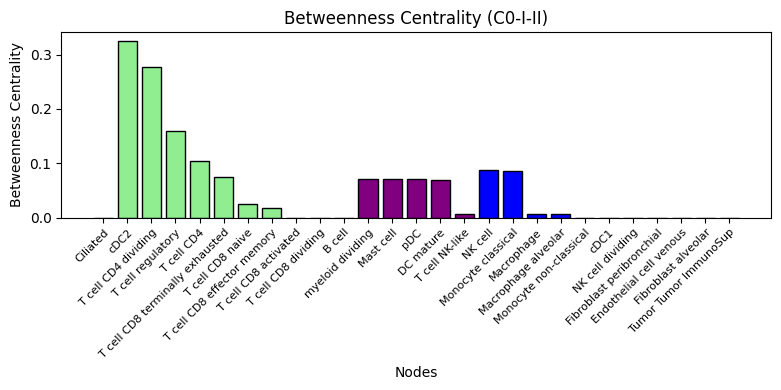

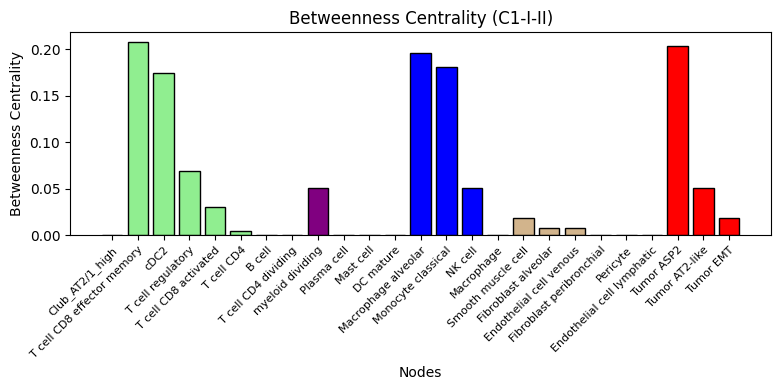

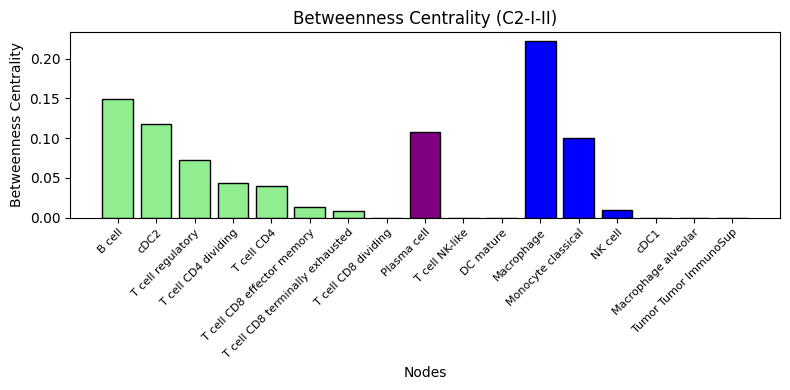

In [9]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    
    fig, ax = plt.subplots(figsize=(8, 4))

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    Gs[cluster_id] = abundance.plot_degree_centrality(G, time=f'C{cluster_id}-{time_solo}', ax=ax,
                                      betweenness=True
                                      )

    plt.tight_layout()
    plt.show()

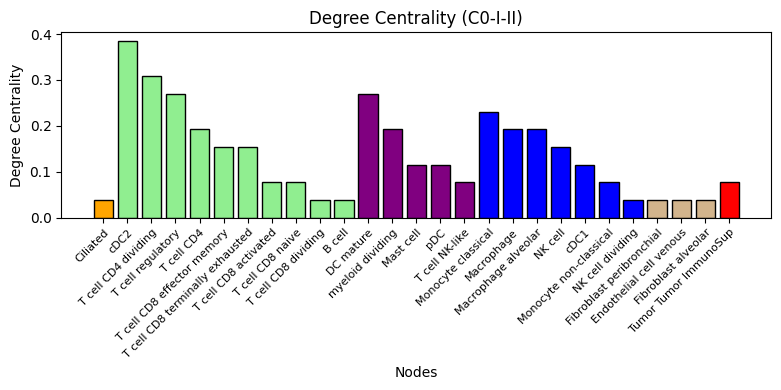

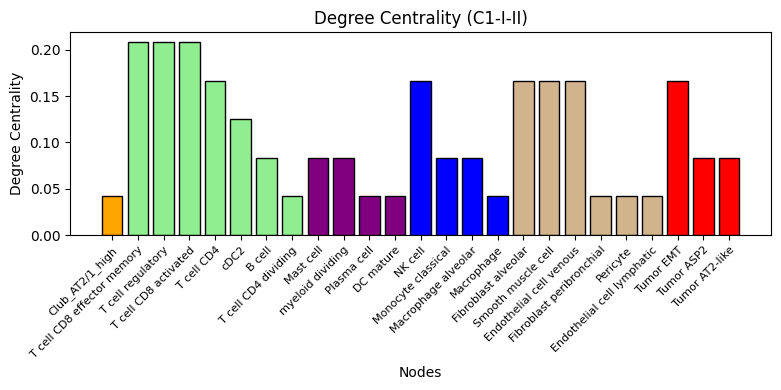

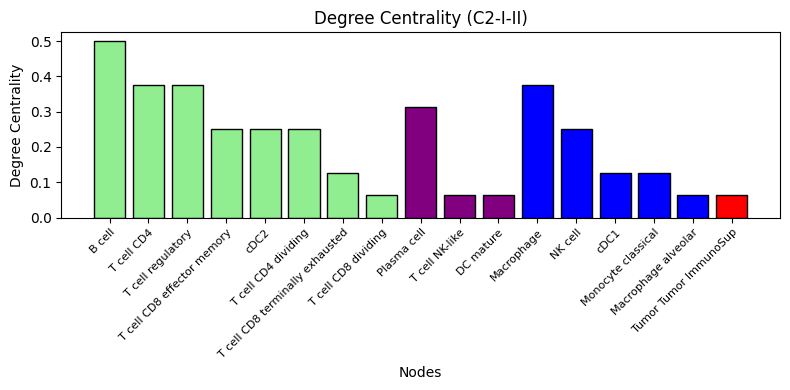

In [10]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    
    fig, ax = plt.subplots(figsize=(8, 4))

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    Gs[cluster_id] = abundance.plot_degree_centrality(G, time=f'C{cluster_id}-{time_solo}', ax=ax,
                                      betweenness=False
                                      )

    plt.tight_layout()
    plt.show()

### Export graphs

In [39]:
import pickle

for cluster_id, G in Gs.items():
    filename = f"{output_dir}/G_{time_solo}_{cluster_id}.pkl"
    with open(filename, "wb") as f:
        pickle.dump(G, f)
print("Saved all graphs in Gs.")

Saved all graphs in Gs.


### Sankey Plot

In [24]:
use_gradients = False  # toggle Sankey ribbon gradients

In [ ]:
import io
import holoviews as hv
import matplotlib.pyplot as plt
from holoviews.core.dimension import Dimensioned
from IPython.display import display, Image

hv.extension('matplotlib')
idx = 0
G = Gs[idx]

# Generate the sankey plot
result = abundance.sankey(
    G,
    category_map,
    abundance.color_map,
    title=f'Sankey of {time_solo} Cluster',
    holo_kws={'fontsize': {'title': 18}},
    include_intra_self=True,
    # gradients=use_gradients
 )

if isinstance(result, Dimensioned):
    fig = hv.render(result, backend='matplotlib')
else:
    fig = result

buf = io.BytesIO()
fig.savefig(buf, format='png', bbox_inches='tight', dpi=100)
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

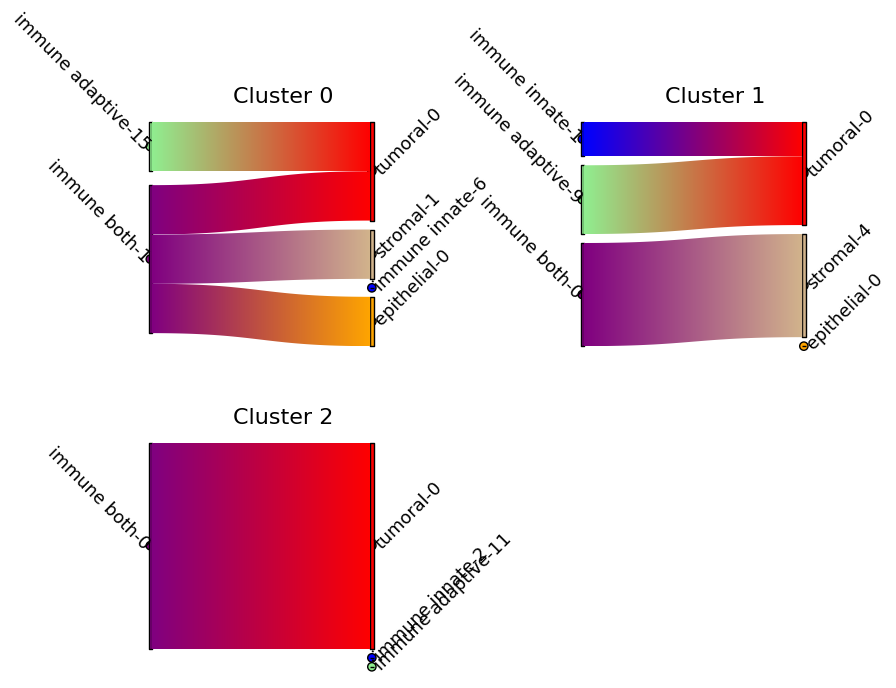

In [125]:
import io
import holoviews as hv
import matplotlib.pyplot as plt
from IPython.display import display, Image

# Ensure matplotlib backend to preserve custom rotated labels hook in abundance.sankey
hv.extension('matplotlib')

# Build deterministically so order is stable
sankeys = {
    cid: abundance.sankey(
        Gs[cid],
        category_map,
        abundance.color_map,
        title=f'Cluster {cid}',
        # gradients=use_gradients
    )
    for cid in sorted(Gs)
}

# Create layout (grid) of Sankey plots
layout = hv.NdLayout(sankeys, kdims=['Cluster']).cols(2)

# Backend-specific sizing
layout = layout.opts(
    hv.opts.Sankey(fig_inches=0.8, aspect=0.95, fontsize={'title': 16}, show_frame=False),
    hv.opts.Layout(tight=True, hspace=0.0, vspace=0.0)
 )

fig = hv.render(layout, backend='matplotlib')

buf = io.BytesIO()
fig.savefig(buf, format='png', bbox_inches='tight', dpi=100)
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

In [38]:
hv.save(layout, f'{output_dir}/sankey_{time_solo}.png')  # Save the layout as a PNG file

## III-IV Leiden Wu

Get the relative abundance of cell type per sample

In [17]:
time = 'III-IV_leidenwu_funcnames'
time_solo = time.split('_')[0]
time_suffix = 'early' if time_solo == 'I-II' else 'late'

# Unstack the group counts
groups = pd.read_csv(f'{meta_folder}/groups_{time}.csv', index_col=0)
groups.sort_values([cell_type_key, sample_key])
groups.set_index([cell_type_key,sample_key], inplace=True)
cutoff = groups.loc[:, '0']
# We dont remove the cutoff because it messes with the dims
cutoff = pd.DataFrame(cutoff[cutoff > 1])
samp_type = cutoff.unstack().transpose()

# Normalize the counts
samp_type = samp_type.fillna(0)
corr_types = (samp_type.T / samp_type.T.sum()).T

groups.reset_index(inplace=True)
group_dataset = groups.groupby(['sample','dataset']).sum()
group_dataset.reset_index(inplace=True)
corr_types = pd.merge(corr_types, group_dataset.loc[:,[sample_key,'dataset']], how='left', left_on=sample_key, right_on=sample_key)
corr_types.set_index(sample_key, inplace=True)


print(f'Size of Corr_types: {corr_types.shape}')

Size of Corr_types: (111, 52)


Import CLUSTERS  if they exist if not error

In [18]:
if not 'membership' in corr_types.columns:
    df_short = pd.read_csv(f'{output_dir}/membership_by_cluster_{time_suffix}.csv', index_col=0)
    corr_types = pd.merge(corr_types, df_short['membership'], how='left', right_index=True, left_index=True)
else:
    print('Memberhsip column is already present, delete it if you want to reimport')

# This is important for all later visualizations
unique_clusters = corr_types["membership"].unique()

corr_types

,AT2,B cell,B cell dividing,Ciliated,DC mature,Endothelial cell arterial,Endothelial cell capillary,Endothelial cell lymphatic,Endothelial cell venous,Fibroblast adventitial,...,Tumor NE_HPA,Tumor Plastic_AS_NE,Tumor ROS1+,cDC1,cDC2,myeloid dividing,pDC,stromal dividing,dataset,membership
sample,,,,,,,,,,,,,,,,,,,,,
BD_immune01,0.0,0.007598,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.002533,0.000000,...,0.009287,0.013930,0.000633,0.000000,0.000000,0.004854,0.000000,0.0,Hu,0
BD_immune02,0.0,0.352115,0.000374,0.002059,0.000000,0.0,0.0,0.000000,0.000374,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.004493,0.000936,0.000936,0.0,Hu,1
BD_immune03,0.0,0.086106,0.002485,0.000000,0.000756,0.0,0.0,0.000000,0.000432,0.000000,...,0.016746,0.035436,0.001188,0.000540,0.006158,0.000864,0.003349,0.0,Hu,1
BD_immune04,0.0,0.050995,0.000000,0.001549,0.000715,0.0,0.0,0.000000,0.000596,0.000000,...,0.000000,0.000000,0.000596,0.000000,0.008102,0.003694,0.002502,0.0,Hu,1
BD_immune05,0.0,0.062460,0.000966,0.000000,0.000644,0.0,0.0,0.000000,0.000966,0.000644,...,0.003220,0.001932,0.002254,0.000000,0.000966,0.004185,0.000000,0.0,Hu,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zilionis_Klein_2019_p7t1,0.0,0.021429,0.000000,0.000000,0.001648,0.0,0.0,0.000000,0.008791,0.000000,...,0.000000,0.001099,0.003297,0.000000,0.019780,0.001648,0.013187,0.0,Zilionis_Klein_2019,0
Zilionis_Klein_2019_p7t2,0.0,0.020810,0.000000,0.000000,0.003375,0.0,0.0,0.000000,0.009561,0.000000,...,0.000000,0.001125,0.006749,0.001125,0.014623,0.001687,0.017435,0.0,Zilionis_Klein_2019,0
p019t,0.0,0.019305,0.000000,0.039897,0.000000,0.0,0.0,0.000000,0.009009,0.004505,...,0.002574,0.003861,0.172458,0.000000,0.010296,0.003218,0.001931,0.0,Bishoff,0


IMPORT GRAPHS IF EXIST

In [13]:
# For pearson
# for fname in os.listdir(output_dir):
#     if fname.startswith(f"G_{time_solo}_") and fname.endswith(".pkl"):
#         cluster_id = fname[len(f"G_{time_solo}_"):-4]
#         with open(os.path.join(output_dir, fname), "rb") as f:
#             Gs_E[int(cluster_id)] = pickle.load(f)

# Gs = Gs_E

stage_label = time_suffix  # 'early' or 'late' based on the current timepoint
cluster_ids = [int(cid) for cid in unique_clusters if pd.notna(cid)]
Gs = load_aracne_graphs(cluster_ids, time, stage_label)
Gs

{0: <networkx.classes.graph.Graph at 0x7fccb9ce2f50>,
 1: <networkx.classes.graph.Graph at 0x7fccb9ce3f90>,
 2: <networkx.classes.graph.Graph at 0x7fccb9c65f50>}

### Box plot general

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


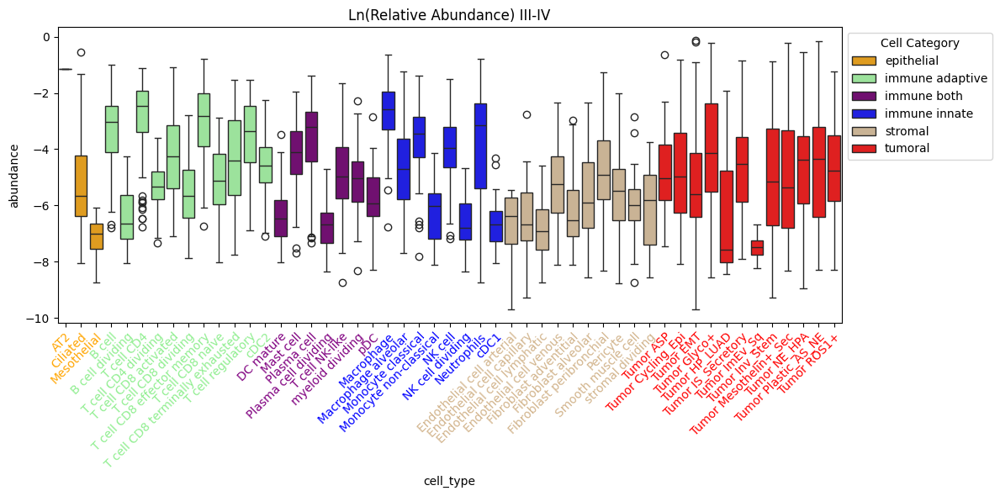

In [20]:
abundance.plot_celltype_boxplot(corr_types.drop(columns=['dataset',
                                                         'membership'
                                                         ]), time_solo,
    abundance.cell_category_mapping, abundance.color_map)
plt.show()

#### Immune

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero e

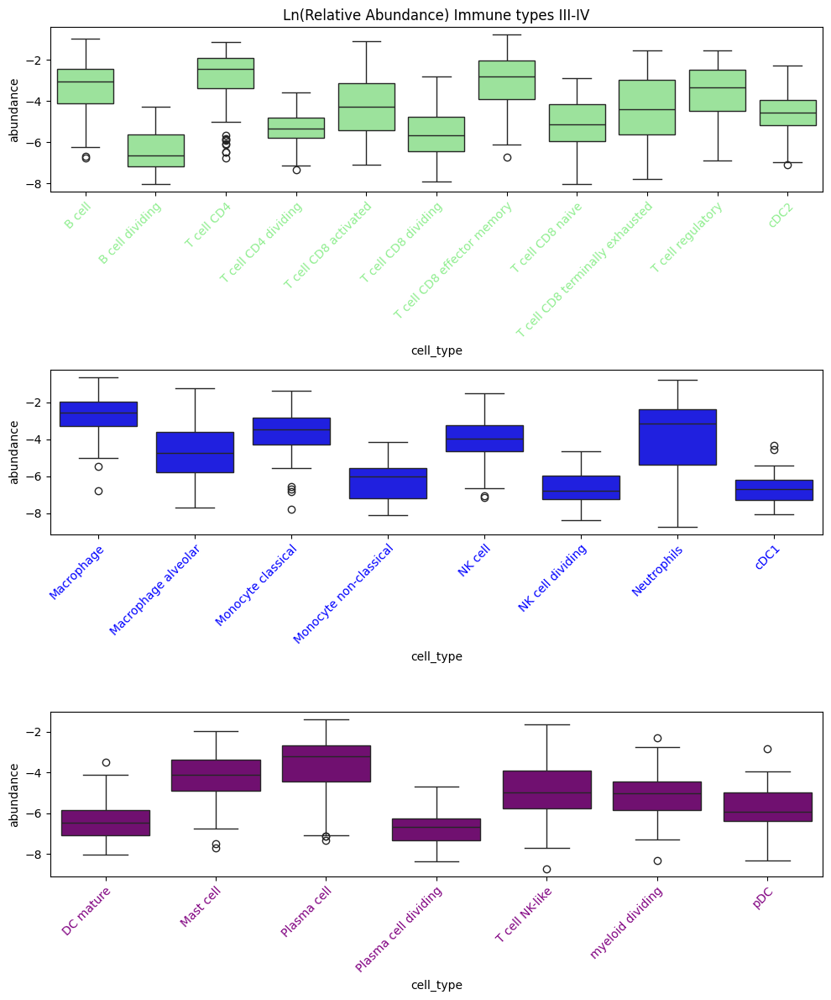

In [21]:
cats_of_interest = ['immune adaptive',
                     'immune innate', 'immune both'
                     ]

# unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Immune types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax)
    # ax.tick_params(axis='x', labelcolor='black')
    # ax.set_xticklabels([])
    ax.get_legend().remove()
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

#### Stromal

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero e

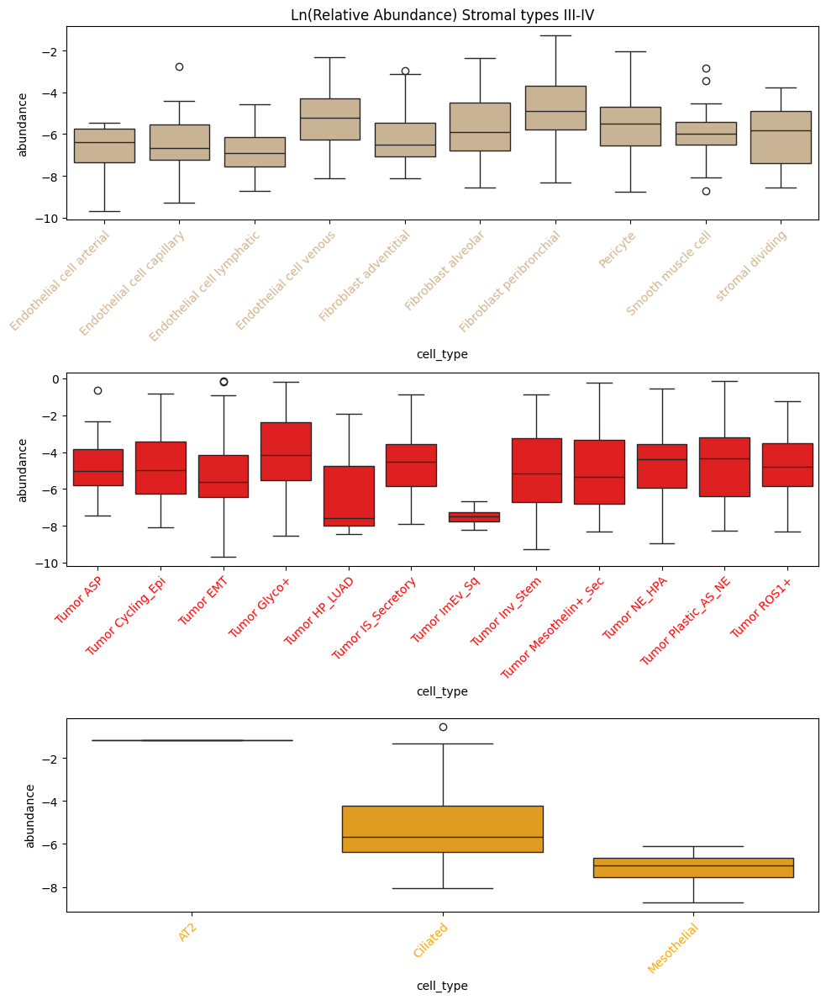

In [22]:
cats_of_interest = ['stromal', 'tumoral', 'epithelial']

# unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Stromal types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax)
    ax.get_legend().remove()
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


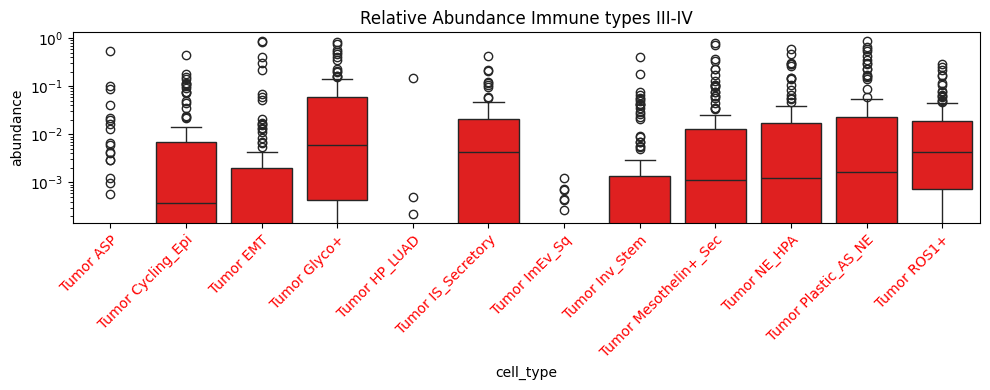

In [23]:
cats_of_interest = [ 'tumoral']

# unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Immune types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax, log_scale=False)
    ax.get_legend().remove()
    ax.set_yscale('log')
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


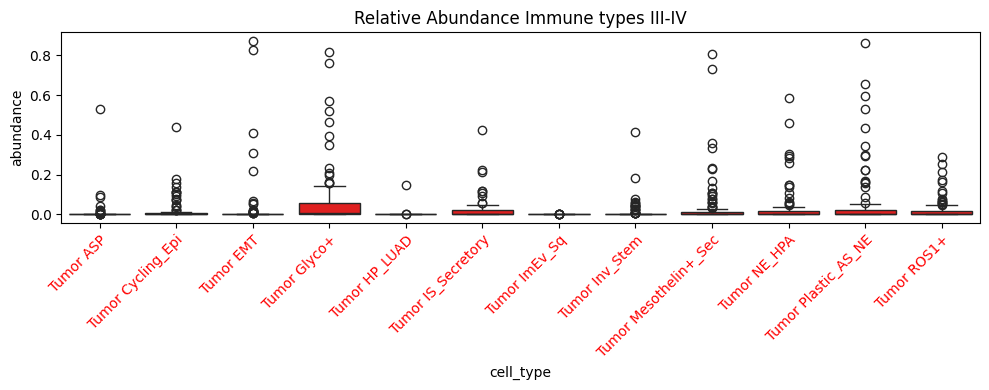

In [24]:
cats_of_interest = [ 'tumoral']

# unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Immune types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax, log_scale=False)
    ax.get_legend().remove()
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

### Calculate clusters

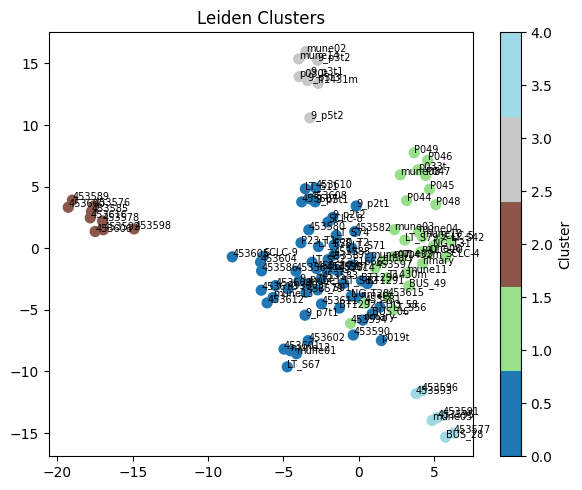

,dataset,membership
sample,,
BD_immune01,Hu,0
Wu_Zhou_2021_GSM4453599,Wu_Zhou_2021,0
Wu_Zhou_2021_GSM4453590,Wu_Zhou_2021,0
Wu_Zhou_2021_GSM4453588,Wu_Zhou_2021,0
Wu_Zhou_2021_GSM4453587,Wu_Zhou_2021,0
...,...,...
Wu_Zhou_2021_GSM4453596,Wu_Zhou_2021,4
Wu_Zhou_2021_GSM4453595,Wu_Zhou_2021,4
Wu_Zhou_2021_GSM4453593,Wu_Zhou_2021,4


In [ ]:
g = abundance.cluster_samples_leiden(corr_types.drop(columns=['dataset',
                                                              'membership'
                                                              ]), k=4, res=0.3)

# Create a mapping from sample name to membership
membership_map = {v["name"]: v["membership"] for v in g.vs}

# Add the membership column to corr_types_III
corr_types["membership"] = corr_types.index.map(membership_map)
unique_clusters = corr_types["membership"].unique()
corr_types.head()

Merge clusters 1 and 3 because they both have low tumor cells high immune. And curisly the opposite for 2 and 4

In [ ]:
corr_types.loc[corr_types['membership']==3, 'membership'] = 1
corr_types.loc[corr_types['membership']==4, 'membership'] = 2
corr_types['membership'].unique()

array([0, 1, 2])

In [58]:
df_short = corr_types[['dataset', 'membership']].sort_values('membership')
df_short.to_csv(f'{output_dir}/membership_by_cluster_{time_suffix}.csv')
df_short

,dataset,membership
sample,,
BD_immune01,Hu,0
Wu_Zhou_2021_GSM4453599,Wu_Zhou_2021,0
Wu_Zhou_2021_GSM4453590,Wu_Zhou_2021,0
Wu_Zhou_2021_GSM4453588,Wu_Zhou_2021,0
Wu_Zhou_2021_GSM4453587,Wu_Zhou_2021,0
...,...,...
Wu_Zhou_2021_GSM4453592,Wu_Zhou_2021,2
Wu_Zhou_2021_GSM4453598,Wu_Zhou_2021,2
Wu_Zhou_2021_GSM4453593,Wu_Zhou_2021,2


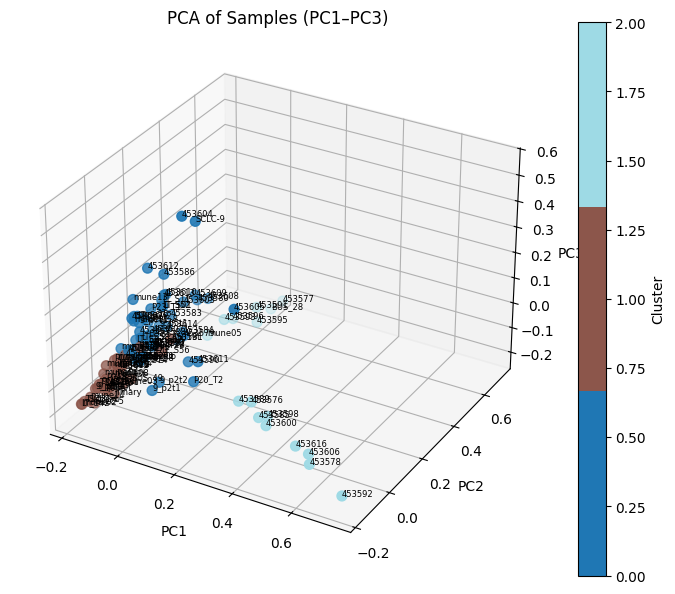

[plot_pca_from_corr_types] Top cell types per PC (by absolute loading):
     PC  rank                   cell_type   loading
0   PC1     1         Tumor Plastic_AS_NE  0.789866
1   PC1     2                Tumor NE_HPA  0.397698
2   PC1     3                  T cell CD4 -0.240650
3   PC1     4  T cell CD8 effector memory -0.232762
4   PC1     5                      B cell -0.203597
5   PC2     1                Tumor Glyco+  0.865876
6   PC2     2  T cell CD8 effector memory -0.202167
7   PC2     3                  T cell CD4 -0.182078
8   PC2     4                      B cell -0.179592
9   PC2     5         Tumor Plastic_AS_NE -0.174111
10  PC3     1                   Tumor EMT  0.596160
11  PC3     2                  Macrophage  0.440873
12  PC3     3                Tumor Glyco+ -0.284926
13  PC3     4                      B cell -0.243226
14  PC3     5                  T cell CD4 -0.233982


,PC,rank,cell_type,loading
0,PC1,1,Tumor Plastic_AS_NE,0.789866
1,PC1,2,Tumor NE_HPA,0.397698
2,PC1,3,T cell CD4,-0.240650
3,PC1,4,T cell CD8 effector memory,-0.232762
4,PC1,5,B cell,-0.203597
5,PC2,1,Tumor Glyco+,0.865876
6,PC2,2,T cell CD8 effector memory,-0.202167
7,PC2,3,T cell CD4,-0.182078
8,PC2,4,B cell,-0.179592
9,PC2,5,Tumor Plastic_AS_NE,-0.174111


In [19]:
abundance.plot_pca_from_corr_types( corr_types.drop(columns=['dataset']) )

### Abundance Heatmap

/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


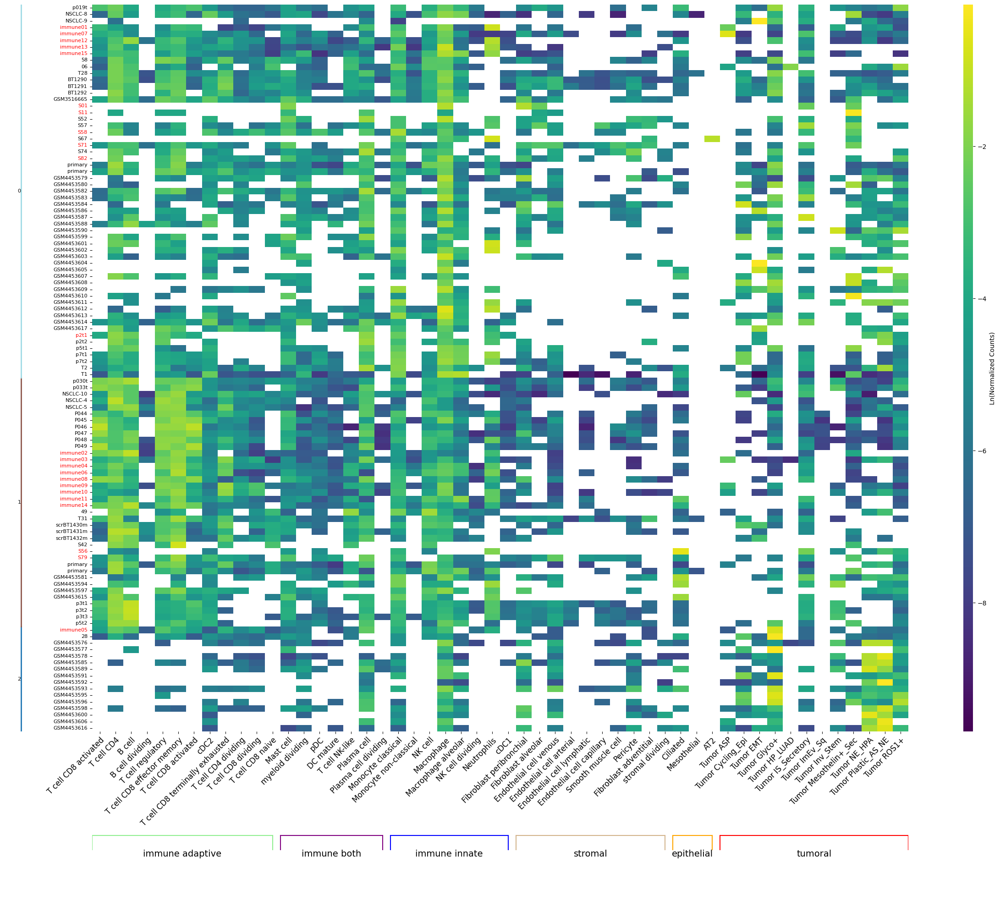

In [ ]:
a = abundance.plot_abundance_heatmap(corr_types, show_plot=False, group_by_membership=True)
# a = abundance.plot_abundance_heatmap(corr_types.drop(columns='membership'), show_plot=False, group_by_membership=True)

/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


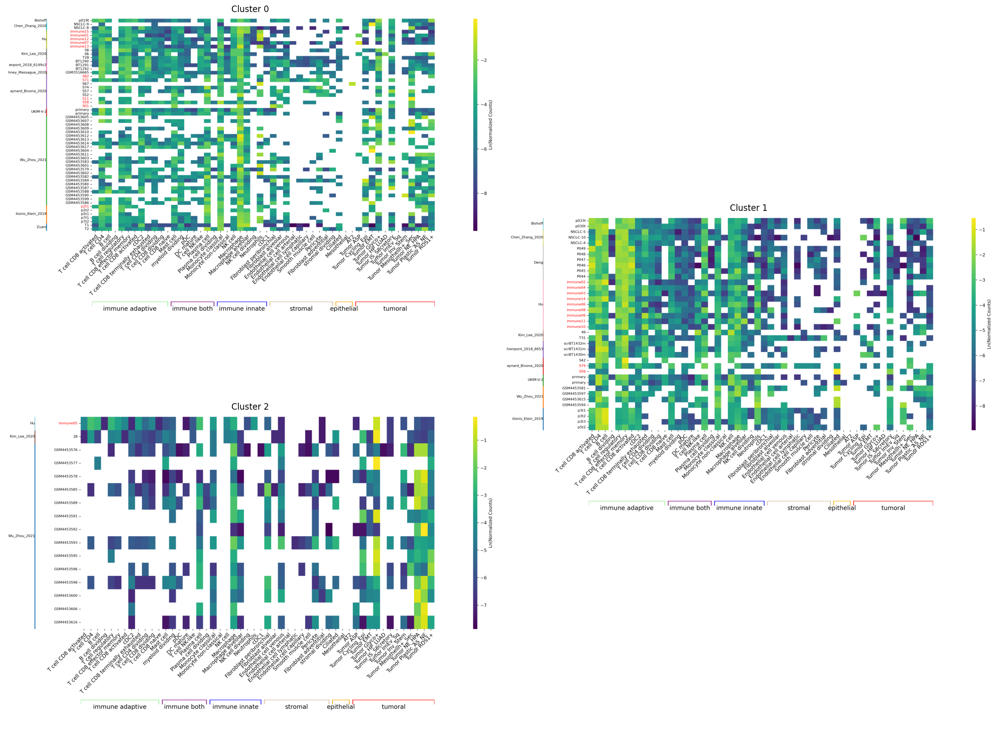

In [110]:
import io
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Initialize main figure and grid
unique_clusters = sorted(c for c in corr_types["membership"].unique() if pd.notna(c))
ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1

fig = plt.figure(figsize=(20, 8 * nrows))  # Main figure

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    if subset.empty:
        continue

    # Generate heatmap figure with lighter footprint
    temp_fig = abundance.plot_abundance_heatmap(
        subset,
        show_plot=False,
        figsize=(16, 10),
    )

    buf = io.BytesIO()
    temp_fig.savefig(buf, format="png", bbox_inches="tight", dpi=200)
    plt.close(temp_fig)  # Close temporary figure early to free memory

    buf.seek(0)
    with Image.open(buf) as img:
        img_array = np.array(img)
    buf.close()

    # Switch back to main figure explicitly
    plt.figure(fig.number)

    # Add subplot to main figure
    rs = 2 if (is_unpair and i == len(unique_clusters) - 2) else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)
    ax.imshow(img_array)
    ax.axis("off")  # Hide main figure's axes (use image's baked-in axes)
    ax.set_title(f"Cluster {cluster_id}")

plt.tight_layout()
plt.show()

### Cluster boxplots

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abu

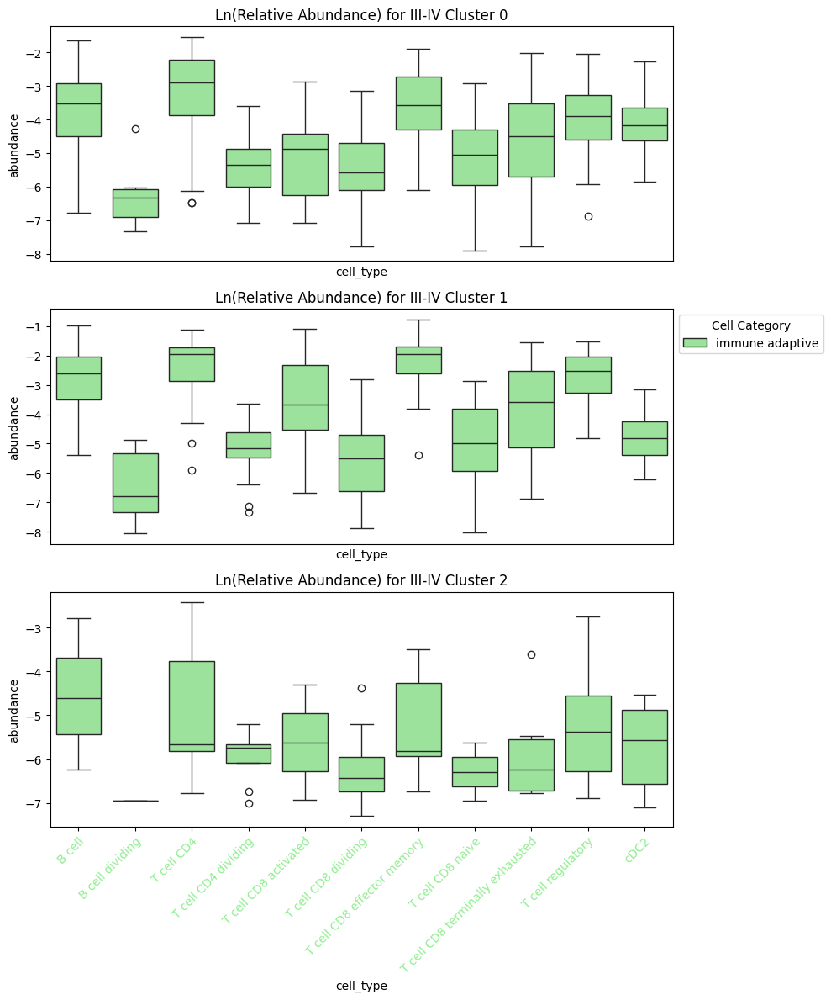

In [111]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
fig = plt.figure(figsize=(10, 4*nrows))


for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if category_map(col) == 'immune adaptive' ]
    subset = subset[cols]    
    
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset, title=f"for {time_solo} Cluster {cluster_id}",
                                     category_map=category_map, cat_colors=abundance.color_map, ax=ax,
                                     xlabel_color='black')
    
    if i != 1:
        ax.get_legend().remove()

    if i // ncols != nrows - 1:
        if is_unpair and i == len(unique_clusters) - 2:
            continue
        
        ax.set_xticks([])
        ax.set_xticklabels([])


plt.tight_layout()
plt.show()

/tmp/ipykernel_1071/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


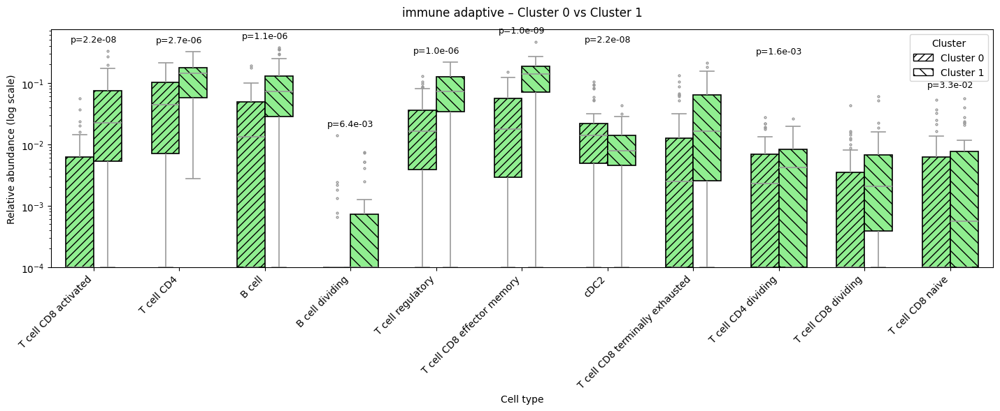

/tmp/ipykernel_1071/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


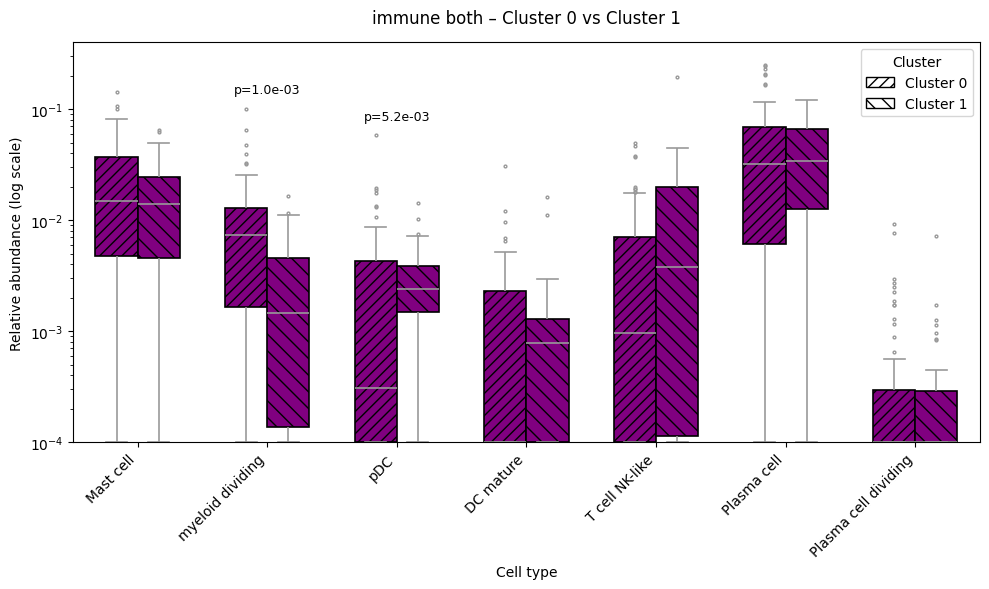

/tmp/ipykernel_1071/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


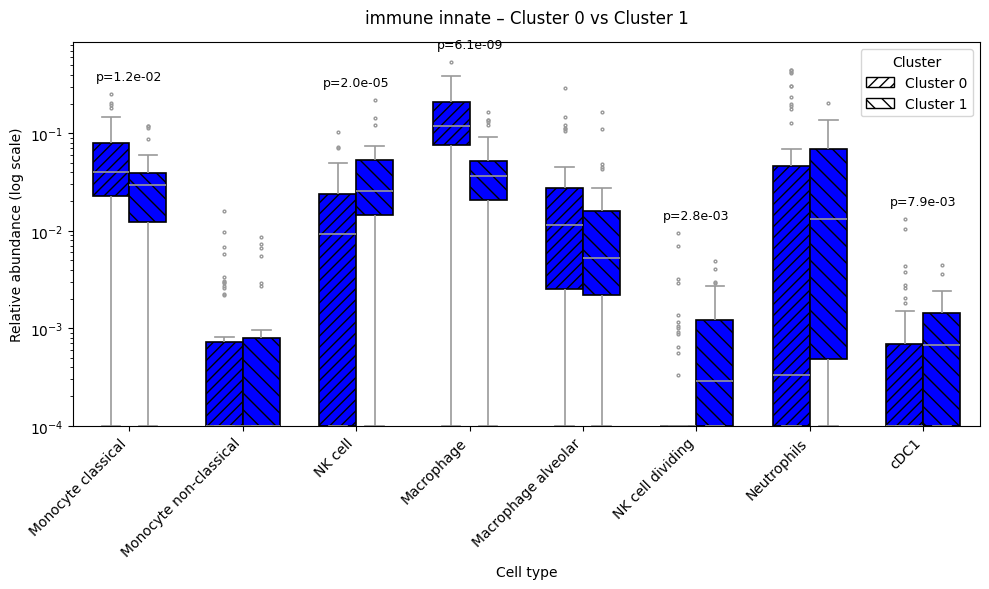

/tmp/ipykernel_1071/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


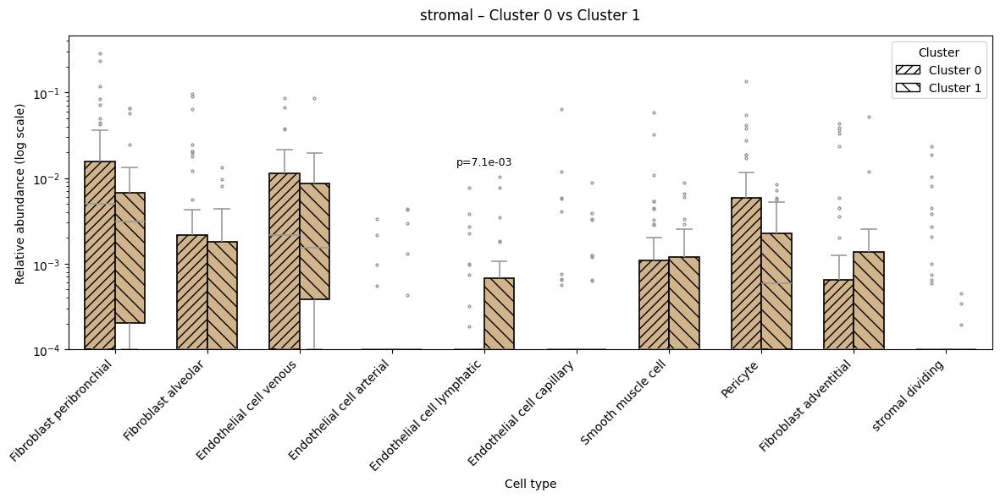

/tmp/ipykernel_1071/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


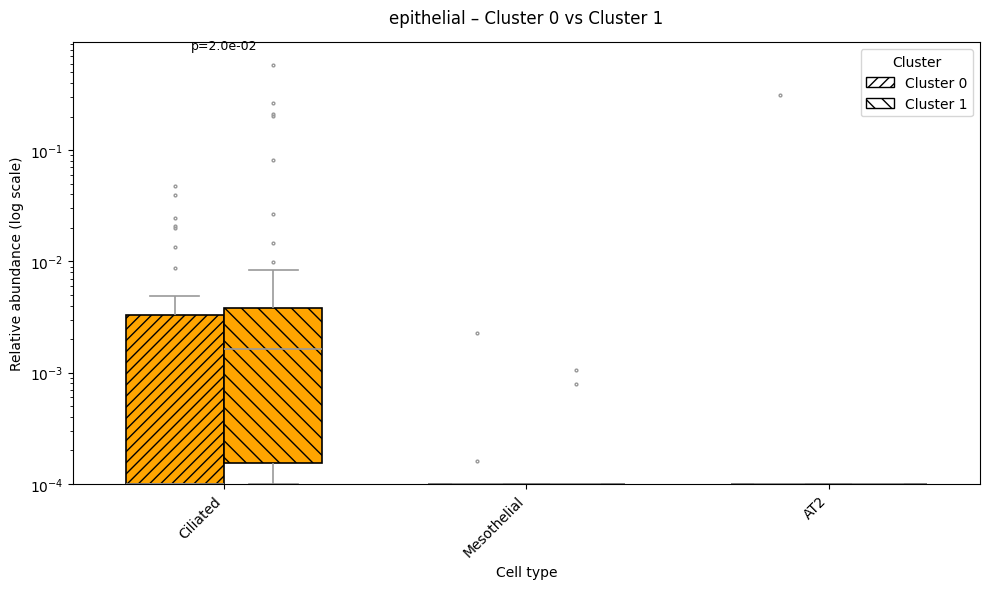

/tmp/ipykernel_1071/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


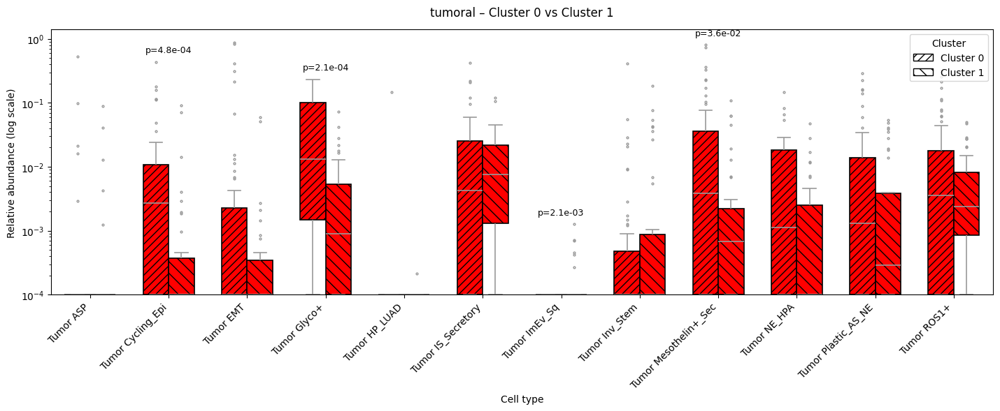

In [16]:
import seaborn as sns
from scipy.stats import mannwhitneyu
from matplotlib.patches import Patch, PathPatch

target_clusters = [0, 1]
cluster_hatches = {cluster: pattern for cluster, pattern in zip(target_clusters, ['///', '\\\\'])}

cluster_df = corr_types[corr_types['membership'].isin(target_clusters)].copy()
value_cols = [c for c in cluster_df.columns if c not in ('dataset', 'membership')]
long_df = (
    cluster_df.reset_index()
    .melt(id_vars=['sample', 'membership'], value_vars=value_cols,
          var_name='cell_type', value_name='abundance')
)
long_df['cell_category'] = long_df['cell_type'].map(abundance.cell_category_mapping)
long_df = long_df.dropna(subset=['cell_category'])
long_df['membership'] = long_df['membership'].astype(int)
long_df['abundance_plot'] = long_df['abundance'].clip(lower=1e-4)

category_colors = long_df[['cell_type', 'cell_category']].drop_duplicates()
category_colors['color'] = category_colors['cell_category'].apply(
    lambda cat: abundance.color_map.get(cat, '#bbbbbb')
)
cell_type_colors = dict(zip(category_colors['cell_type'], category_colors['color']))

for category, cell_types in abundance.cell_categories.items():
    # Get all cells in data belonging to this category
    cells_in_category = long_df[long_df['cell_category'] == category]['cell_type'].unique()
    
    # Start with cells that are in the predefined list (to preserve order)
    present_cells = [ct for ct in cell_types if ct in cells_in_category]
    
    # Append any other cells found in data for this category (e.g. new Tumor types)
    present_cells.extend([ct for ct in cells_in_category if ct not in present_cells])

    if not present_cells:
        continue
    # ...

    cat_df = long_df[long_df['cell_category'] == category].copy()
    fig_width = max(10, 1.2 * len(present_cells))
    fig, ax = plt.subplots(figsize=(fig_width, 6))

    sns.boxplot(
        data=cat_df,
        x='cell_type',
        y='abundance_plot',
        hue='membership',
        order=present_cells,
        hue_order=target_clusters,
        palette=['white'] * len(target_clusters),
        width=0.65,
        linewidth=1.2,
        fliersize=2,
        ax=ax,
    )

    num_clusters = len(target_clusters)
    num_cells = len(present_cells)
    boxes = [patch for patch in ax.patches if isinstance(patch, PathPatch)]
    for i, patch in enumerate(boxes):
        cluster_idx = i // num_cells
        cell_idx = i % num_cells
        if cluster_idx >= num_clusters:
            break
        cell_type = present_cells[cell_idx]
        cluster = target_clusters[cluster_idx]
        patch.set_facecolor(cell_type_colors.get(cell_type, '#bbbbbb'))
        patch.set_edgecolor('black')
        patch.set_alpha(1.0)
        patch.set_hatch(cluster_hatches[cluster])
    legend_handles = [
        Patch(facecolor='white', edgecolor='black', hatch=cluster_hatches[cluster],
              label=f'Cluster {cluster}')
        for cluster in target_clusters
    ]
    ax.legend(handles=legend_handles, title='Cluster', loc='upper right')

    ax.set_title(f'{category} – Cluster 0 vs Cluster 1', pad=14)
    ax.set_xlabel('Cell type')
    ax.set_ylabel('Relative abundance (log scale)')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

    y_min = cat_df['abundance_plot'].min()
    y_max = cat_df['abundance_plot'].max()
    ax.set_yscale('log')
    ax.set_ylim(max(1e-4, y_min * 0.8), y_max * 1.6)

    for idx, cell_type in enumerate(present_cells):
        group_vals = [
            cat_df[(cat_df['cell_type'] == cell_type) & (cat_df['membership'] == cluster)]['abundance'].dropna()
            for cluster in target_clusters
        ]
        if not all(len(vals) for vals in group_vals):
            continue

        _, p_value = mannwhitneyu(group_vals[0], group_vals[1], alternative='two-sided')
        if p_value >= 0.05:
            continue

        cell_max = cat_df[cat_df['cell_type'] == cell_type]['abundance_plot'].max()
        ax.text(idx, cell_max * 1.3, f'p={p_value:.1e}', ha='center', va='bottom', fontsize=9, color='black')

    plt.tight_layout()
    plt.show()


/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abu

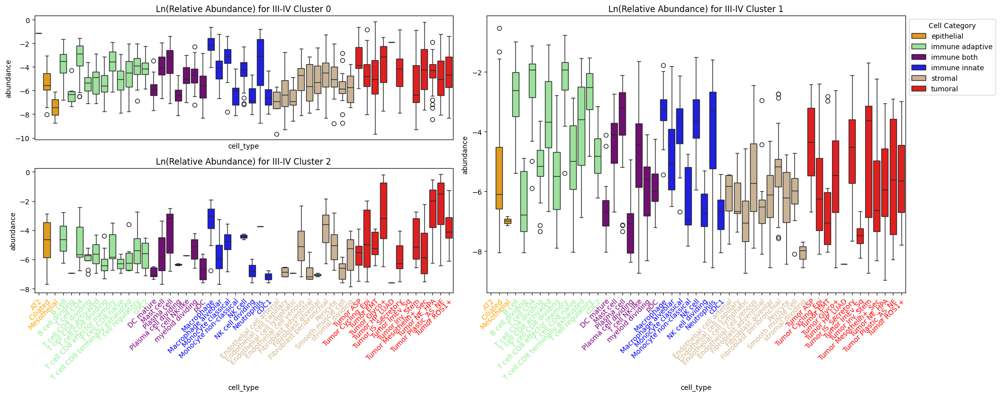

In [112]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
nrows2 = nrows -1 if is_unpair else nrows
fig = plt.figure(figsize=(20, 4*nrows))


for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")    
    
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset.drop(columns=['dataset']),title=f"for {time_solo} Cluster {cluster_id}",
                                     category_map=category_map, cat_colors=abundance.color_map, ax=ax)
    
    if i // ncols != nrows - 1:
        if is_unpair and i == len(unique_clusters) - 2:
            continue
        
        ax.set_xticks([])
        ax.set_xticklabels([])        
        
    if i != 1:
        ax.get_legend().remove()


plt.tight_layout()
plt.show()

### Coabundance GRAPHS

In [23]:
Gs = {}

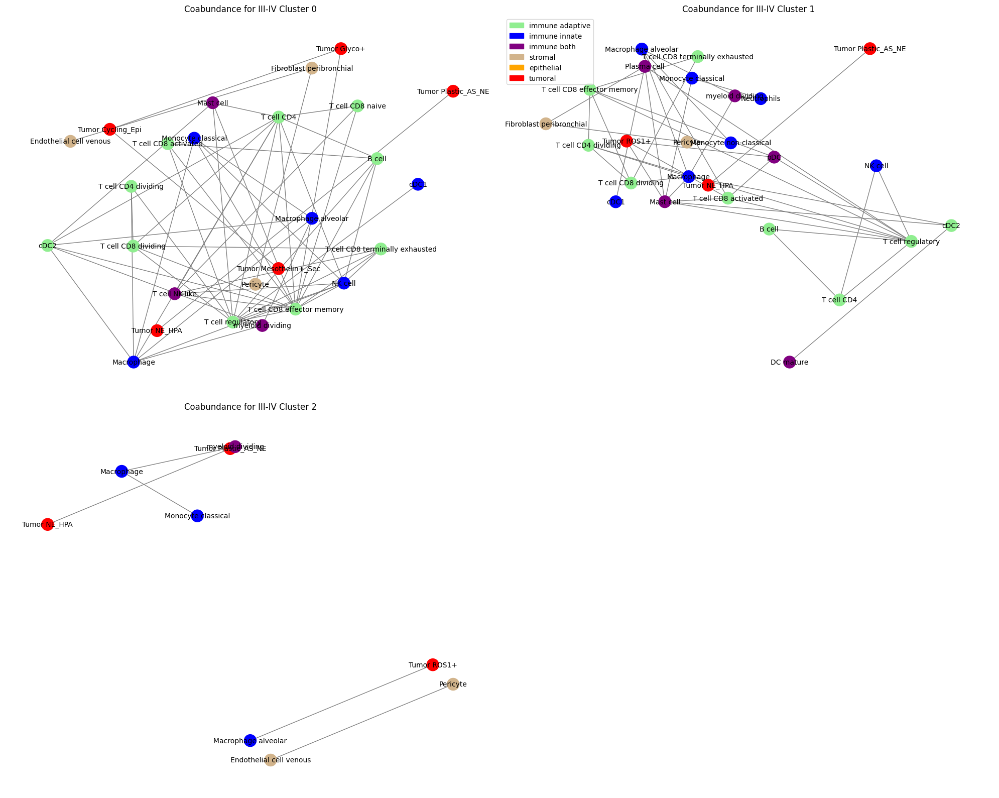

In [12]:
unique_clusters = corr_types["membership"].unique()
ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
fig = plt.figure(figsize=(20, 8*nrows))

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id]#.drop(columns="membership")

    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    
    abundance.draw_graph(G, ax, f'Coabundance for {time_solo} Cluster {cluster_id}', scale2=7, font_size=10)
    ax.axis('off')
    if i != 1:
        ax.get_legend().remove()

plt.tight_layout()
plt.show()


### dEGREE CENTRAL

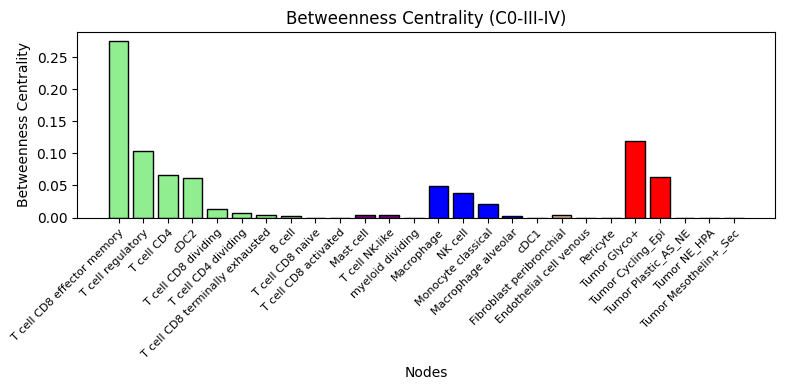

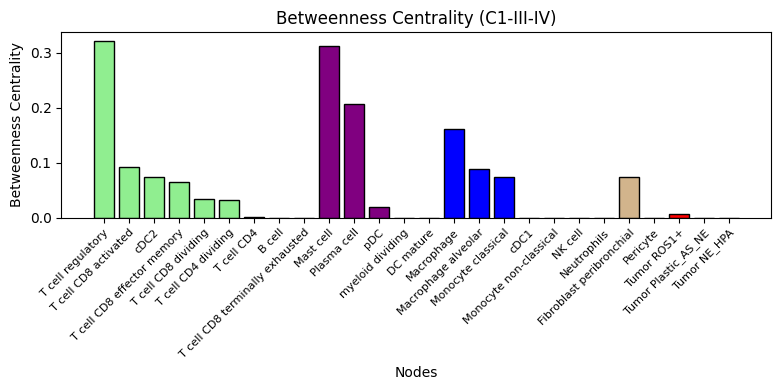

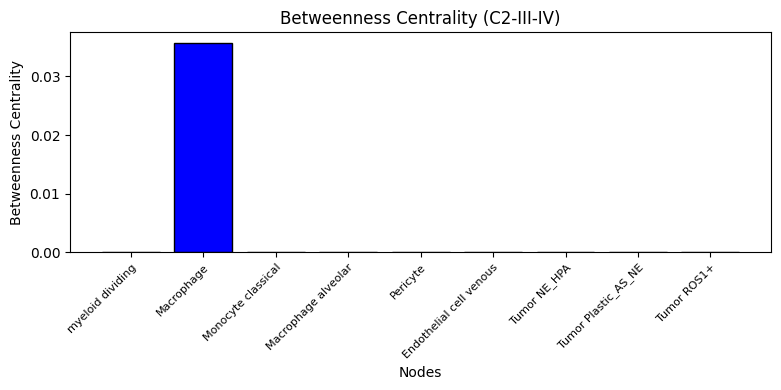

In [14]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    
    fig, ax = plt.subplots(figsize=(8, 4))

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    Gs[cluster_id] = abundance.plot_degree_centrality(G, time=f'C{cluster_id}-{time_solo}', ax=ax,
                                      betweenness=True
                                      )

    plt.tight_layout()
    plt.show()

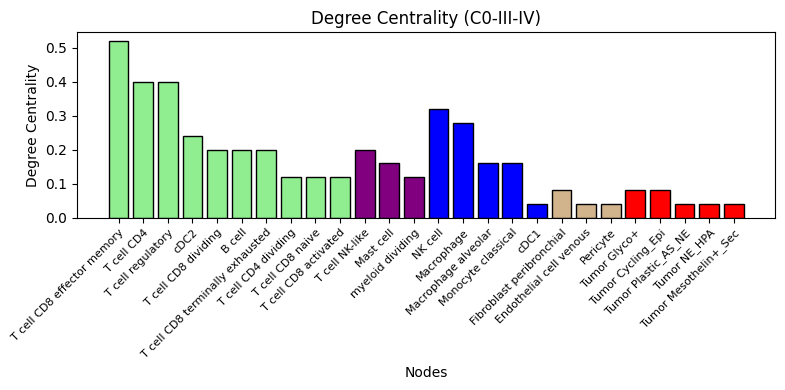

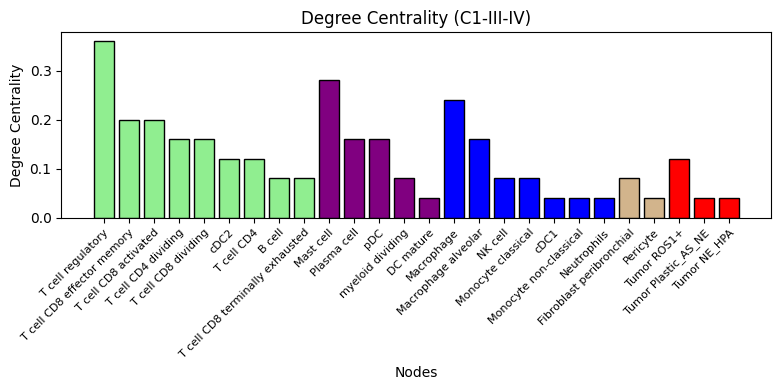

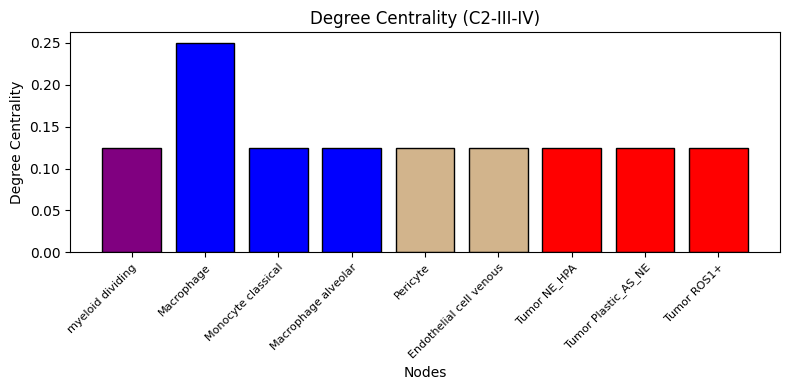

In [15]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    
    fig, ax = plt.subplots(figsize=(8, 4))

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    Gs[cluster_id] = abundance.plot_degree_centrality(G, time=f'C{cluster_id}-{time_solo}', ax=ax,
                                      betweenness=False
                                      )

    plt.tight_layout()
    plt.show()

### Export graphs

In [ ]:
import pickle

for cluster_id, G in Gs.items():
    filename = f"{output_dir}/G_{time_solo}_{cluster_id}.pkl"
    with open(filename, "wb") as f:
        pickle.dump(G, f)
print("Saved all graphs in Gs.")

Saved all graphs in Gs.


### Sankey Plot

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

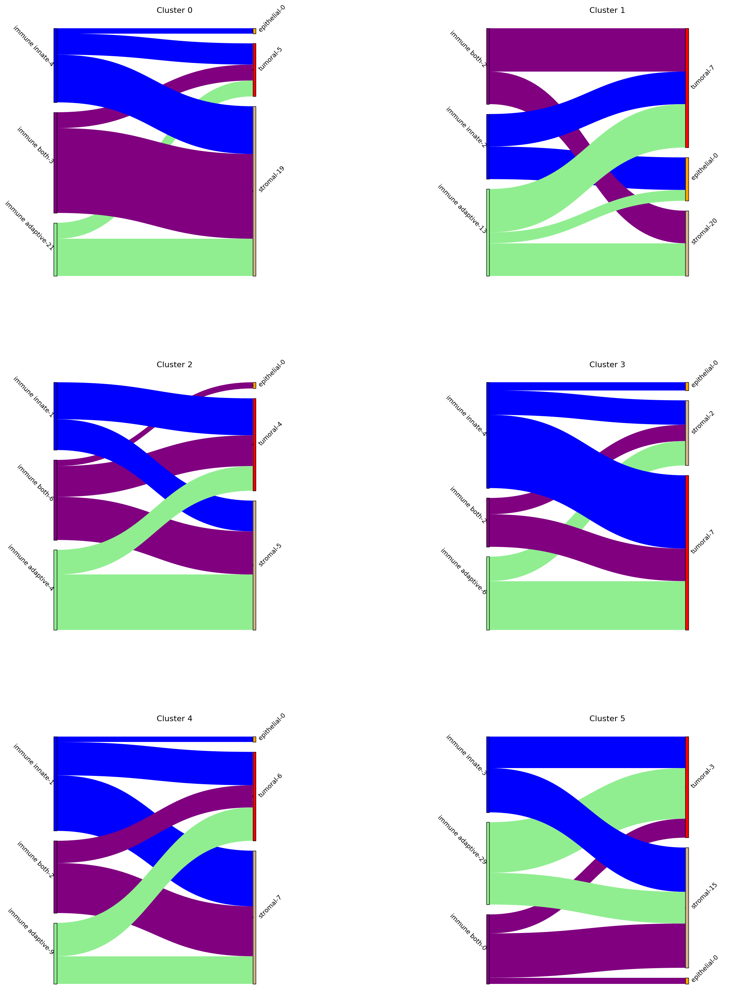

In [32]:
import io
import holoviews as hv
import matplotlib.pyplot as plt
from IPython.display import display, Image

# Ensure matplotlib backend to preserve custom rotated labels hook in abundance.sankey
hv.extension('matplotlib')

use_gradients = False  # toggle Sankey ribbon gradients

# Build deterministically so order is stable
sankeys = {
    cid: abundance.sankey(
        Gs[cid],
        category_map,
        abundance.color_map,
        title=f'Cluster {cid}',
        gradients=use_gradients
    )
    for cid in sorted(Gs)
}

# Create layout (grid) of Sankey plots
layout = hv.NdLayout(sankeys, kdims=['Cluster']).cols(2)

# Backend-specific sizing
layout = layout.opts(
    hv.opts.Sankey(fig_inches=0.8, aspect=0.95, fontsize={'title': 16}, show_frame=False),
    hv.opts.Layout(tight=True, hspace=0.0, vspace=0.0)
 )

fig = hv.render(layout, backend='matplotlib')

buf = io.BytesIO()
fig.savefig(buf, format='png', bbox_inches='tight', dpi=100)
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

In [33]:
hv.save(layout, f'{output_dir}/sankey_{time_solo}.png')  # Save the layout as a PNG file

## III-IV Leiden no Wu

Get the relative abundance of cell type per sample

In [44]:
time = 'III-IV_leidenwu_funcnames'
time_solo = time.split('_')[0]
time_suffix = 'early' if time_solo == 'I-II' else 'late2'

# Unstack the group counts
groups = pd.read_csv(f'{meta_folder}/groups_{time}.csv', index_col=0)
groups.sort_values([cell_type_key, sample_key])
groups.set_index([cell_type_key,sample_key], inplace=True)
cutoff = groups.loc[:, '0']
# We dont remove the cutoff because it messes with the dims
cutoff = pd.DataFrame(cutoff[cutoff > 1])
samp_type = cutoff.unstack().transpose()

# Normalize the counts
samp_type = samp_type.fillna(0)
corr_types = (samp_type.T / samp_type.T.sum()).T

groups.reset_index(inplace=True)
group_dataset = groups.groupby(['sample','dataset']).sum()
group_dataset.reset_index(inplace=True)
corr_types = pd.merge(corr_types, group_dataset.loc[:,[sample_key,'dataset']], how='left', left_on=sample_key, right_on=sample_key)
corr_types.set_index(sample_key, inplace=True)


print(f'Size of Corr_types: {corr_types.shape}')

Size of Corr_types: (111, 52)


Remove the Wu Zhou samples because they lack stromal cells.

In [45]:
corr_types = corr_types[~corr_types.index.str.contains("Zhou", case=False, na=False)]
corr_types

,AT2,B cell,B cell dividing,Ciliated,DC mature,Endothelial cell arterial,Endothelial cell capillary,Endothelial cell lymphatic,Endothelial cell venous,Fibroblast adventitial,...,Tumor Mesothelin+_Sec,Tumor NE_HPA,Tumor Plastic_AS_NE,Tumor ROS1+,cDC1,cDC2,myeloid dividing,pDC,stromal dividing,dataset
sample,,,,,,,,,,,,,,,,,,,,,
BD_immune01,0.0,0.007598,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.002533,0.000000,...,0.000000,0.009287,0.013930,0.000633,0.000000,0.000000,0.004854,0.000000,0.0,Hu
BD_immune02,0.0,0.352115,0.000374,0.002059,0.000000,0.0,0.0,0.000000,0.000374,0.000000,...,0.019094,0.000000,0.000000,0.000000,0.000000,0.004493,0.000936,0.000936,0.0,Hu
BD_immune03,0.0,0.086106,0.002485,0.000000,0.000756,0.0,0.0,0.000000,0.000432,0.000000,...,0.000324,0.016746,0.035436,0.001188,0.000540,0.006158,0.000864,0.003349,0.0,Hu
BD_immune04,0.0,0.050995,0.000000,0.001549,0.000715,0.0,0.0,0.000000,0.000596,0.000000,...,0.001191,0.000000,0.000000,0.000596,0.000000,0.008102,0.003694,0.002502,0.0,Hu
BD_immune05,0.0,0.062460,0.000966,0.000000,0.000644,0.0,0.0,0.000000,0.000966,0.000644,...,0.000000,0.003220,0.001932,0.002254,0.000000,0.000966,0.004185,0.000000,0.0,Hu
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zilionis_Klein_2019_p7t1,0.0,0.021429,0.000000,0.000000,0.001648,0.0,0.0,0.000000,0.008791,0.000000,...,0.001099,0.000000,0.001099,0.003297,0.000000,0.019780,0.001648,0.013187,0.0,Zilionis_Klein_2019
Zilionis_Klein_2019_p7t2,0.0,0.020810,0.000000,0.000000,0.003375,0.0,0.0,0.000000,0.009561,0.000000,...,0.002250,0.000000,0.001125,0.006749,0.001125,0.014623,0.001687,0.017435,0.0,Zilionis_Klein_2019
p019t,0.0,0.019305,0.000000,0.039897,0.000000,0.0,0.0,0.000000,0.009009,0.004505,...,0.004505,0.002574,0.003861,0.172458,0.000000,0.010296,0.003218,0.001931,0.0,Bishoff


Import CLUSTERS  if they exist if not error

In [46]:
if not 'membership' in corr_types.columns:
    df_short = pd.read_csv(f'{output_dir}/membership_by_cluster_{time_suffix}.csv', index_col=0)
    corr_types = pd.merge(corr_types, df_short['membership'], how='left', right_index=True, left_index=True)
else:
    print('Memberhsip column is already present, delete it if you want to reimport')

# This is important for all later visualizations
unique_clusters = corr_types["membership"].unique()

corr_types

,AT2,B cell,B cell dividing,Ciliated,DC mature,Endothelial cell arterial,Endothelial cell capillary,Endothelial cell lymphatic,Endothelial cell venous,Fibroblast adventitial,...,Tumor NE_HPA,Tumor Plastic_AS_NE,Tumor ROS1+,cDC1,cDC2,myeloid dividing,pDC,stromal dividing,dataset,membership
sample,,,,,,,,,,,,,,,,,,,,,
BD_immune01,0.0,0.007598,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.002533,0.000000,...,0.009287,0.013930,0.000633,0.000000,0.000000,0.004854,0.000000,0.0,Hu,0
BD_immune02,0.0,0.352115,0.000374,0.002059,0.000000,0.0,0.0,0.000000,0.000374,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.004493,0.000936,0.000936,0.0,Hu,2
BD_immune03,0.0,0.086106,0.002485,0.000000,0.000756,0.0,0.0,0.000000,0.000432,0.000000,...,0.016746,0.035436,0.001188,0.000540,0.006158,0.000864,0.003349,0.0,Hu,1
BD_immune04,0.0,0.050995,0.000000,0.001549,0.000715,0.0,0.0,0.000000,0.000596,0.000000,...,0.000000,0.000000,0.000596,0.000000,0.008102,0.003694,0.002502,0.0,Hu,1
BD_immune05,0.0,0.062460,0.000966,0.000000,0.000644,0.0,0.0,0.000000,0.000966,0.000644,...,0.003220,0.001932,0.002254,0.000000,0.000966,0.004185,0.000000,0.0,Hu,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zilionis_Klein_2019_p7t1,0.0,0.021429,0.000000,0.000000,0.001648,0.0,0.0,0.000000,0.008791,0.000000,...,0.000000,0.001099,0.003297,0.000000,0.019780,0.001648,0.013187,0.0,Zilionis_Klein_2019,0
Zilionis_Klein_2019_p7t2,0.0,0.020810,0.000000,0.000000,0.003375,0.0,0.0,0.000000,0.009561,0.000000,...,0.000000,0.001125,0.006749,0.001125,0.014623,0.001687,0.017435,0.0,Zilionis_Klein_2019,0
p019t,0.0,0.019305,0.000000,0.039897,0.000000,0.0,0.0,0.000000,0.009009,0.004505,...,0.002574,0.003861,0.172458,0.000000,0.010296,0.003218,0.001931,0.0,Bishoff,0


IMPORT GRAPHS IF EXIST

In [52]:
# For pearson
# for fname in os.listdir(output_dir):
#     if fname.startswith(f"G_{time_solo}_") and fname.endswith(".pkl"):
#         cluster_id = fname[len(f"G_{time_solo}_"):-4]
#         with open(os.path.join(output_dir, fname), "rb") as f:
#             Gs_E[int(cluster_id)] = pickle.load(f)

# Gs = Gs_E

stage_label = time_suffix  # 'early' or 'late' based on the current timepoint
cluster_ids = [int(cid) for cid in unique_clusters if pd.notna(cid)]
Gs = load_aracne_graphs(cluster_ids, time, 'late')
Gs

[load_aracne_graphs] Missing network file for cluster 2 (late)


{0: <networkx.classes.graph.Graph at 0x7f2690b2f010>,
 1: <networkx.classes.graph.Graph at 0x7f26910296d0>}

### Box plot general

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


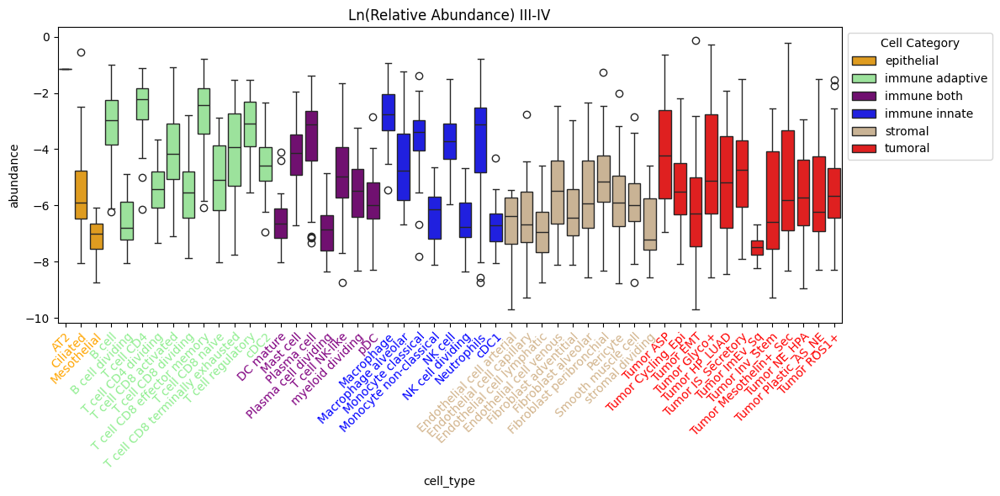

In [27]:
abundance.plot_celltype_boxplot(corr_types.drop(columns=['dataset',
                                                        #  'membership'
                                                         ]), time_solo,
    abundance.cell_category_mapping, abundance.color_map)
plt.show()

#### Immune

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero e

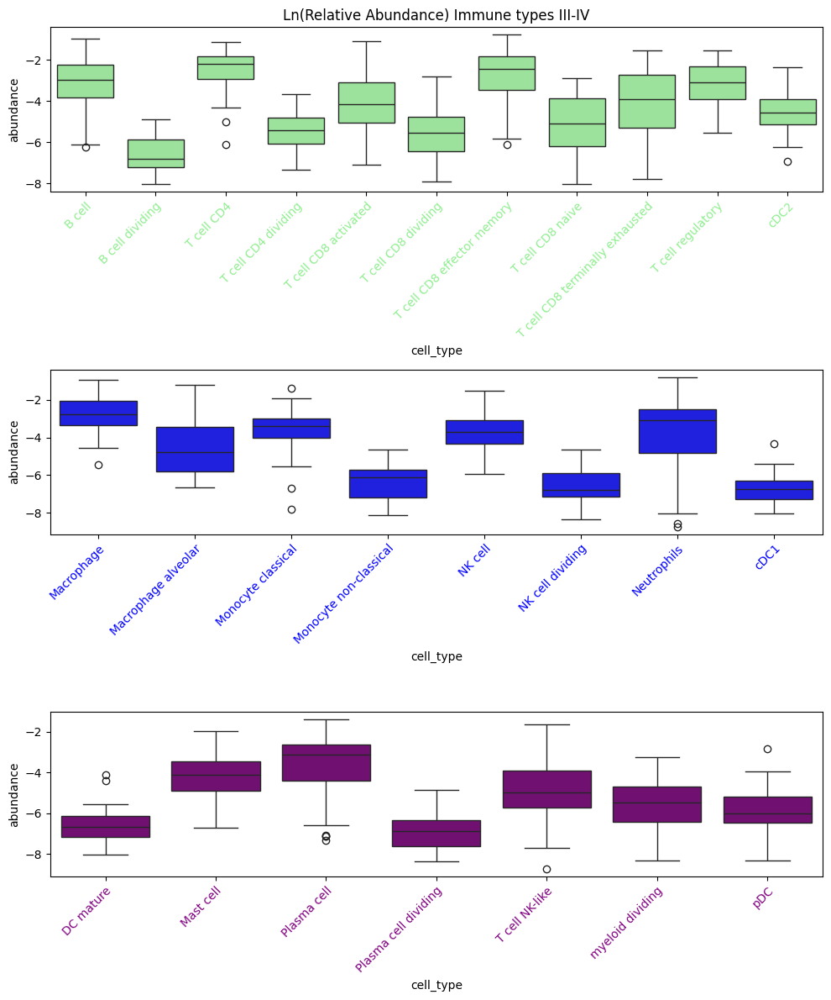

In [28]:
cats_of_interest = ['immune adaptive',
                     'immune innate', 'immune both'
                     ]

# unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Immune types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax)
    # ax.tick_params(axis='x', labelcolor='black')
    # ax.set_xticklabels([])
    ax.get_legend().remove()
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

#### Stromal

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero e

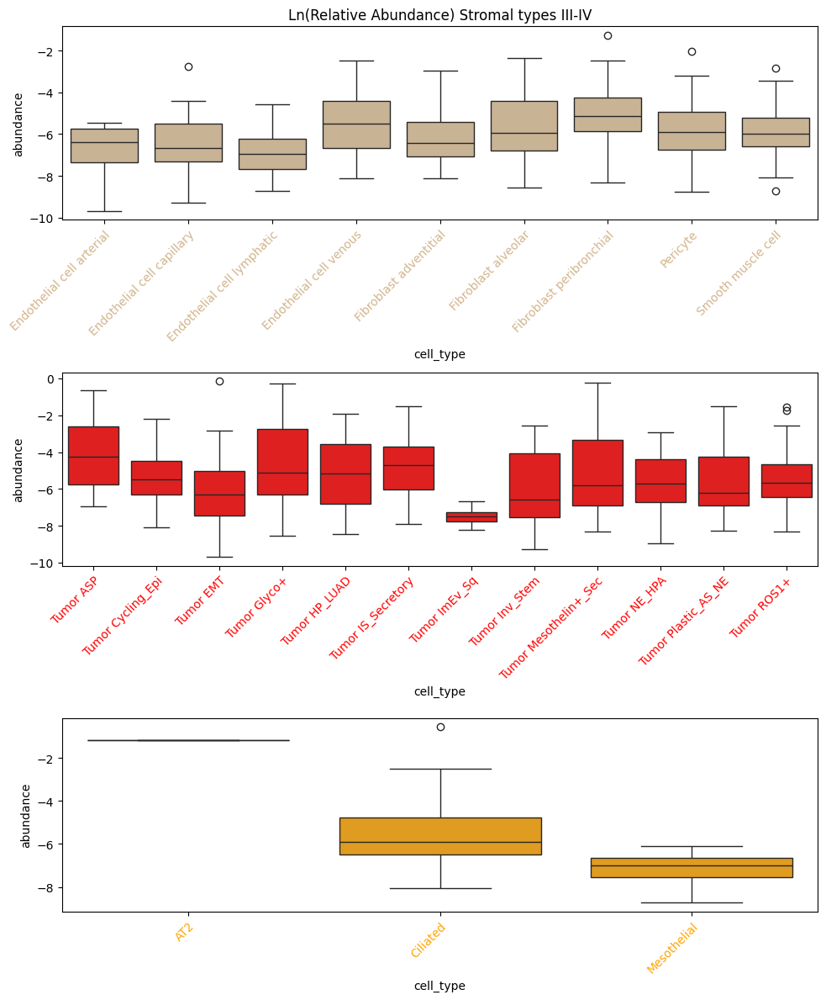

In [29]:
cats_of_interest = ['stromal', 'tumoral', 'epithelial']

# unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(cats_of_interest) + ncols - 1) // ncols
is_unpair = len(cats_of_interest) % ncols == 1

fig = plt.figure(figsize=(10, 4*nrows))

for i, cat in enumerate(cats_of_interest):
    # subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if abundance.cell_category_mapping(col) == cat]
    subset = corr_types[cols]
    
    # rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset,title=f"Stromal types {time_solo}",
                                     category_map=abundance.cell_category_mapping, cat_colors=abundance.color_map, ax=ax)
    ax.get_legend().remove()
    if i != 0:
        ax.title.set_visible(False)


plt.tight_layout()
plt.show()

### Calculate clusters

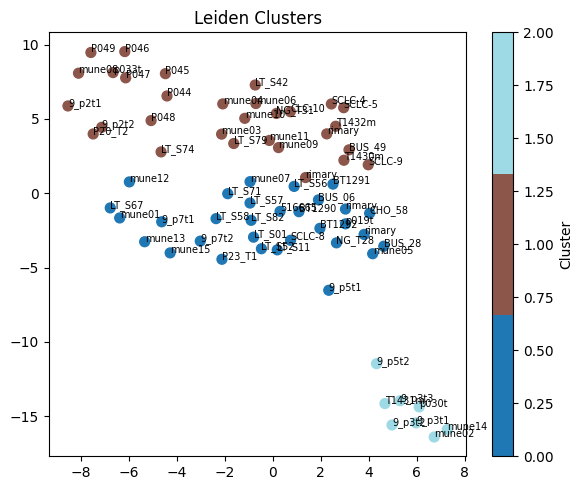

,AT2,B cell,B cell dividing,Ciliated,DC mature,Endothelial cell arterial,Endothelial cell capillary,Endothelial cell lymphatic,Endothelial cell venous,Fibroblast adventitial,...,Tumor NE_HPA,Tumor Plastic_AS_NE,Tumor ROS1+,cDC1,cDC2,myeloid dividing,pDC,stromal dividing,dataset,membership
sample,,,,,,,,,,,,,,,,,,,,,
BD_immune01,0.0,0.007598,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.002533,0.000000,...,0.009287,0.013930,0.000633,0.00000,0.000000,0.004854,0.000000,0.0,Hu,0
BD_immune02,0.0,0.352115,0.000374,0.002059,0.000000,0.0,0.0,0.0,0.000374,0.000000,...,0.000000,0.000000,0.000000,0.00000,0.004493,0.000936,0.000936,0.0,Hu,2
BD_immune03,0.0,0.086106,0.002485,0.000000,0.000756,0.0,0.0,0.0,0.000432,0.000000,...,0.016746,0.035436,0.001188,0.00054,0.006158,0.000864,0.003349,0.0,Hu,1
BD_immune04,0.0,0.050995,0.000000,0.001549,0.000715,0.0,0.0,0.0,0.000596,0.000000,...,0.000000,0.000000,0.000596,0.00000,0.008102,0.003694,0.002502,0.0,Hu,1
BD_immune05,0.0,0.062460,0.000966,0.000000,0.000644,0.0,0.0,0.0,0.000966,0.000644,...,0.003220,0.001932,0.002254,0.00000,0.000966,0.004185,0.000000,0.0,Hu,0


In [32]:
g = abundance.cluster_samples_leiden(corr_types.drop(columns=['dataset',
                                                            #   'membership'
                                                              ]), k=3, res=0.3)

# Create a mapping from sample name to membership
membership_map = {v["name"]: v["membership"] for v in g.vs}

# Add the membership column to corr_types_III
corr_types["membership"] = corr_types.index.map(membership_map)
unique_clusters = corr_types["membership"].unique()
corr_types.head()

Merge clusters 1 and 3 because they both have low tumor cells high immune. And curisly the opposite for 2 and 4

In [ ]:
corr_types.loc[corr_types['membership']==3, 'membership'] = 1
corr_types.loc[corr_types['membership']==4, 'membership'] = 2
corr_types['membership'].unique()

array([0, 1, 2])

In [33]:
df_short = corr_types[['dataset', 'membership']].sort_values('membership')
df_short.to_csv(f'{output_dir}/membership_by_cluster_{time_suffix}.csv')
df_short

,dataset,membership
sample,,
BD_immune01,Hu,0
Lambrechts_Thienpont_2018_6149v2_BT1290,Lambrechts_Thienpont_2018_6149v2,0
Lambrechts_Thienpont_2018_6149v2_BT1291,Lambrechts_Thienpont_2018_6149v2,0
Lambrechts_Thienpont_2018_6149v2_BT1292,Lambrechts_Thienpont_2018_6149v2,0
Laughney_Massague_2020_GSM3516665,Laughney_Massague_2020,0
...,...,...
Zilionis_Klein_2019_p3t2,Zilionis_Klein_2019,2
Zilionis_Klein_2019_p3t3,Zilionis_Klein_2019,2
Zilionis_Klein_2019_p5t2,Zilionis_Klein_2019,2


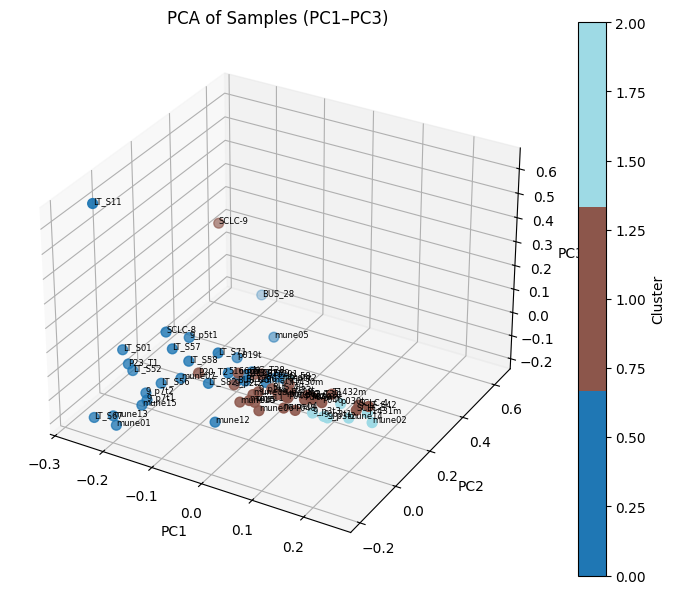

[plot_pca_from_corr_types] Top cell types per PC (by absolute loading):
     PC  rank                   cell_type   loading
0   PC1     1                      B cell  0.468750
1   PC1     2  T cell CD8 effector memory  0.412384
2   PC1     3                  T cell CD4  0.364589
3   PC1     4                  Macrophage -0.351721
4   PC1     5       Tumor Mesothelin+_Sec -0.265831
5   PC2     1                Tumor Glyco+  0.831486
6   PC2     2                 Neutrophils -0.340065
7   PC2     3                   Tumor EMT  0.314710
8   PC2     4                  Macrophage -0.205085
9   PC2     5       Tumor Mesothelin+_Sec -0.116817
10  PC3     1       Tumor Mesothelin+_Sec  0.744501
11  PC3     2                 Neutrophils -0.394056
12  PC3     3                   Tumor EMT  0.368412
13  PC3     4                Tumor Glyco+ -0.270139
14  PC3     5                  Macrophage -0.231956


,PC,rank,cell_type,loading
0,PC1,1,B cell,0.468750
1,PC1,2,T cell CD8 effector memory,0.412384
2,PC1,3,T cell CD4,0.364589
3,PC1,4,Macrophage,-0.351721
4,PC1,5,Tumor Mesothelin+_Sec,-0.265831
5,PC2,1,Tumor Glyco+,0.831486
6,PC2,2,Neutrophils,-0.340065
7,PC2,3,Tumor EMT,0.314710
8,PC2,4,Macrophage,-0.205085
9,PC2,5,Tumor Mesothelin+_Sec,-0.116817


In [34]:
abundance.plot_pca_from_corr_types( corr_types.drop(columns=['dataset']) )

### Abundance Heatmap

/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


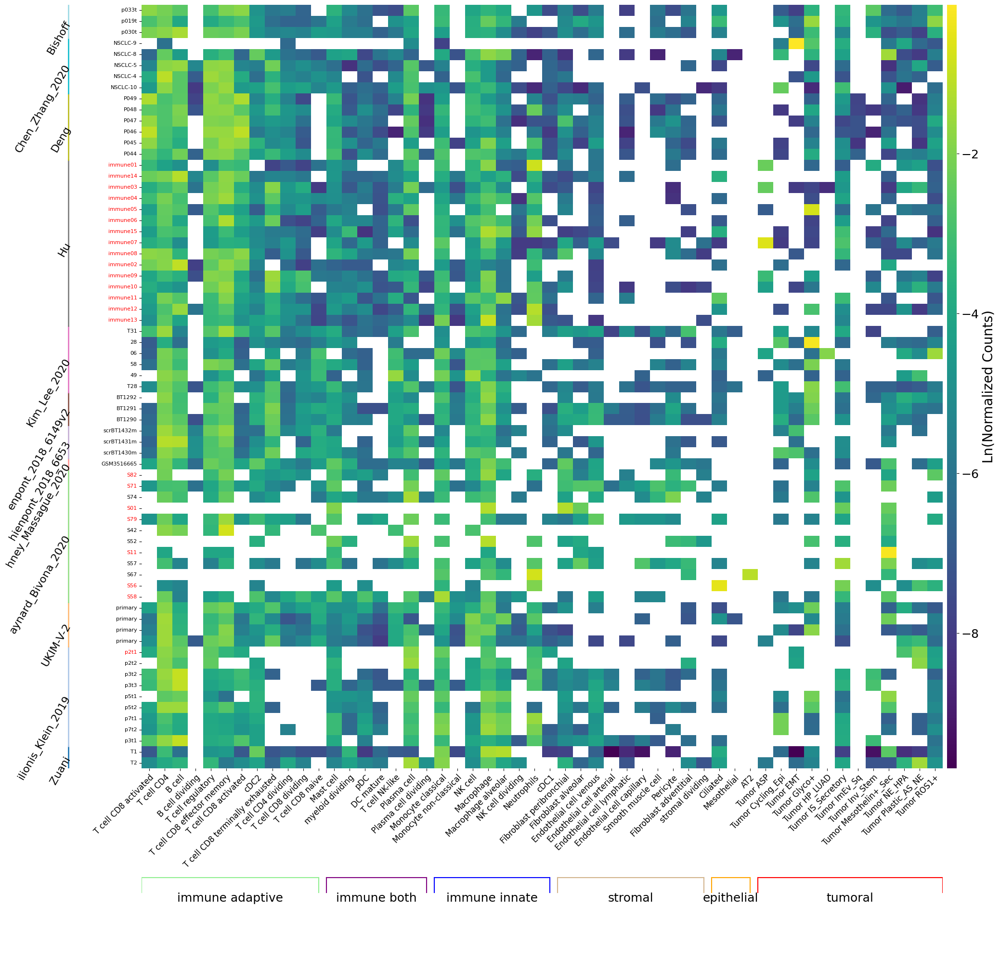

In [36]:
a = abundance.plot_abundance_heatmap(corr_types, show_plot=False, group_by_membership=False)
# a = abundance.plot_abundance_heatmap(corr_types.drop(columns='membership'), show_plot=False, group_by_membership=True)

/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/usr/local/lib/python3.11/site-packages/pandas/core/internals/blocks.py:395: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


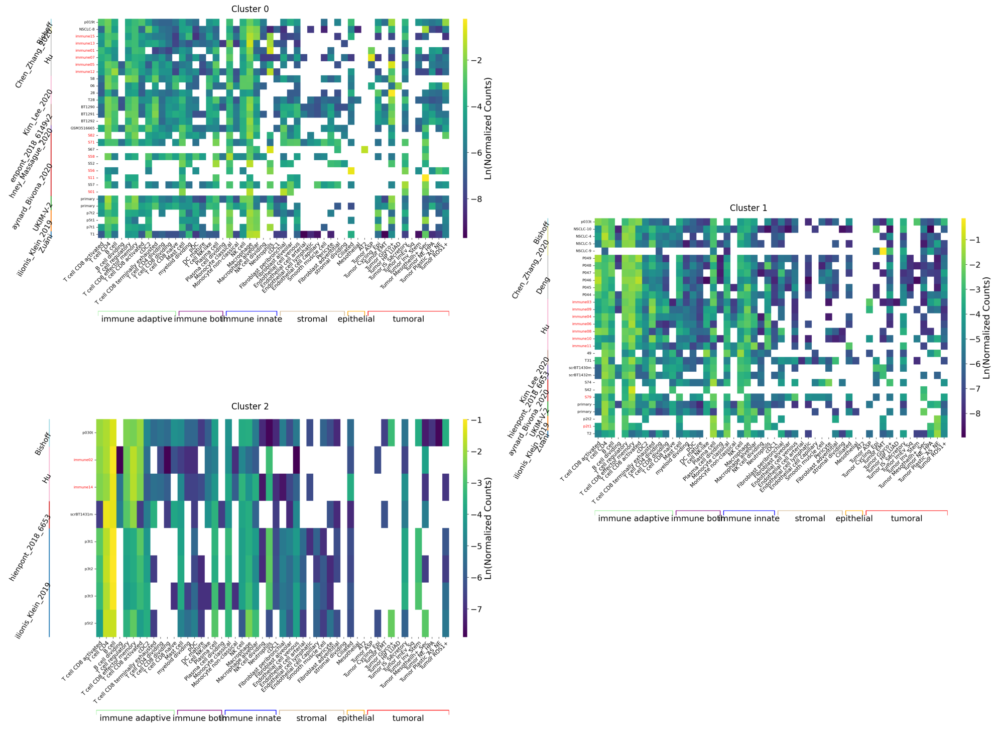

In [37]:
import io
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Initialize main figure and grid
unique_clusters = sorted(c for c in corr_types["membership"].unique() if pd.notna(c))
ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1

fig = plt.figure(figsize=(20, 8 * nrows))  # Main figure

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    if subset.empty:
        continue

    # Generate heatmap figure with lighter footprint
    temp_fig = abundance.plot_abundance_heatmap(
        subset,
        show_plot=False,
        figsize=(16, 10),
    )

    buf = io.BytesIO()
    temp_fig.savefig(buf, format="png", bbox_inches="tight", dpi=200)
    plt.close(temp_fig)  # Close temporary figure early to free memory

    buf.seek(0)
    with Image.open(buf) as img:
        img_array = np.array(img)
    buf.close()

    # Switch back to main figure explicitly
    plt.figure(fig.number)

    # Add subplot to main figure
    rs = 2 if (is_unpair and i == len(unique_clusters) - 2) else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)
    ax.imshow(img_array)
    ax.axis("off")  # Hide main figure's axes (use image's baked-in axes)
    ax.set_title(f"Cluster {cluster_id}")

plt.tight_layout()
plt.show()

### Cluster boxplots

/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:844: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero e

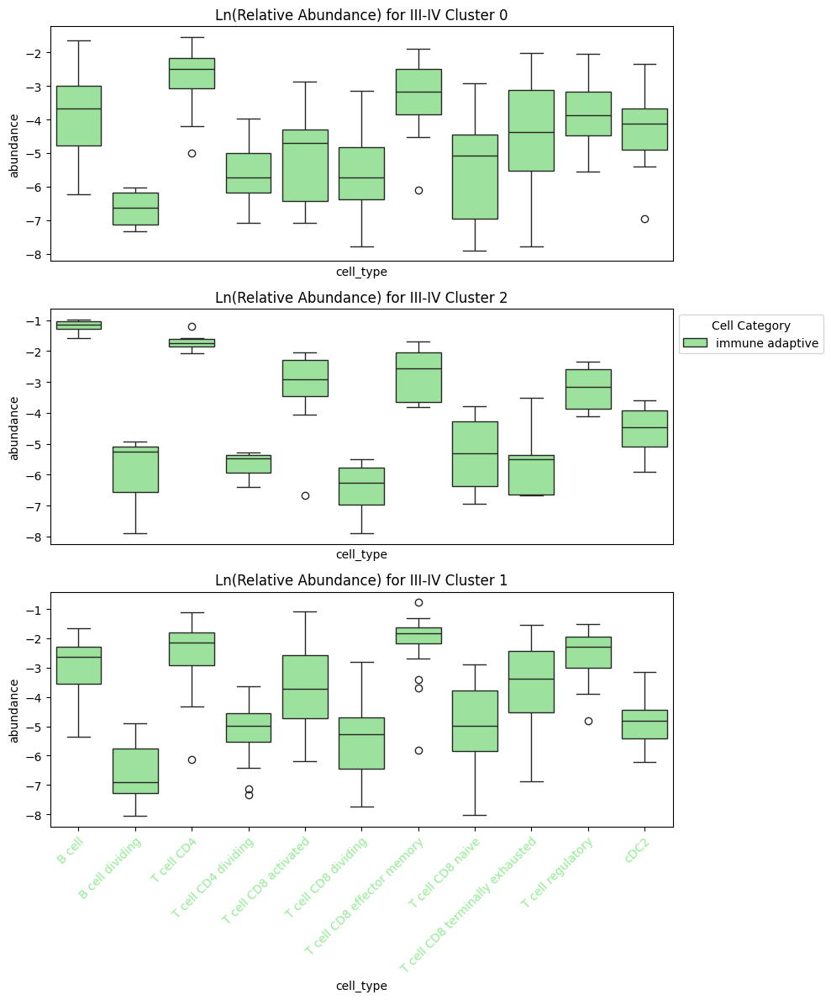

In [38]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 1
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
fig = plt.figure(figsize=(10, 4*nrows))


for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    cols = [col for col in corr_types.columns[:-2] if category_map(col) == 'immune adaptive' ]
    subset = subset[cols]    
    
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset, title=f"for {time_solo} Cluster {cluster_id}",
                                     category_map=category_map, cat_colors=abundance.color_map, ax=ax,
                                     xlabel_color='black')
    
    if i != 1:
        ax.get_legend().remove()

    if i // ncols != nrows - 1:
        if is_unpair and i == len(unique_clusters) - 2:
            continue
        
        ax.set_xticks([])
        ax.set_xticklabels([])


plt.tight_layout()
plt.show()

/tmp/ipykernel_341398/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


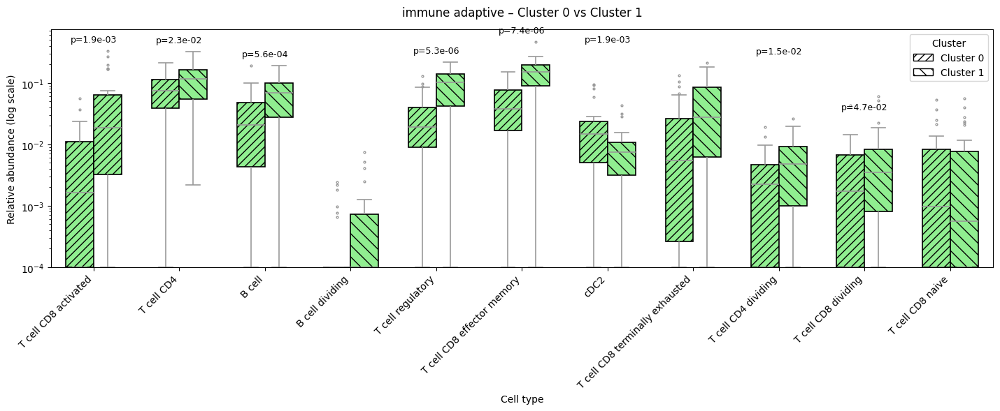

/tmp/ipykernel_341398/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


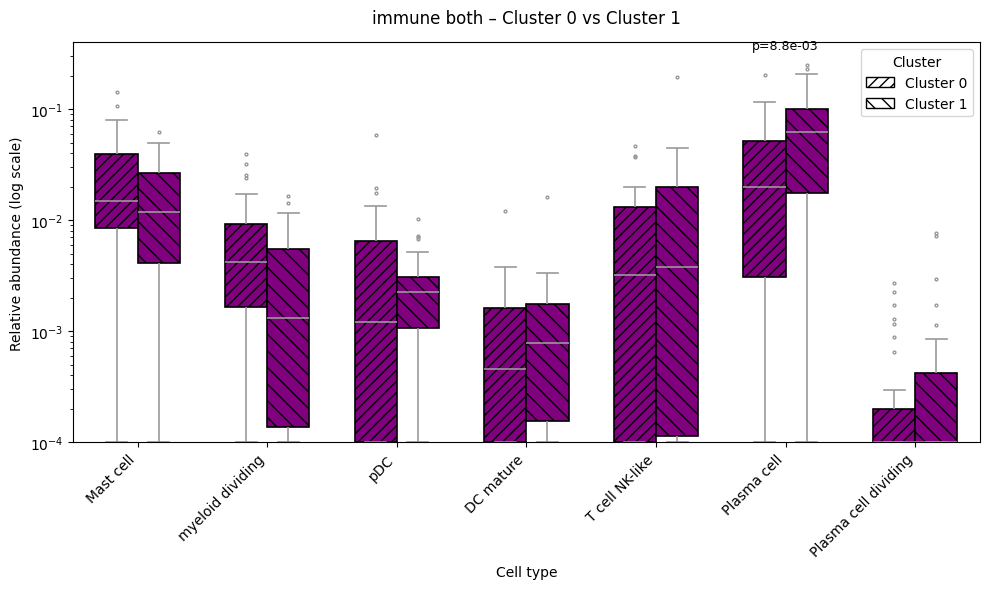

/tmp/ipykernel_341398/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


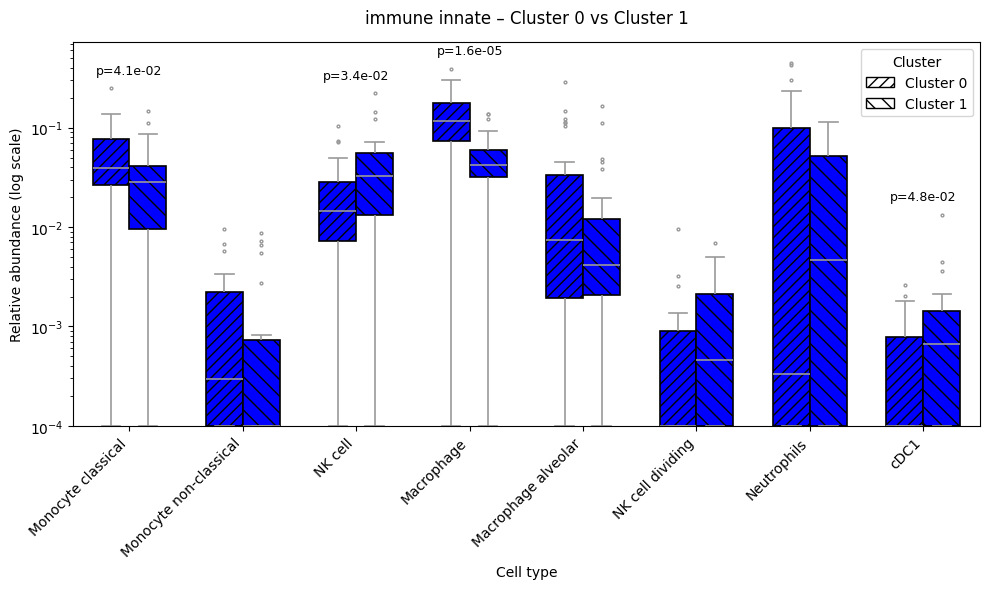

/tmp/ipykernel_341398/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


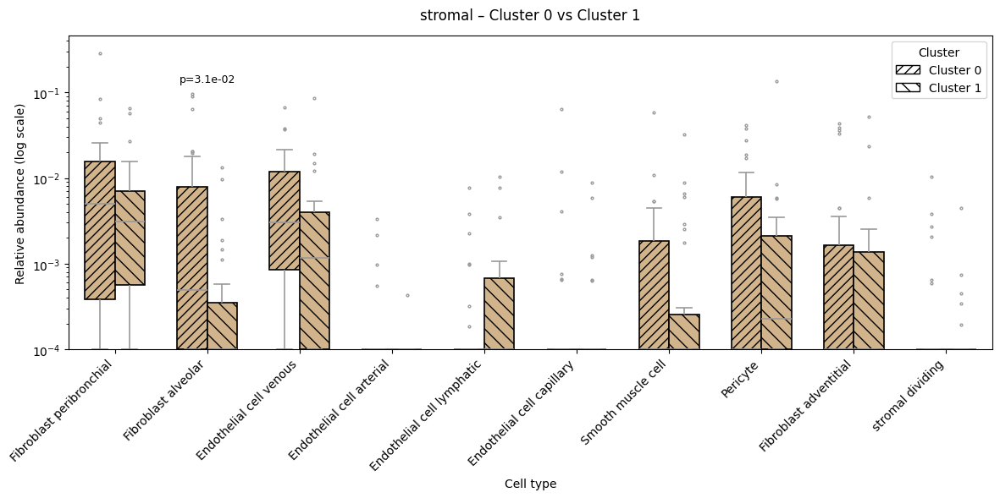

/tmp/ipykernel_341398/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


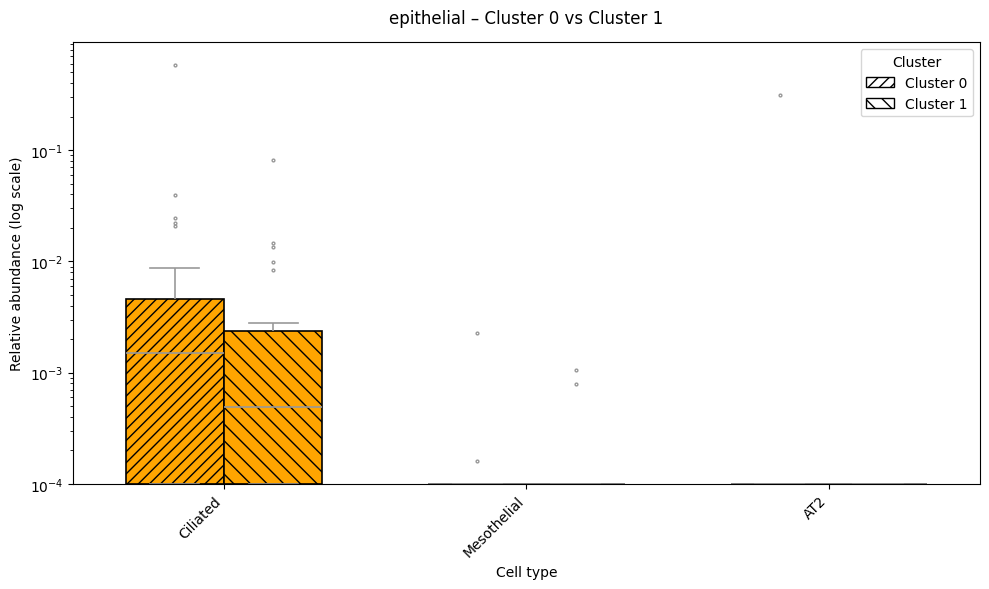

/tmp/ipykernel_341398/1639941335.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


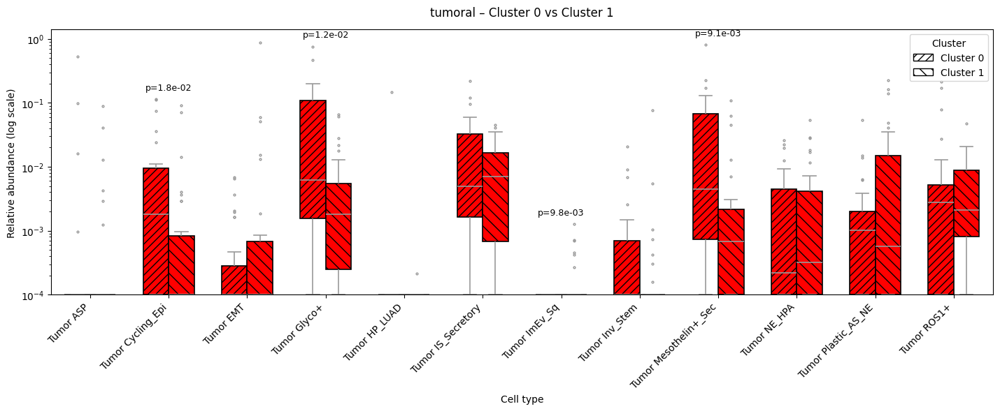

In [39]:
import seaborn as sns
from scipy.stats import mannwhitneyu
from matplotlib.patches import Patch, PathPatch

target_clusters = [0, 1]
cluster_hatches = {cluster: pattern for cluster, pattern in zip(target_clusters, ['///', '\\\\'])}

cluster_df = corr_types[corr_types['membership'].isin(target_clusters)].copy()
value_cols = [c for c in cluster_df.columns if c not in ('dataset', 'membership')]
long_df = (
    cluster_df.reset_index()
    .melt(id_vars=['sample', 'membership'], value_vars=value_cols,
          var_name='cell_type', value_name='abundance')
)
long_df['cell_category'] = long_df['cell_type'].map(abundance.cell_category_mapping)
long_df = long_df.dropna(subset=['cell_category'])
long_df['membership'] = long_df['membership'].astype(int)
long_df['abundance_plot'] = long_df['abundance'].clip(lower=1e-4)

category_colors = long_df[['cell_type', 'cell_category']].drop_duplicates()
category_colors['color'] = category_colors['cell_category'].apply(
    lambda cat: abundance.color_map.get(cat, '#bbbbbb')
)
cell_type_colors = dict(zip(category_colors['cell_type'], category_colors['color']))

for category, cell_types in abundance.cell_categories.items():
    # Get all cells in data belonging to this category
    cells_in_category = long_df[long_df['cell_category'] == category]['cell_type'].unique()
    
    # Start with cells that are in the predefined list (to preserve order)
    present_cells = [ct for ct in cell_types if ct in cells_in_category]
    
    # Append any other cells found in data for this category (e.g. new Tumor types)
    present_cells.extend([ct for ct in cells_in_category if ct not in present_cells])

    if not present_cells:
        continue
    # ...

    cat_df = long_df[long_df['cell_category'] == category].copy()
    fig_width = max(10, 1.2 * len(present_cells))
    fig, ax = plt.subplots(figsize=(fig_width, 6))

    sns.boxplot(
        data=cat_df,
        x='cell_type',
        y='abundance_plot',
        hue='membership',
        order=present_cells,
        hue_order=target_clusters,
        palette=['white'] * len(target_clusters),
        width=0.65,
        linewidth=1.2,
        fliersize=2,
        ax=ax,
    )

    num_clusters = len(target_clusters)
    num_cells = len(present_cells)
    boxes = [patch for patch in ax.patches if isinstance(patch, PathPatch)]
    for i, patch in enumerate(boxes):
        cluster_idx = i // num_cells
        cell_idx = i % num_cells
        if cluster_idx >= num_clusters:
            break
        cell_type = present_cells[cell_idx]
        cluster = target_clusters[cluster_idx]
        patch.set_facecolor(cell_type_colors.get(cell_type, '#bbbbbb'))
        patch.set_edgecolor('black')
        patch.set_alpha(1.0)
        patch.set_hatch(cluster_hatches[cluster])
    legend_handles = [
        Patch(facecolor='white', edgecolor='black', hatch=cluster_hatches[cluster],
              label=f'Cluster {cluster}')
        for cluster in target_clusters
    ]
    ax.legend(handles=legend_handles, title='Cluster', loc='upper right')

    ax.set_title(f'{category} – Cluster 0 vs Cluster 1', pad=14)
    ax.set_xlabel('Cell type')
    ax.set_ylabel('Relative abundance (log scale)')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

    y_min = cat_df['abundance_plot'].min()
    y_max = cat_df['abundance_plot'].max()
    ax.set_yscale('log')
    ax.set_ylim(max(1e-4, y_min * 0.8), y_max * 1.6)

    for idx, cell_type in enumerate(present_cells):
        group_vals = [
            cat_df[(cat_df['cell_type'] == cell_type) & (cat_df['membership'] == cluster)]['abundance'].dropna()
            for cluster in target_clusters
        ]
        if not all(len(vals) for vals in group_vals):
            continue

        _, p_value = mannwhitneyu(group_vals[0], group_vals[1], alternative='two-sided')
        if p_value >= 0.05:
            continue

        cell_max = cat_df[cat_df['cell_type'] == cell_type]['abundance_plot'].max()
        ax.text(idx, cell_max * 1.3, f'p={p_value:.1e}', ha='center', va='bottom', fontsize=9, color='black')

    plt.tight_layout()
    plt.show()


/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abundance.py:641: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  if 'color' in r.data_source.data:
/usr/local/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/root/host_home/sc-luca-explore/utils/abu

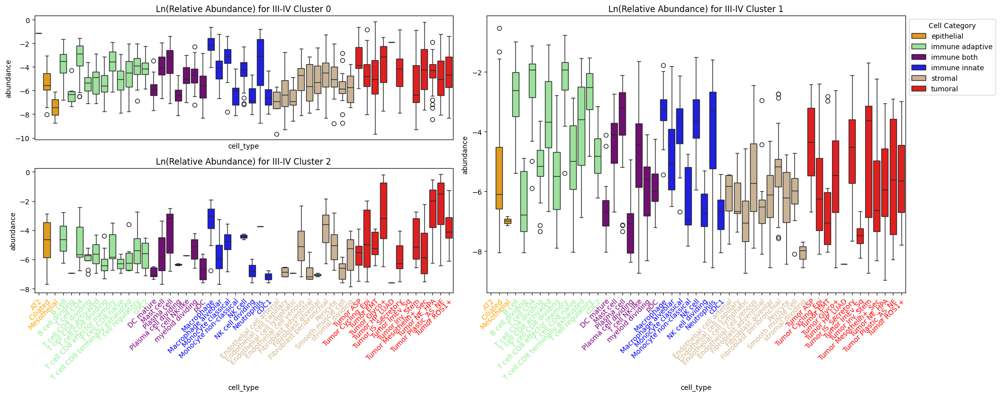

In [ ]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
nrows2 = nrows -1 if is_unpair else nrows
fig = plt.figure(figsize=(20, 4*nrows))


for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")    
    
    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    abundance.plot_celltype_boxplot(subset.drop(columns=['dataset']),title=f"for {time_solo} Cluster {cluster_id}",
                                     category_map=category_map, cat_colors=abundance.color_map, ax=ax)
    
    if i // ncols != nrows - 1:
        if is_unpair and i == len(unique_clusters) - 2:
            continue
        
        ax.set_xticks([])
        ax.set_xticklabels([])        
        
    if i != 1:
        ax.get_legend().remove()


plt.tight_layout()
plt.show()

### Coabundance GRAPHS

In [50]:
Gs = {}

/root/host_home/sc-luca-explore/utils/abundance.py:321: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  correlation, p_value = pearsonr(data[i], data[j])


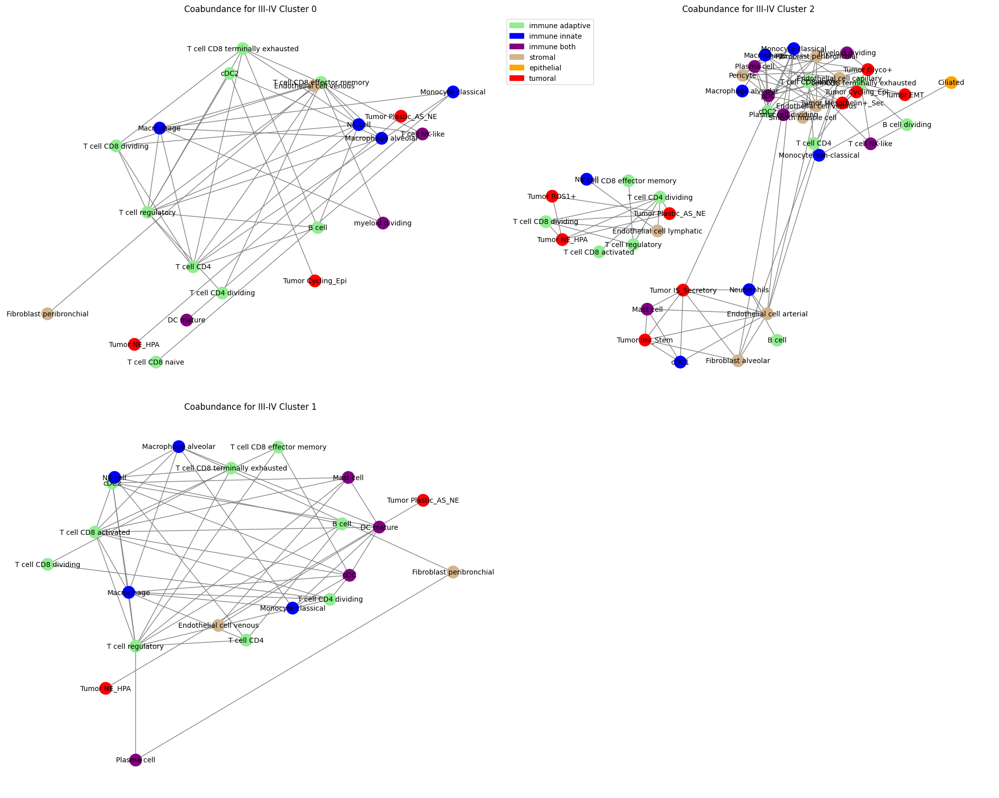

In [53]:
unique_clusters = corr_types["membership"].unique()
ncols = 2
nrows = (len(unique_clusters) + ncols - 1) // ncols
is_unpair = len(unique_clusters) % ncols == 1
fig = plt.figure(figsize=(20, 8*nrows))

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id]#.drop(columns="membership")

    rs = 2 if is_unpair and i == len(unique_clusters) - 2 else 1
    rs = 1
    ax = plt.subplot2grid((nrows, ncols), (i // ncols, i % ncols), rowspan=rs)

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    
    abundance.draw_graph(G, ax, f'Coabundance for {time_solo} Cluster {cluster_id}', scale2=7, font_size=10)
    ax.axis('off')
    if i != 1:
        ax.get_legend().remove()

plt.tight_layout()
plt.show()


### dEGREE CENTRAL

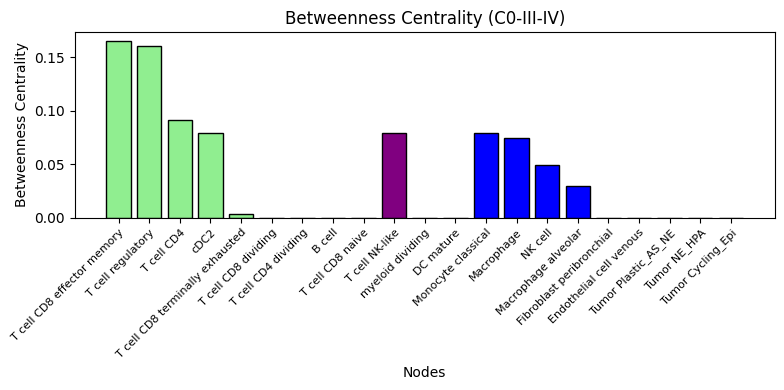

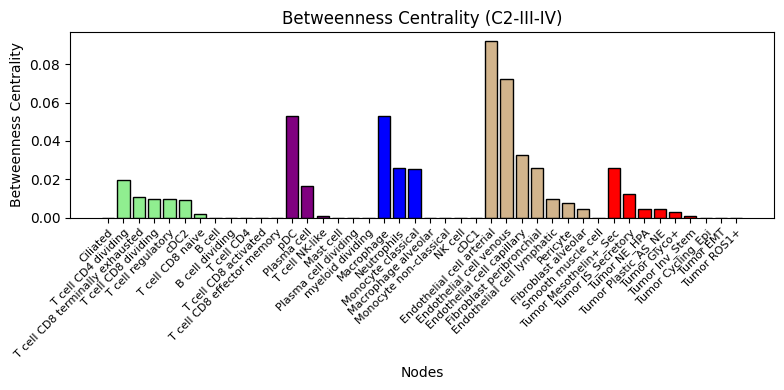

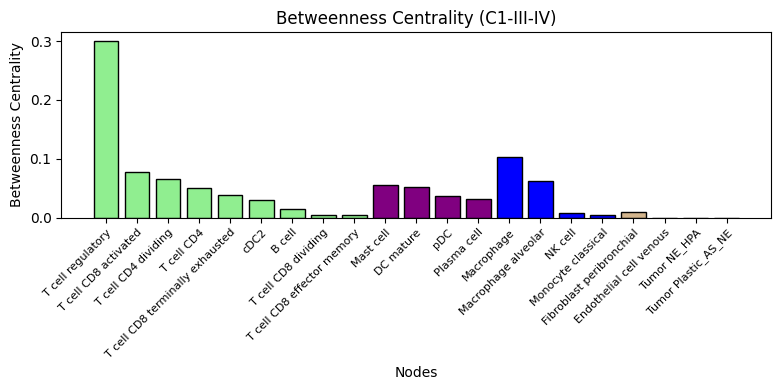

In [54]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    
    fig, ax = plt.subplots(figsize=(8, 4))

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    Gs[cluster_id] = abundance.plot_degree_centrality(G, time=f'C{cluster_id}-{time_solo}', ax=ax,
                                      betweenness=True
                                      )

    plt.tight_layout()
    plt.show()

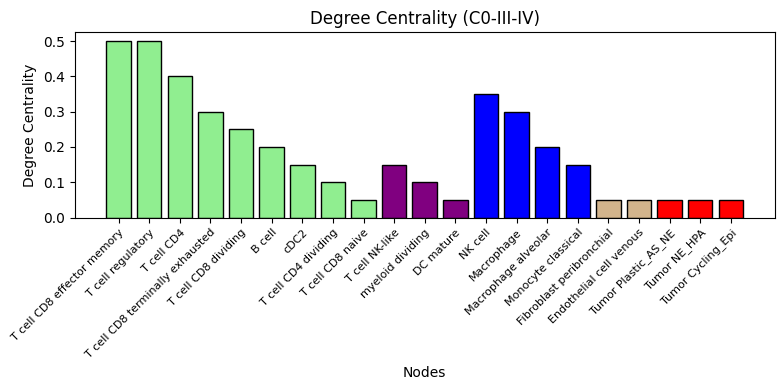

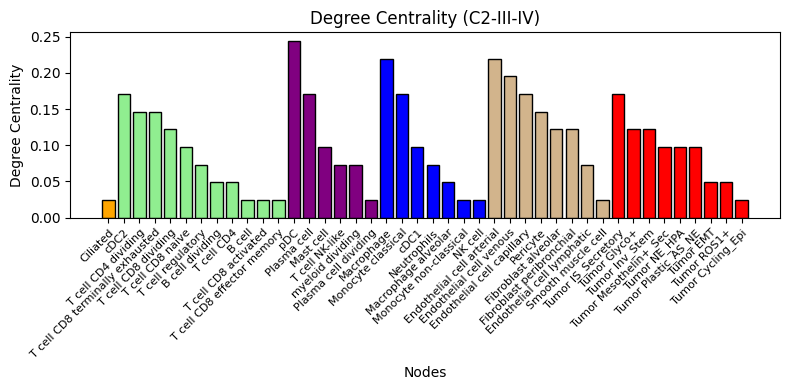

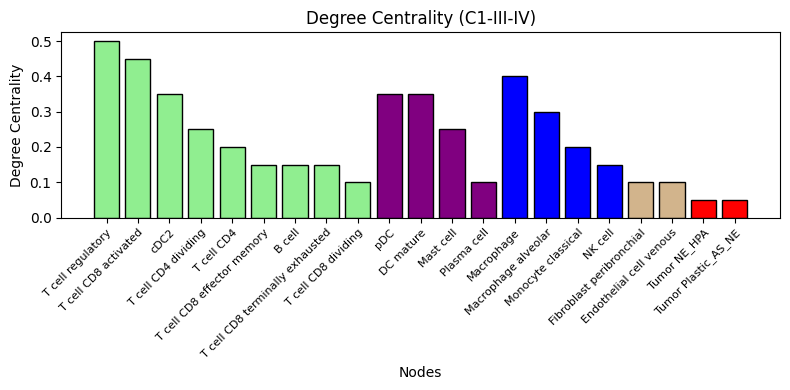

In [55]:
category_map = abundance.cell_category_mapping

unique_clusters = corr_types["membership"].unique()

for i, cluster_id in enumerate(unique_clusters):
    subset = corr_types[corr_types["membership"] == cluster_id].drop(columns="membership")
    
    fig, ax = plt.subplots(figsize=(8, 4))

    if cluster_id not in Gs.keys():        
        G = abundance.draw_pearson_graphs(subset, title=time, draw=False)
        Gs[cluster_id] = G
    else:
        G = Gs[cluster_id]

    Gs[cluster_id] = abundance.plot_degree_centrality(G, time=f'C{cluster_id}-{time_solo}', ax=ax,
                                      betweenness=False
                                      )

    plt.tight_layout()
    plt.show()

### Export graphs

In [ ]:
import pickle

for cluster_id, G in Gs.items():
    filename = f"{output_dir}/G_{time_solo}_{cluster_id}.pkl"
    with open(filename, "wb") as f:
        pickle.dump(G, f)
print("Saved all graphs in Gs.")

Saved all graphs in Gs.


### Sankey Plot

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

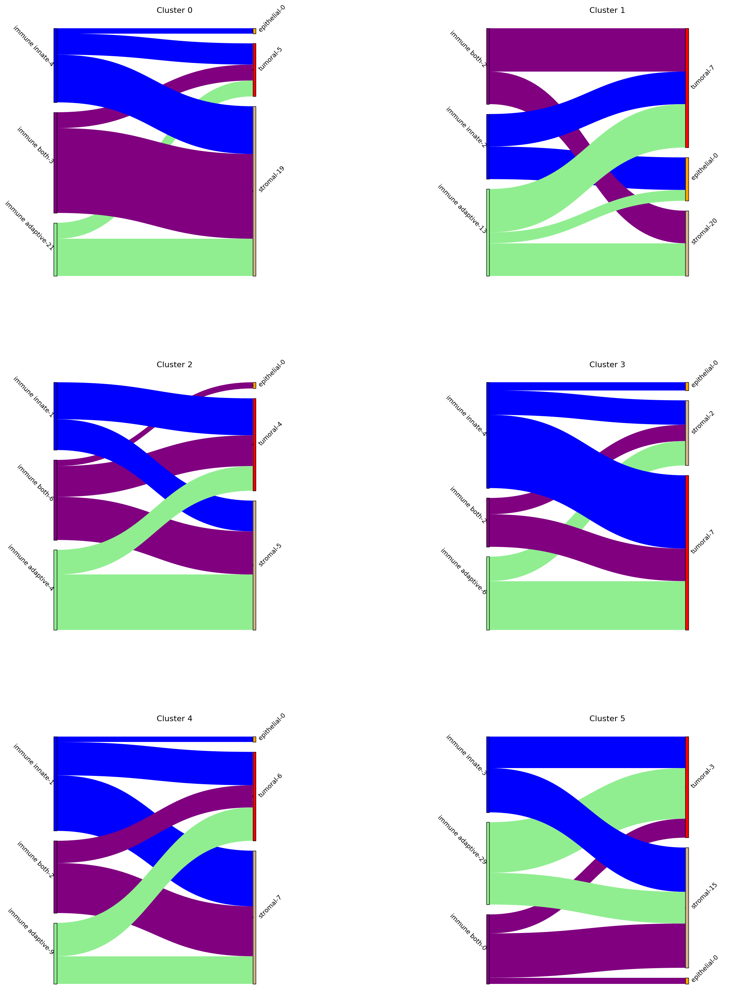

In [ ]:
import io
import holoviews as hv
import matplotlib.pyplot as plt
from IPython.display import display, Image

# Ensure matplotlib backend to preserve custom rotated labels hook in abundance.sankey
hv.extension('matplotlib')

use_gradients = False  # toggle Sankey ribbon gradients

# Build deterministically so order is stable
sankeys = {
    cid: abundance.sankey(
        Gs[cid],
        category_map,
        abundance.color_map,
        title=f'Cluster {cid}',
        gradients=use_gradients
    )
    for cid in sorted(Gs)
}

# Create layout (grid) of Sankey plots
layout = hv.NdLayout(sankeys, kdims=['Cluster']).cols(2)

# Backend-specific sizing
layout = layout.opts(
    hv.opts.Sankey(fig_inches=0.8, aspect=0.95, fontsize={'title': 16}, show_frame=False),
    hv.opts.Layout(tight=True, hspace=0.0, vspace=0.0)
 )

fig = hv.render(layout, backend='matplotlib')

buf = io.BytesIO()
fig.savefig(buf, format='png', bbox_inches='tight', dpi=100)
buf.seek(0)
display(Image(data=buf.read()))
plt.close(fig)

In [ ]:
hv.save(layout, f'{output_dir}/sankey_{time_solo}.png')  # Save the layout as a PNG file

## Both 


### Box plots


/tmp/ipykernel_33814/2236211946.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


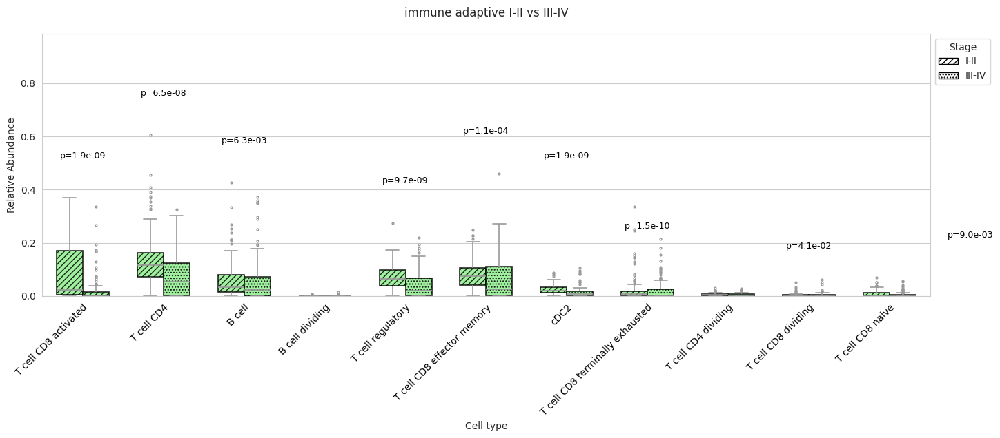

/tmp/ipykernel_33814/2236211946.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


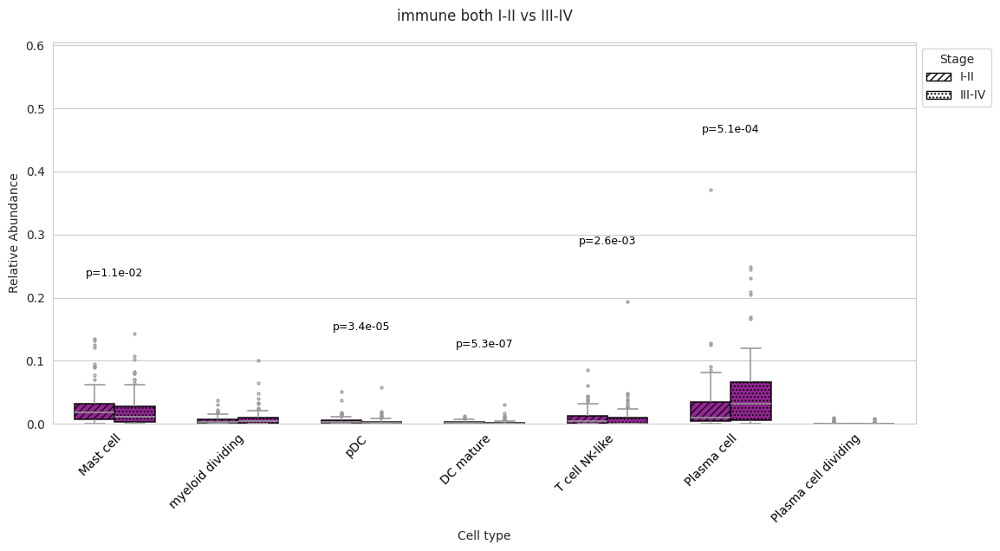

/tmp/ipykernel_33814/2236211946.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


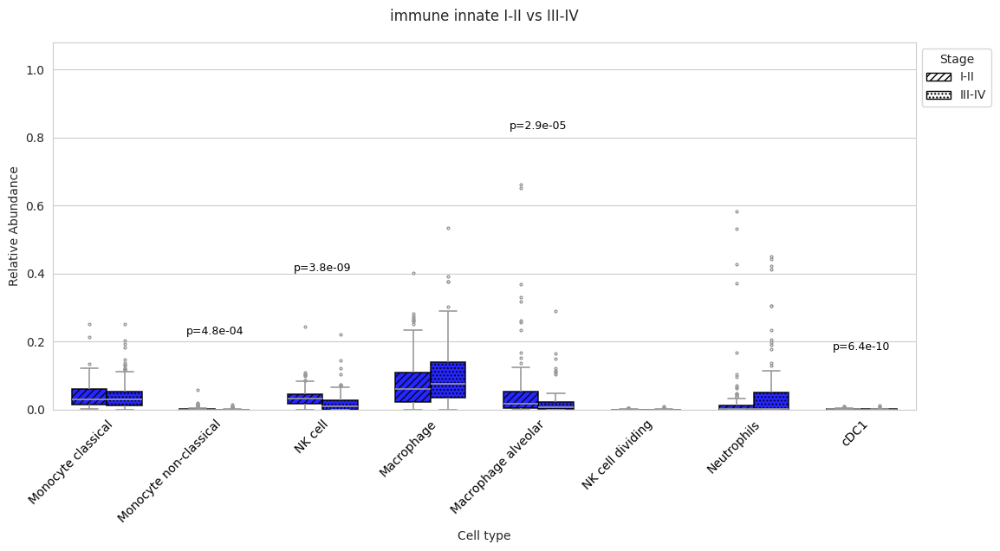

/tmp/ipykernel_33814/2236211946.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


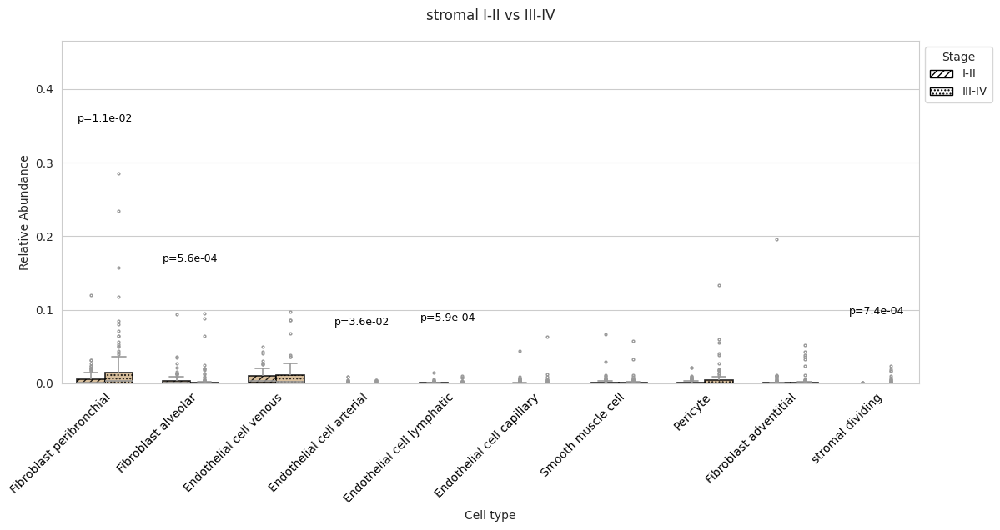

/tmp/ipykernel_33814/2236211946.py:99: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


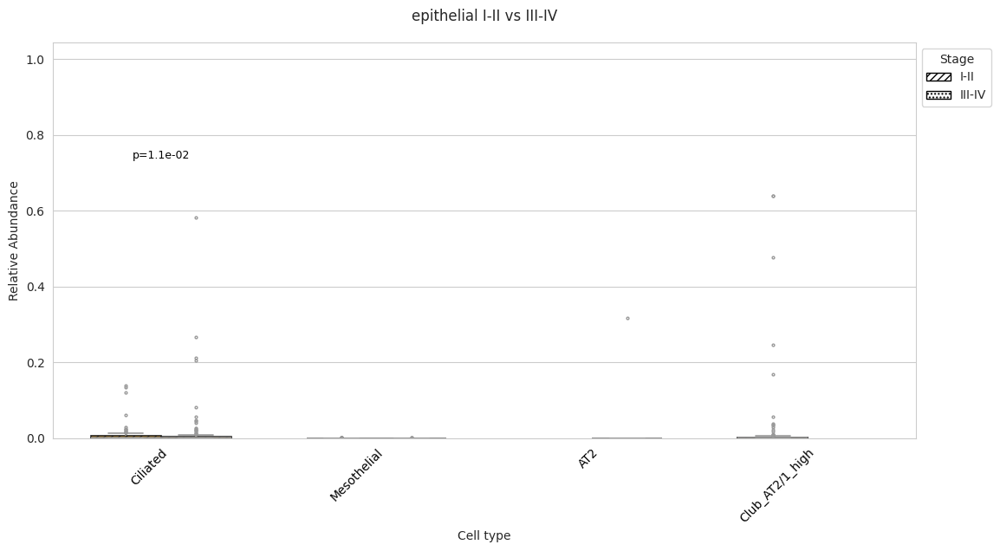

In [7]:
# Build paired stage data (I-II vs III-IV) and plot category-wise boxplots with Mann-Whitney tests
import numpy as np
import seaborn as sns
import matplotlib.patches as mpatches
from scipy.stats import mannwhitneyu

def _load_stage_abundance(time_label: str) -> pd.DataFrame:
    groups = pd.read_csv(f'{meta_folder}/groups_{time_label}.csv', index_col=0)
    groups.sort_values([cell_type_key, sample_key], inplace=True)
    groups.set_index([cell_type_key, sample_key], inplace=True)
    cutoff = groups.loc[:, '0']
    cutoff = pd.DataFrame(cutoff[cutoff > 1])
    samp_type = cutoff.unstack().transpose()
    samp_type = samp_type.fillna(0)
    corr = (samp_type.T / samp_type.T.sum()).T

    groups.reset_index(inplace=True)
    group_dataset = groups.groupby(['sample', 'dataset']).sum().reset_index()
    corr = pd.merge(
        corr,
        group_dataset.loc[:, [sample_key, 'dataset']],
        how='left',
        left_on=sample_key,
        right_on=sample_key,
    )
    corr.set_index(sample_key, inplace=True)
    return corr

stage_labels = ['I-II_leidenwu_funcnames', 'III-IV_leidenwu_funcnames']
stage_order = [label.split('_')[0] for label in stage_labels]
stage_patterns = {stage_order[0]: '////', stage_order[1]: '....'}

stage_frames = []
for label in stage_labels:
    stage_df = _load_stage_abundance(label).drop(columns=['membership'], errors='ignore')
    stage_df = stage_df.drop(columns=['dataset'], errors='ignore')
    melted = (
        stage_df.reset_index()
        .melt(id_vars=[sample_key], var_name='cell_type', value_name='abundance')
    )
    melted['stage'] = label.split('_')[0]
    stage_frames.append(melted)

paired_df = pd.concat(stage_frames, ignore_index=True)
paired_df['cell_category'] = paired_df['cell_type'].map(abundance.cell_category_mapping)
paired_df = paired_df.dropna(subset=['cell_category'])
paired_df['abundance'] = paired_df['abundance'].clip(lower=0)
paired_df = paired_df.replace([np.inf, -np.inf], np.nan).dropna(subset=['abundance'])

sns.set_style('whitegrid')

for category, cell_types in abundance.cell_categories.items():
    cat_df = paired_df[paired_df['cell_category'] == category]
    present_cells = [ct for ct in cell_types if ct in cat_df['cell_type'].unique()]
    if cat_df.empty or not present_cells:
        continue

    fig_width = max(12, 1.25 * len(present_cells))
    fig, ax = plt.subplots(figsize=(fig_width, 6.8))
    sns.boxplot(
        data=cat_df,
        x='cell_type',
        y='abundance',
        hue='stage',
        hue_order=stage_order,
        order=present_cells,
        palette=['white'] * len(stage_order),
        ax=ax,
        width=0.65,
        fliersize=2,
        linewidth=1.2,
    )

    patches = [patch for patch in ax.patches if isinstance(patch, mpatches.PathPatch)]
    num_cells = len(present_cells)
    num_stages = len(stage_order)
    for i, patch in enumerate(patches):
        stage_idx = i // num_cells
        cell_idx = i % num_cells
        if stage_idx >= num_stages:
            break
        cell_type = present_cells[cell_idx]
        stage = stage_order[stage_idx]
        cat_color = abundance.color_map.get(abundance.cell_category_mapping(cell_type), '#888888')
        patch.set_facecolor(cat_color)
        patch.set_edgecolor('black')
        patch.set_alpha(0.85)
        patch.set_hatch(stage_patterns.get(stage, ''))

    legend_handles = [
        mpatches.Patch(facecolor='white', edgecolor='black', hatch=stage_patterns[stage], label=stage)
        for stage in stage_order
    ]
    ax.legend(handles=legend_handles, title='Stage', bbox_to_anchor=(1, 1), loc='upper left')

    ax.set_title(f'{category} I-II vs III-IV', pad=18)
    ax.set_xlabel('Cell type')
    ax.set_ylabel('Relative Abundance')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
    ax.tick_params(axis='x', colors='black')

    y_min = cat_df['abundance'].min()
    y_max = cat_df['abundance'].max()
    y_range = y_max - y_min
    pad = 0.18 * y_range if y_range > 0 else 0.05
    upper_pad = pad * 3.5 if y_range > 0 else 0.5
    ax.set_ylim(max(0, y_min - pad), y_max + upper_pad)

    for idx, cell_type in enumerate(present_cells):
        stage_values = [
            cat_df[(cat_df['cell_type'] == cell_type) & (cat_df['stage'] == stage)]['abundance'].dropna()
            for stage in stage_order
        ]
        if not all(len(vals) for vals in stage_values):
            continue
        _, p_value = mannwhitneyu(stage_values[0], stage_values[1], alternative='two-sided')
        if p_value >= 0.05:
            continue

        label = f'p={p_value:.1e}'
        cell_y = max(vals.max() for vals in stage_values)
        max_y = ax.get_ylim()[1] - pad * 0.6
        text_y = min(cell_y + pad * 1.3, max_y)
        ax.text(
            idx,
            text_y,
            label,
            ha='center',
            va='bottom',
            fontsize=9,
            color='black',
        )

    plt.tight_layout(rect=[0, 0, 0.97, 0.95])
    plt.show()



/tmp/ipykernel_49774/1231454325.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


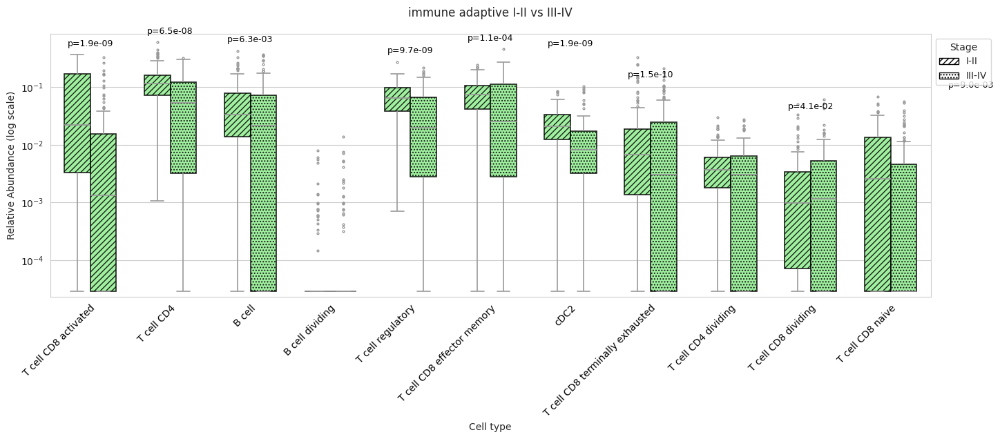

/tmp/ipykernel_49774/1231454325.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


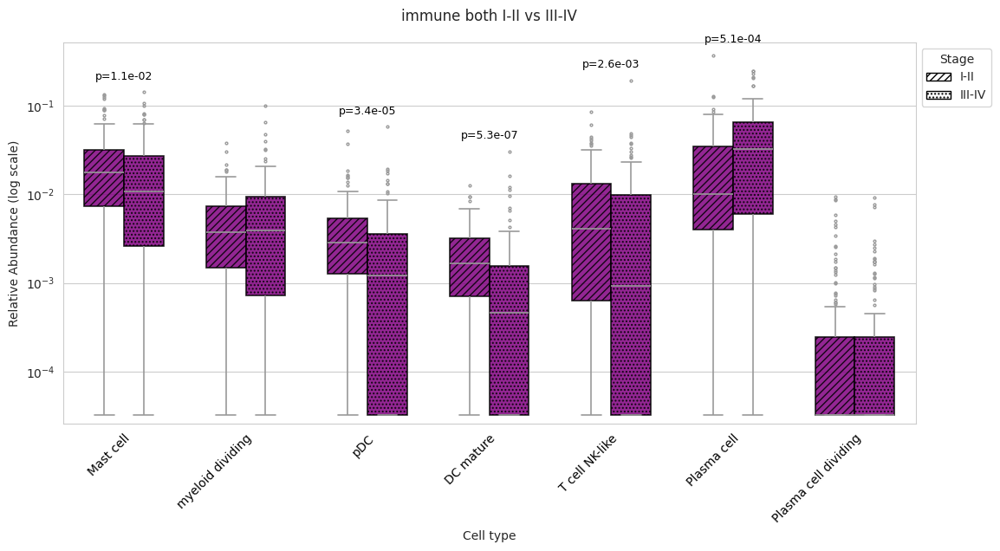

/tmp/ipykernel_49774/1231454325.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


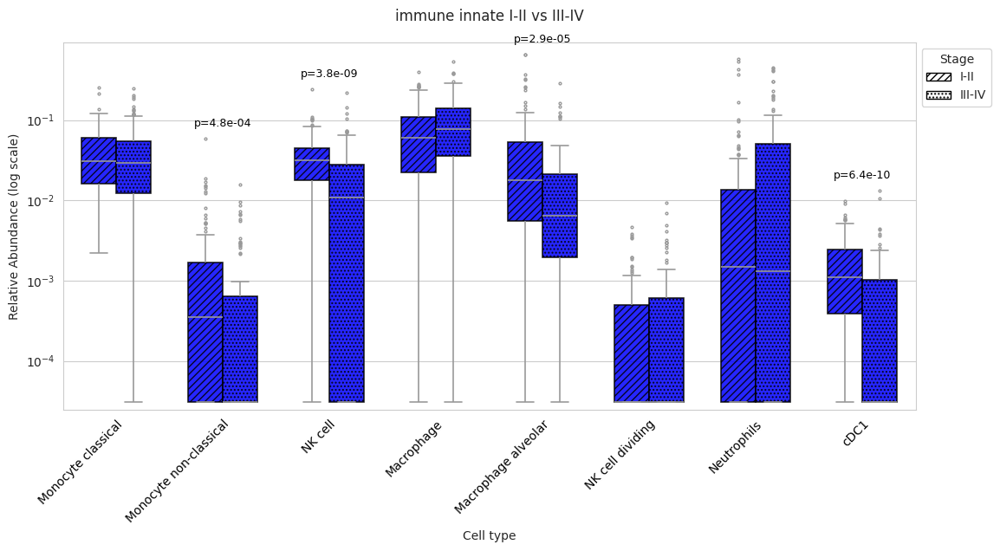

/tmp/ipykernel_49774/1231454325.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


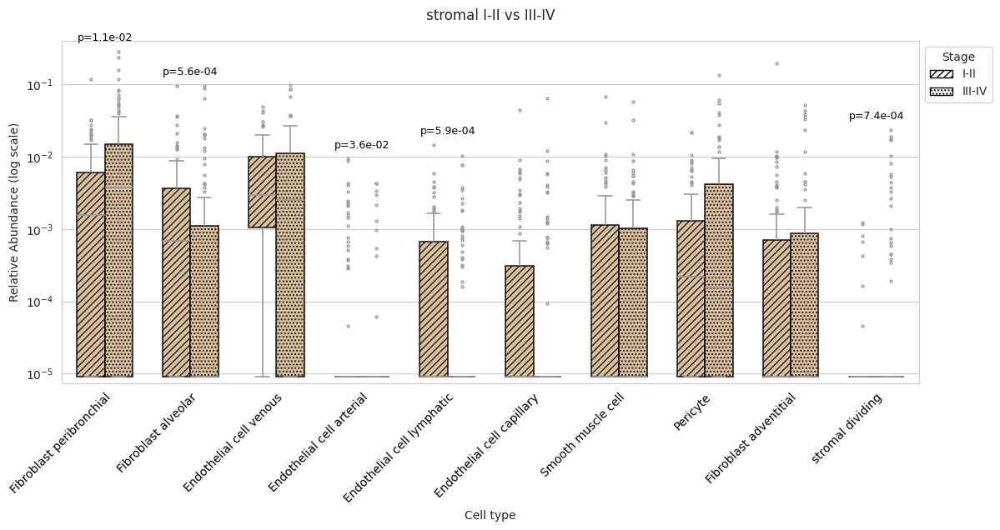

/tmp/ipykernel_49774/1231454325.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')


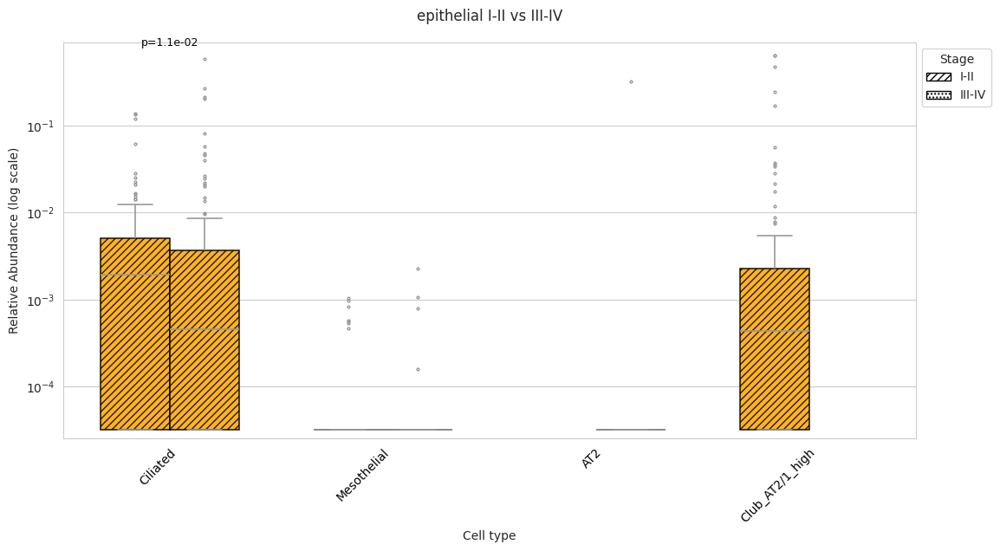

In [ ]:
# Build paired stage data (I-II vs III-IV) and plot category-wise boxplots with Mann-Whitney tests
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.patches as mpatches
from scipy.stats import mannwhitneyu

def _load_stage_abundance(time_label: str) -> pd.DataFrame:
    groups = pd.read_csv(f'{meta_folder}/groups_{time_label}.csv', index_col=0)
    groups.sort_values([cell_type_key, sample_key], inplace=True)
    groups.set_index([cell_type_key, sample_key], inplace=True)
    cutoff = groups.loc[:, '0']
    cutoff = pd.DataFrame(cutoff[cutoff > 1])
    samp_type = cutoff.unstack().transpose()
    samp_type = samp_type.fillna(0)
    corr = (samp_type.T / samp_type.T.sum()).T

    groups.reset_index(inplace=True)
    group_dataset = groups.groupby(['sample', 'dataset']).sum().reset_index()
    corr = pd.merge(
        corr,
        group_dataset.loc[:, [sample_key, 'dataset']],
        how='left',
        left_on=sample_key,
        right_on=sample_key,
    )
    corr.set_index(sample_key, inplace=True)
    return corr

stage_labels = ['I-II_leidenwu_funcnames', 'III-IV_leidenwu_funcnames']
stage_order = [label.split('_')[0] for label in stage_labels]
stage_patterns = {stage_order[0]: '////', stage_order[1]: '....'}

stage_frames = []
for label in stage_labels:
    stage_df = _load_stage_abundance(label).drop(columns=['membership'], errors='ignore')
    stage_df = stage_df.drop(columns=['dataset'], errors='ignore')
    melted = (
        stage_df.reset_index()
        .melt(id_vars=[sample_key], var_name='cell_type', value_name='abundance')
    )
    melted['stage'] = label.split('_')[0]
    stage_frames.append(melted)

paired_df = pd.concat(stage_frames, ignore_index=True)
paired_df['cell_category'] = paired_df['cell_type'].map(abundance.cell_category_mapping)
paired_df = paired_df.dropna(subset=['cell_category'])
paired_df['abundance'] = paired_df['abundance'].clip(lower=0)
paired_df = paired_df.replace([np.inf, -np.inf], np.nan).dropna(subset=['abundance'])

sns.set_style('whitegrid')

for category, cell_types in abundance.cell_categories.items():
    cat_df = paired_df[paired_df['cell_category'] == category]
    present_cells = [ct for ct in cell_types if ct in cat_df['cell_type'].unique()]
    if cat_df.empty or not present_cells:
        continue

    cat_df = cat_df.copy()
    positive_vals = cat_df.loc[cat_df['abundance'] > 0, 'abundance']
    log_floor = max(1e-6, positive_vals.min() / 5 if not positive_vals.empty else 1e-6)
    cat_df['abundance_plot'] = cat_df['abundance'].clip(lower=log_floor)

    fig_width = max(12, 1.25 * len(present_cells))
    fig, ax = plt.subplots(figsize=(fig_width, 6.8))
    sns.boxplot(
        data=cat_df,
        x='cell_type',
        y='abundance_plot',
        hue='stage',
        hue_order=stage_order,
        order=present_cells,
        palette=['white'] * len(stage_order),
        ax=ax,
        width=0.65,
        fliersize=2,
        linewidth=1.2,
    )
    ax.set_yscale('log')

    patches = [patch for patch in ax.patches if isinstance(patch, mpatches.PathPatch)]
    num_cells = len(present_cells)
    num_stages = len(stage_order)
    for i, patch in enumerate(patches):
        stage_idx = i // num_cells
        cell_idx = i % num_cells
        if stage_idx >= num_stages:
            break
        cell_type = present_cells[cell_idx]
        stage = stage_order[stage_idx]
        cat_color = abundance.color_map.get(abundance.cell_category_mapping(cell_type), '#888888')
        patch.set_facecolor(cat_color)
        patch.set_edgecolor('black')
        patch.set_alpha(0.85)
        patch.set_hatch(stage_patterns.get(stage, ''))

    legend_handles = [
        mpatches.Patch(facecolor='white', edgecolor='black', hatch=stage_patterns[stage], label=stage)
        for stage in stage_order
    ]
    ax.legend(handles=legend_handles, title='Stage', bbox_to_anchor=(1, 1), loc='upper left')

    ax.set_title(f'{category} I-II vs III-IV', pad=18)
    ax.set_xlabel('Cell type')
    ax.set_ylabel('Relative Abundance (log scale)')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
    ax.tick_params(axis='x', colors='black')

    y_min = cat_df['abundance_plot'].min()
    y_max = cat_df['abundance_plot'].max()
    ax.set_ylim(y_min * 0.8, y_max * 1.4)

    for idx, cell_type in enumerate(present_cells):
        stage_values = [
            cat_df[(cat_df['cell_type'] == cell_type) & (cat_df['stage'] == stage)]['abundance'].dropna()
            for stage in stage_order
        ]
        stage_plot_values = [
            cat_df[(cat_df['cell_type'] == cell_type) & (cat_df['stage'] == stage)]['abundance_plot'].dropna()
            for stage in stage_order
        ]
        if not all(len(vals) for vals in stage_values):
            continue
        _, p_value = mannwhitneyu(stage_values[0], stage_values[1], alternative='two-sided')
        if p_value >= 0.05:
            continue

        label = f'p={p_value:.1e}'
        cell_y = max(vals.max() for vals in stage_plot_values)
        max_y = ax.get_ylim()[1]
        text_y = min(cell_y * 1.3, max_y / 0.95)
        ax.text(
            idx,
            text_y,
            label,
            ha='center',
            va='bottom',
            fontsize=9,
            color='black',
        )

    plt.tight_layout(rect=[0, 0, 0.97, 0.95])
    plt.show()
